<img src="https://rationalnumbers.ru/pictures/photo_2020-09-20_01-54-19.jpg" width="600" height="400">

<a id="about"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">About Project & Dataset</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 🎯 Objective:a

To categorize countries based on socio-economic and health indicators to identify which ones are most in need of aid.

⸻

🏢 Organization Background:

HELP International is an NGO focused on fighting poverty and helping underdeveloped countries during disasters.

⸻

🧩 Problem Statement:

HELP International has raised $10 million and wants to strategically allocate this fund to the countries in greatest need🎯 Objective:a

To categorize countries based on socio-economic and health indicators to identify which ones are most in need of aid.

⸻

🏢 Organization Background:

HELP International is an NGO focused on fighting poverty and helping underdeveloped countries during disasters.

⸻

🧩 Problem Statement:

HELP International has raised $10 million and wants to strategically allocate this fund to the countries in greatest need

<table border="1" cellpadding="8" cellspacing="0">
  <thead>
    <tr>
      <th>Variable Name</th>
      <th>Description</th>
      <th>Sample Data</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>country</td>
      <td>Name of the country</td>
      <td>Afghanistan, Albania, ...</td>
    </tr>
    <tr>
      <td>child_mort</td>
      <td>Child mortality rate (deaths under age 5 per 1000 live births)</td>
      <td>90.2, 16.6, ...</td>
    </tr>
    <tr>
      <td>exports</td>
      <td>Exports of goods and services, expressed as a percentage of total GDP</td>
      <td>10, 28, ...</td>
    </tr>
    <tr>
      <td>health</td>
      <td>Total health expenditure, expressed as a percentage of total GDP</td>
      <td>7.58, 6.55, ...</td>
    </tr>
    <tr>
      <td>imports</td>
      <td>Imports of goods and services, expressed as a percentage of total GDP</td>
      <td>44.9, 48.6, ...</td>
    </tr>
    <tr>
      <td>income</td>
      <td>Net income per person (in USD)</td>
      <td>1610, 9930, ...</td>
    </tr>
    <tr>
      <td>inflation</td>
      <td>Annual inflation rate (% change in GDP)</td>
      <td>9.44, 4.49, ...</td>
    </tr>
    <tr>
      <td>life_expec</td>
      <td>Life expectancy at birth (in years)</td>
      <td>56.2, 76.3, ...</td>
    </tr>
    <tr>
      <td>total_fer</td>
      <td>Total fertility rate (average number of children per woman)</td>
      <td>5.82, 1.65, ...</td>
    </tr>
    <tr>
      <td>gdpp</td>
      <td>Gross Domestic Product (GDP) per capita (in USD)</td>
      <td>553, 4090, ...</td>
    </tr>
  </tbody>
</table>

<a id="pre"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Preprocessing & Visualization</p>

In [1]:
!pip install pycountry_convert
!pip install kneed
!pip install -U kaleido
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
from sklearn import metrics
from kneed import KneeLocator
from kneed import KneeLocator
from itertools import product
from sklearn import set_config
import plotly.graph_objs as go
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from scipy.cluster import hierarchy 
from sklearn.impute import KNNImputer
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA
from matplotlib.cbook import boxplot_stats
from plotly.subplots import make_subplots
from ydata_profiling import ProfileReport
from scipy.spatial import distance_matrix 
from sklearn.cluster import MiniBatchKMeans
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, estimate_bandwidth, AffinityPropagation, Birch, DBSCAN, OPTICS, AgglomerativeClustering 
import warnings 
warnings.filterwarnings("ignore")
import requests
try:
    import pycountry_convert as pc
except:
    
    import pycountry_convert as pc
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True) 
from sklearn import set_config
from itertools import product

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.9/249.9 kB 11.2 MB/s eta 0:00:00
  Attempting uninstall: coverage
    Found existing installation: coverage 7.9.1
    Uninstalling coverage-7.9.1:
      Successfully uninstalled coverage-7.9.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.3/66.3 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 1.9 MB/s eta 0:00:00


In [2]:
data = pd.read_csv("/kaggle/input/d/rohan0301/unsupervised-learning-on-country-data/Country-data.csv")
df=data.copy()
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [3]:
df.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

In [4]:
df.shape

(167, 10)

there are 10 columns & 167 rows in this dataset

In [5]:
def check_df(df: object, head: object = 5) -> object:
    print("\nShape")
    print(df.shape)
    print("\nTypes")
    print(df.dtypes)
    print("\nNANs")
    print(df.isnull().sum())
    print("\nInfo")
    print(df.info())
check_df(df)


Shape
(167, 10)

Types
country        object
child_mort    float64
exports       float64
health        float64
imports       float64
income          int64
inflation     float64
life_expec    float64
total_fer     float64
gdpp            int64
dtype: object

NANs
country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

Info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 

In [6]:
print('Number of duplicated rows: ' , len(df[df.duplicated()]))

Number of duplicated rows:  0


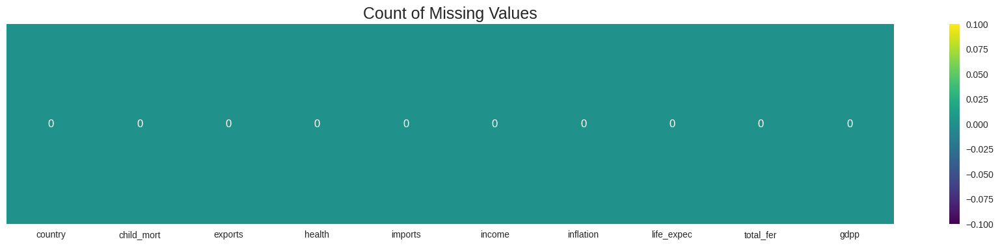

In [7]:
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap='viridis', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=18)
plt.show()

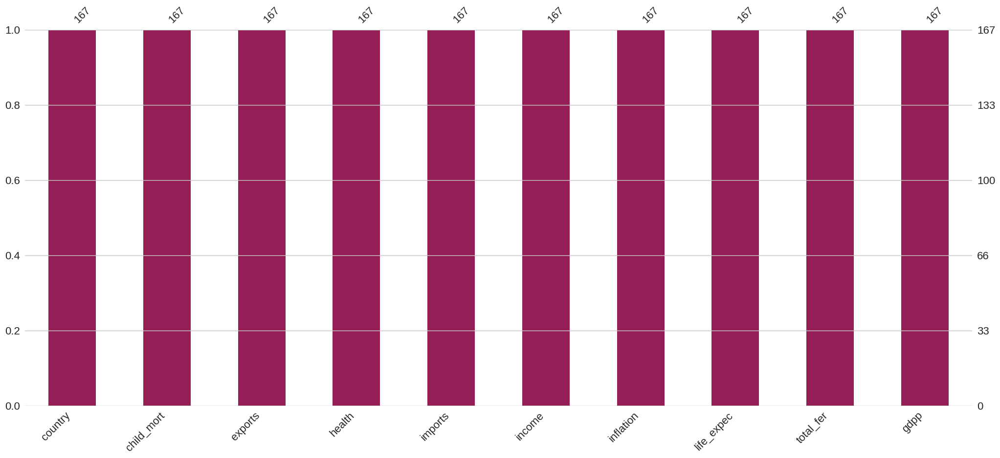

In [8]:
import missingno as msno
msno.bar(df, color="#941e55")
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

-The dataset contains 313 records in total.

There are no duplicate rows and no missing (NaN) values.

All variables are of type float64 except for country (object), and income and gdpp (both int64)

In [9]:
df.describe()[1:].T.style.background_gradient(cmap='viridis', axis=1)

,mean,std,min,25%,50%,75%,max
child_mort,38.270060,40.328931,2.600000,8.250000,19.300000,62.100000,208.000000
exports,41.108976,27.412010,0.109000,23.800000,35.000000,51.350000,200.000000
health,6.815689,2.746837,1.810000,4.920000,6.320000,8.600000,17.900000
imports,46.890215,24.209589,0.065900,30.200000,43.300000,58.750000,174.000000
income,17144.688623,19278.067698,609.000000,3355.000000,9960.000000,22800.000000,125000.000000
inflation,7.781832,10.570704,-4.210000,1.810000,5.390000,10.750000,104.000000
life_expec,70.555689,8.893172,32.100000,65.300000,73.100000,76.800000,82.800000
total_fer,2.947964,1.513848,1.150000,1.795000,2.410000,3.880000,7.490000
gdpp,12964.155689,18328.704809,231.000000,1330.000000,4660.000000,14050.000000,105000.000000


In [10]:
df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
country,167,167,Afghanistan,1


<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">


- The table above provides statistical insights.

 In economics, deflation refers to a decrease in the general price level, occurring when inflation drops 

below 0%.
While inflation erodes the value of money, deflation increases it.

Therefore, negative inflation values in the dataset are normal.

In [11]:
# finding unique data
df.apply(lambda x: len(x.unique()))


country       167
child_mort    139
exports       147
health        147
imports       151
income        156
inflation     156
life_expec    127
total_fer     138
gdpp          157
dtype: int64

In [12]:
unique = df.nunique().sort_values()
unique_values = df.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
child_mort,139,"[90.2, 16.6, 27.3, 119.0, 10.3, 14.5, 18.1, 4...."
country,167,"[Afghanistan, Albania, Algeria, Angola, Antigu..."
exports,147,"[10.0, 28.0, 38.4, 62.3, 45.5, 18.9, 20.8, 19...."
gdpp,157,"[553, 4090, 4460, 3530, 12200, 10300, 3220, 51..."
health,147,"[7.58, 6.55, 4.17, 2.85, 6.03, 8.1, 4.4, 8.73,..."
imports,151,"[44.9, 48.6, 31.4, 42.9, 58.9, 16.0, 45.3, 20...."
income,156,"[1610, 9930, 12900, 5900, 19100, 18700, 6700, ..."
inflation,156,"[9.44, 4.49, 16.1, 22.4, 1.44, 20.9, 7.77, 1.1..."
life_expec,127,"[56.2, 76.3, 76.5, 60.1, 76.8, 75.8, 73.3, 82...."
total_fer,138,"[5.82, 1.65, 2.89, 6.16, 2.13, 2.37, 1.69, 1.9..."


In [13]:
df = df.copy()
#Calculates the actual health expenditure per person in USD.

df['health'] = df['health'] * df['gdpp']/100
df['exports'] = df['exports'] * df['gdpp']/100
#Calculates the actual export value per person in USD.
df['imports'] = df['imports'] * df['gdpp']/100
#Calculates the actual import value per person in USD.
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553
1,Albania,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460
3,Angola,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,393.00,67.8580,450.640,4480,23.60,67.5,4.67,1310


Now, the variables health, exports, and imports are expressed as real monetary values instead of just

 percentages

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Visualization</p>

In [14]:
df1 = df.drop('country', axis=1)

In [15]:
import plotly.express as px
z = df1.corr()
fig = px.imshow(z, text_auto=True,aspect="auto", color_continuous_scale='viridis')
fig.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- Darker colors = Stronger correlation

 • Positive values close to 1 → Strong positive correlation

 • Negative values close to -1 → Strong negative correlation
 
 • Values near 0 → No significant correlation

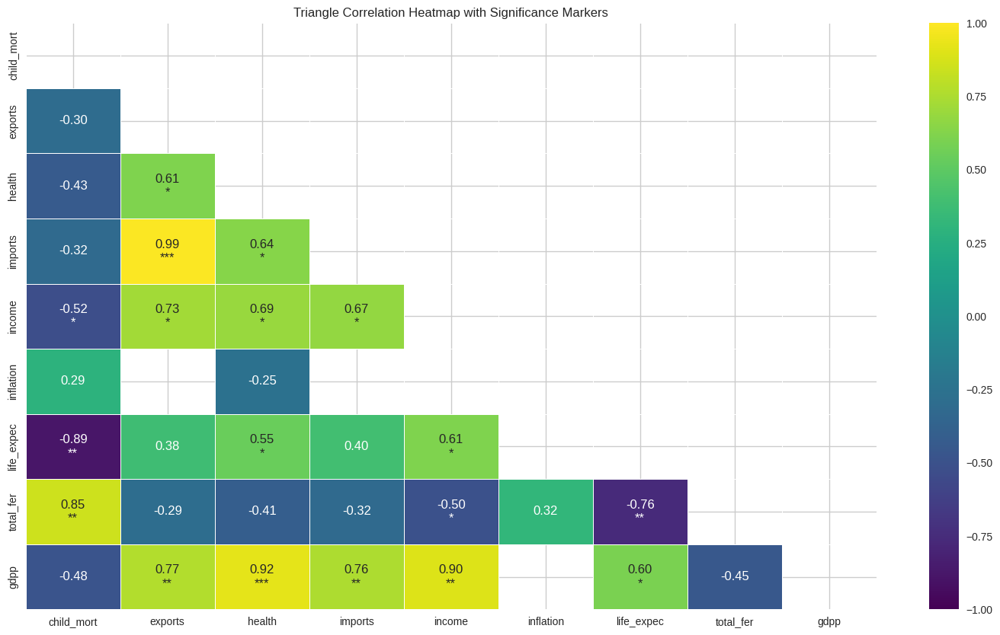

In [16]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

corr = df1.corr()


mask = np.triu(np.ones_like(corr, dtype=bool))
cut_off = 0.25
filtered = corr.where(np.abs(corr) >= cut_off).where(~mask)


e1, e2, e3 = 0.5, 0.75, 0.9


annot = [[
    f"{val:.2f}" + 
    ("\n*" if abs(val) >= e1 else "") + 
    ("*" if abs(val) >= e2 else "") + 
    ("*" if abs(val) >= e3 else "")
    if not np.isnan(val) else ""
    for val in row
] for row in filtered.to_numpy()]


plt.figure(figsize=(18, 10))
sns.heatmap(filtered, cmap='viridis', annot=annot, fmt='', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Triangle Correlation Heatmap with Significance Markers')
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">


- .Imports and exports exhibit a strong positive correlation, reflecting their economic interdependence.

 • GDP per capita (gdpp) is significantly correlated with both health expenditure and income, suggesting 
 
 that wealthier nations invest more in healthcare and generate higher earnings.

 • Inflation shows minimal correlation with other variables, indicating a weak linear association.

 • Child mortality (child_mort) is negatively correlated with most development indicators, particularly 
 
 showing strong inverse correlation with life expectancy, and a positive correlation with fertility rate.
 
 • Elevated inflation appears to negatively impact key financial metrics such as income and gdpp.

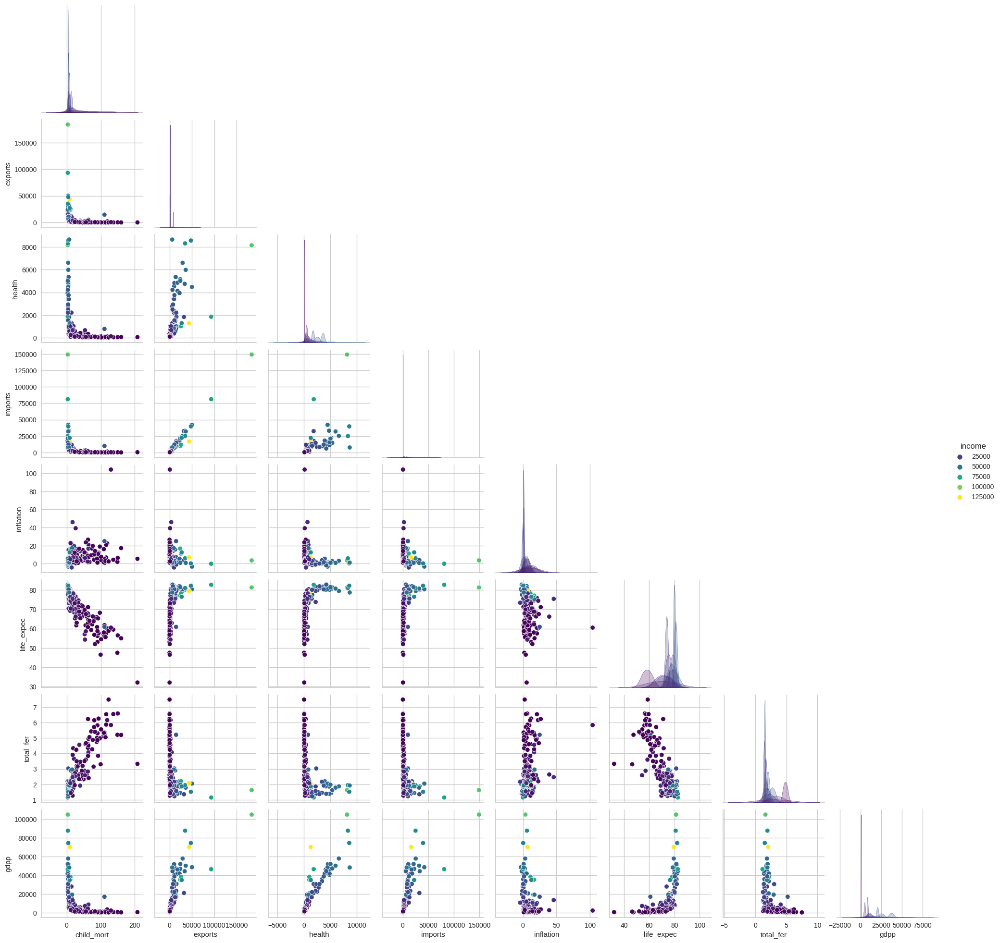

In [17]:
sns.pairplot(data=df1, diag_kind='kde',hue="income",palette='viridis',corner=True)
plt.show()

In [18]:
import kaleido
import plotly.express as px
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',projection='albers',
                         title=i+' Per Country',color=i,color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

In [19]:


for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',
                        color=i, title=i+' Per Country (Europe)',scope='europe',color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

In [20]:
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',
                        color=i, title=i+' Per Country (Asia)',scope='asia',color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

In [21]:
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',
                        color=i, title=i+' Per Country (Africa)',scope='africa',color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

In [22]:
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',
                        color=i, title=i+' Per Country (South America)',scope='south america',color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

In [23]:
for i in df.drop('country', axis=1).columns:
    fig = px.choropleth(df, locationmode='country names', locations='country',
                        color=i, title=i+' Per Country (North America)',scope='north america',color_continuous_scale="viridis")
    fig.update_geos(fitbounds="locations", visible=True)
    fig.show(engine='kaleido')

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- Several socio-economic indicators highlight disparities in development among countries.

Developed nations (e.g., Luxembourg, Japan, the U.S.) tend to have high exports, imports, income, life 

expectancy, and healthcare spending, while developing countries (e.g., Haiti, Niger, Congo) exhibit high 

child mortality, inflation, and fertility rates.

Based on these patterns, countries in the dataset can be broadly grouped into three clusters:

 1. Highly developed (mainly in Europe and North America)

 2. Moderately developed (primarily in Asia and the Pacific)
 
 3. Less developed (largely in Africa and South America)



 This suggests that African and South American countries may require greater financial aid and support.
 

In [24]:
dff = df.copy()

In [25]:
Continent = pd.read_html(
    "https://statisticstimes.com/geography/countries-by-continents.php",
    match="Continent",
)[0]
Continent = Continent[["Country or Area", "Continent"]]
dff = pd.merge(dff, Continent, left_on="country", right_on="Country or Area", how="left")
dff.loc[dff['Continent'].isna(), "country"]

19                            Bolivia
23                             Brunei
30                         Cape Verde
37                   Congo, Dem. Rep.
38                        Congo, Rep.
40                      Cote d'Ivoire
43                     Czech Republic
71                               Iran
83                    Kyrgyz Republic
84                                Lao
92                     Macedonia, FYR
101             Micronesia, Fed. Sts.
102                           Moldova
125                            Russia
134                   Slovak Republic
138                       South Korea
141    St. Vincent and the Grenadines
147                          Tanzania
158                    United Kingdom
159                     United States
163                         Venezuela
164                           Vietnam
Name: country, dtype: object

There is a list that could not be matched to the Continent table and has a NaN value for Continent.

In [26]:
contenint_fill = pd.DataFrame(
    {
        "Bolivia": "South America",
        "Brunei": "Asia",
        "Ivory Coast": "Africa",
        "Cape Verde": "Oceania",
        "Congo, Dem. Rep.": "Africa",
        "Congo, Rep.": "Africa",
        "Czech Republic": "Europe",
        "Kyrgyz Republic": "Asia",
        "Iran": "Asia",
        "Lao": "Asia",
        "Macedonia, FYR": "Europe",
        "Micronesia, Fed. Sts.": "Oceania",
        "Moldova": "Europe",
        "Russia": "Europe",
        "South Korea": "Asia",
        "St. Vincent and the Grenadines": "North America",
        "United Kingdom": "Europe",
        "United States": "North America",
        "Venezuela": "South America",
        "Vietnam": "Asia",
        "Cote d'Ivoire": "Africa",
        "Slovak Republic": "Europe",
        "Tanzania": "Africa"
    },
    index=["country"]
)
contenint_fill = contenint_fill.melt(var_name="country", value_name="Continent fill")
dff = pd.merge(dff, contenint_fill, on="country", how='left')
dff["Continent"] = dff["Continent"].fillna(dff["Continent fill"])
dff = dff.drop(columns=["Continent fill", "Country or Area"])
dff["Continent"].value_counts(dropna=False)

Continent
Africa           46
Asia             45
Europe           39
North America    15
South America    12
Oceania          10
Name: count, dtype: int64

In [27]:
import plotly.express as px
import plotly.io as pio
fig2 = px.scatter(df, x='gdpp', y='inflation', color='country', title='gdpp & inflation',template = 'plotly_white')
fig2.show()

In [28]:
plt = px.scatter(dff, x="child_mort", y="life_expec",size="income", color ="Continent",size_max=80,color_continuous_scale="Tealgrn",hover_data=df[['country']],template = 'plotly_white')
plt.show()

In [29]:
plt = px.scatter(dff, x="exports", y="imports",size="income", color ="Continent",size_max=80,color_continuous_scale="Tealgrn",hover_data=df[['country']],template = 'plotly_white')
plt.show()

In [30]:
plt = px.scatter(dff, x="inflation", y="gdpp",size="income", color ="Continent",size_max=80,color_continuous_scale="Tealgrn",hover_data=df[['country']],template = 'plotly_white')
plt.show()

In [31]:
plt = px.scatter(dff, x="health", y="total_fer",size="income", color ="Continent",size_max=80,color_continuous_scale="Tealgrn",hover_data=df[['country']],template = 'plotly_white')
plt.show()

In [32]:
plt = px.scatter(df, x="child_mort", y="health",size="income",color ="life_expec", log_x="True",size_max=150,
                 trendline="ols" ,trendline_options=dict(log_x=True),color_continuous_scale="viridis",trendline_color_override="#caf0f8",hover_data=df[['country']],template = 'plotly_white')

plt.show()

In [33]:
plt = px.scatter(df, x="imports", y="exports",size="income",color ="inflation", log_x="True",size_max=150,
                 trendline="ols" ,trendline_options=dict(log_x=True),color_continuous_scale="viridis",trendline_color_override="#caf0f8",hover_data=df[['country']],template = 'plotly_white')

plt.show()

In [34]:
plt = px.scatter(df, x="gdpp", y="total_fer",size="income",color ="inflation", log_x="True",size_max=150,
                 trendline="ols" ,trendline_options=dict(log_x=True),color_continuous_scale="viridis",trendline_color_override="#caf0f8",hover_data=df[['country']],template = 'plotly_white')

plt.show()

In [35]:
fig = px.scatter_3d(df, x='income', y='health', z='life_expec', color='country', opacity=0.7,template = 'plotly_white')
fig.update_traces(marker=dict(size=5))
fig.show()

In [36]:
fig = px.scatter_3d(dff, x='gdpp', y='inflation', z='income', color='Continent',template = 'plotly_white')
fig.update_traces(marker=dict(size=5))
fig.show()

In [37]:
corr_matrix = df1.corr()
fig = px.scatter(dff,x="income",y="gdpp",color="health",color_continuous_scale="plasma",width=1300,height=500,facet_col="Continent",hover_name="country",hover_data=["gdpp"],opacity=0.6,log_y=True,trendline="ols",trendline_color_override="gainsboro",trendline_options=dict(log_y=True),template = 'plotly_white')
fig.update_layout(title=f"gdpp vs income ({corr_matrix.loc['gdpp', 'income']} corr)",title_font={"size": 20},)
fig.update_traces(marker_size=5)
cols = ["country", "gdpp", "life_expec", "income"]
fig.show()
dff[cols].sort_values("income", ignore_index=True, ascending=False).head()
fig = px.scatter(dff,x="inflation",y="gdpp",color="total_fer",color_continuous_scale="teal",width=1300,height=500,facet_col="Continent",hover_name="country",hover_data=["gdpp"],log_y=True,opacity=0.6,trendline="ols",trendline_color_override="gainsboro",trendline_options=dict(log_y=True),template = 'plotly_white')
fig.update_traces(marker_size=5)
fig.show()
cols = ["country","gdpp","life_expec","total_fer","child_mort","inflation"]
print("Top countiries with agricultual land")
dff[cols].sort_values("inflation", ignore_index=True, ascending=False).head()
fig = px.scatter(dff,x="income",y="imports",color="inflation",color_continuous_scale="viridis",width=1300,height=500,facet_col="Continent",hover_name="country",opacity=1,trendline="ols",trendline_color_override="gainsboro",template = 'plotly_white')
fig.update_traces(marker_size=5)
fig.show()
fig = px.scatter(dff,x="inflation",y="gdpp",color="life_expec",color_continuous_scale="Tempo",width=1300,height=500,facet_col="Continent",hover_name="country",hover_data=["gdpp"],log_x=True,log_y=True,opacity=0.6,trendline="ols",trendline_color_override="gainsboro",trendline_options=dict(log_y=True),template = 'plotly_white')
fig.update_traces(marker_size=5)
fig.show()

Top countiries with agricultual land


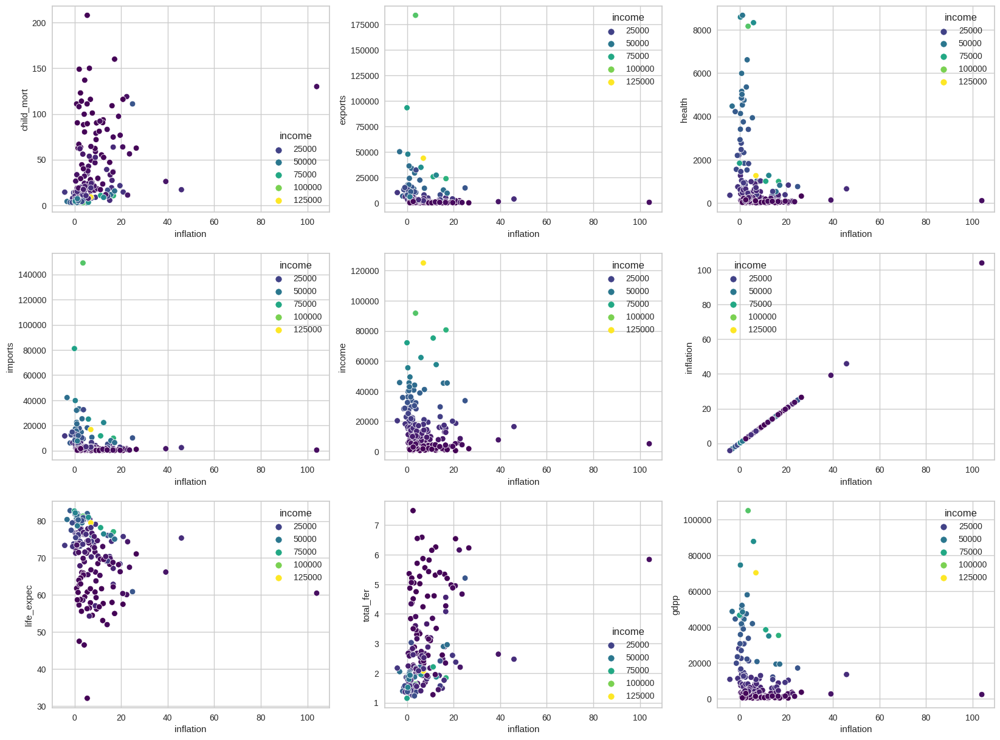

In [38]:
import matplotlib.pyplot as plt
ff = ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']
fig=plt.figure(figsize=(20,15))
for i,col in enumerate(ff):
    ax=fig.add_subplot(3,3,i+1)
    sns.scatterplot(x='inflation',y=col,hue='income',data=df,palette="viridis")

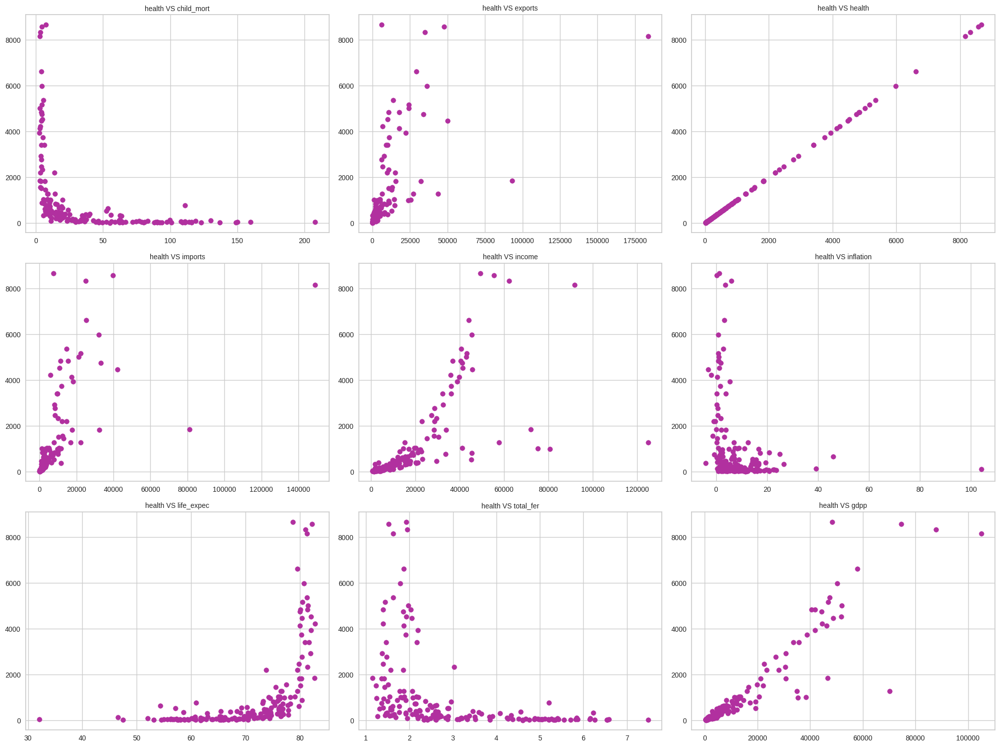

In [39]:
plt.figure(1 , figsize = (20 , 15))
n = 0 
for x in ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']:
    n += 1
    plt.subplot(3 , 3 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    plt.scatter(df[x], df['health'], color = "#b1309f")
    plt.title('health VS {}'.format(x), fontsize = 10)
plt.tight_layout()
plt.show()

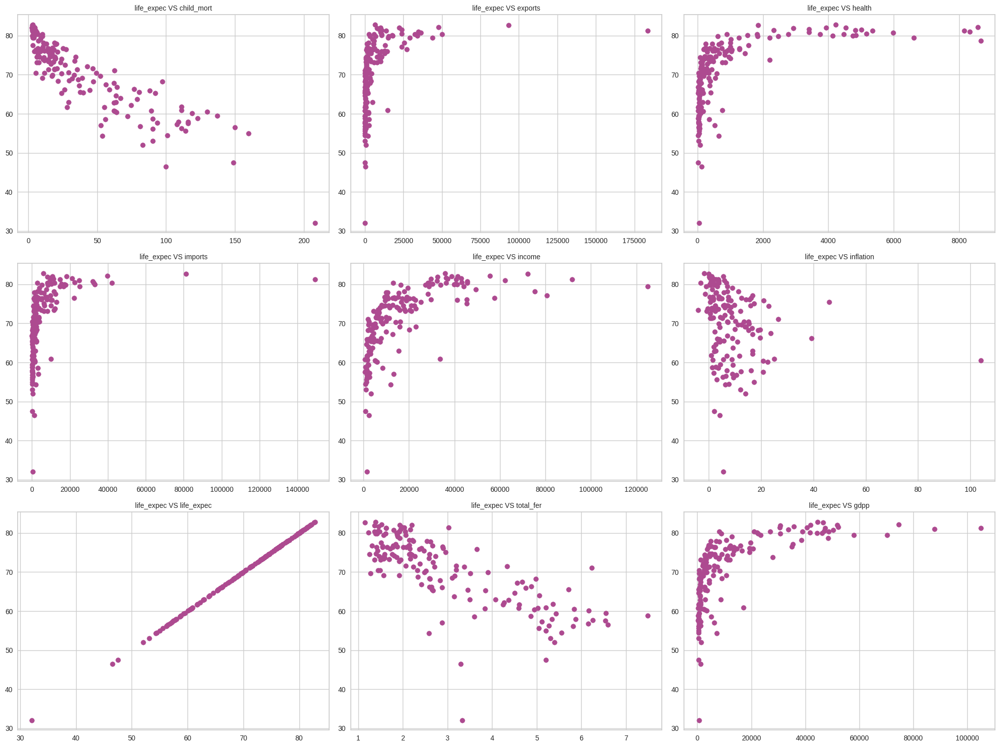

In [40]:
plt.figure(1 , figsize = (20 , 15))
n = 0 
for x in ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']:
    n += 1
    plt.subplot(3 , 3 , n)
    plt.subplots_adjust(hspace =0.5 , wspace = 0.5)
    plt.scatter(df[x], df['life_expec'], color = "#ad4a90")
    plt.title('life_expec VS {}'.format(x), fontsize = 10)
plt.tight_layout()
plt.show()

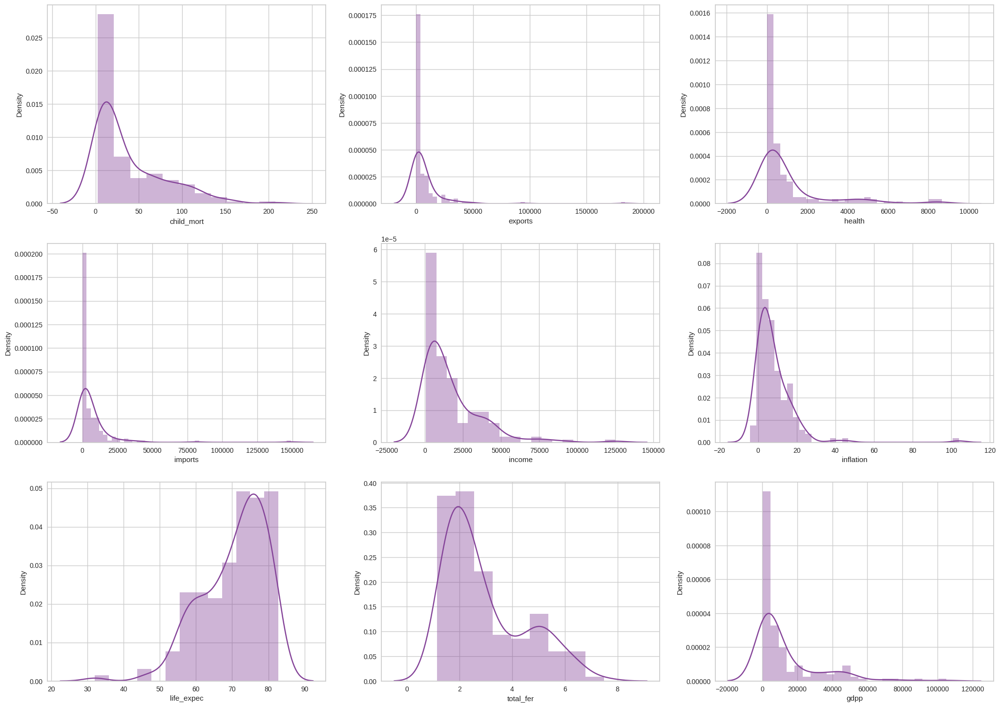

In [41]:
df_columns = ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']
fig=plt.figure(figsize=(25,18))
for i,col in enumerate(df_columns):
    ax=fig.add_subplot(3,3,i+1)
    ax1=sns.distplot(df1[df1.columns[i]] ,kde=True,color="#854499")

In [42]:
# measure of skewness
df1.skew(axis = 0, skipna = True) 

child_mort    1.450774
exports       6.720171
health        2.526029
imports       6.618500
income        2.231480
inflation     5.154049
life_expec   -0.970996
total_fer     0.967092
gdpp          2.218051
dtype: float64

Most numerical variables do not have a normal distribution.


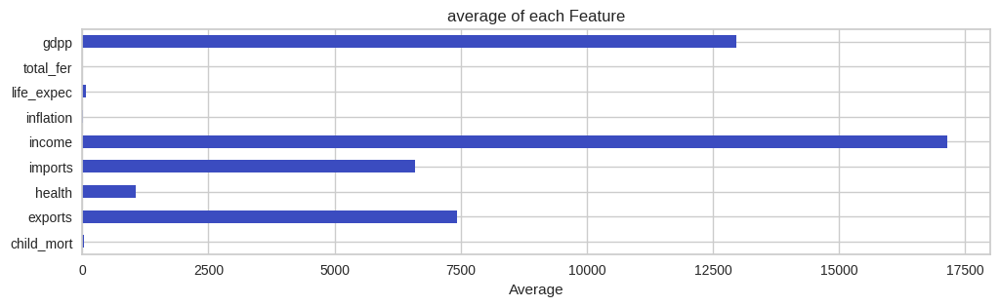

In [43]:
columns1 = ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']
df_mean = df1[columns1].mean()
df_mean.plot(kind='barh', stacked=True, figsize=(12, 3), cmap="coolwarm")
plt.xlabel('Average')
plt.title('average of each Feature')
plt.show()

<Axes: >

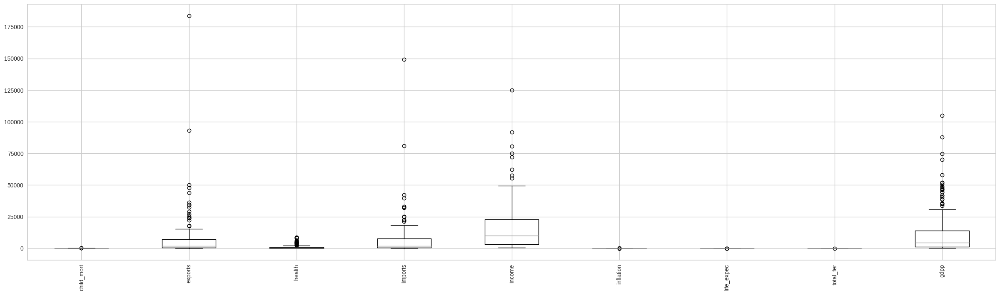

In [44]:
df1.boxplot(rot=90 , figsize=(30,8))

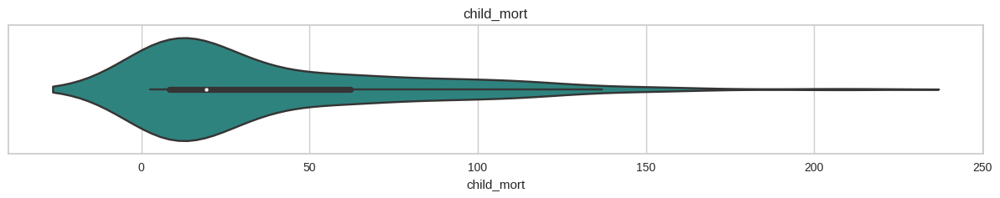

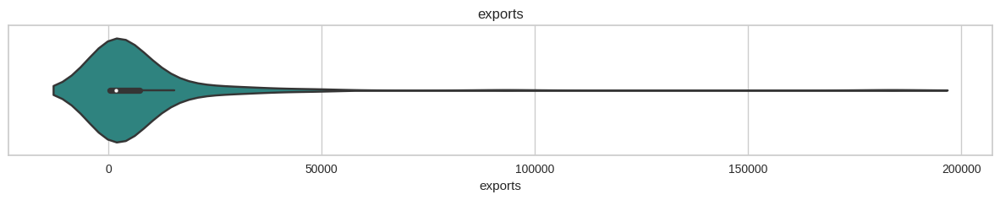

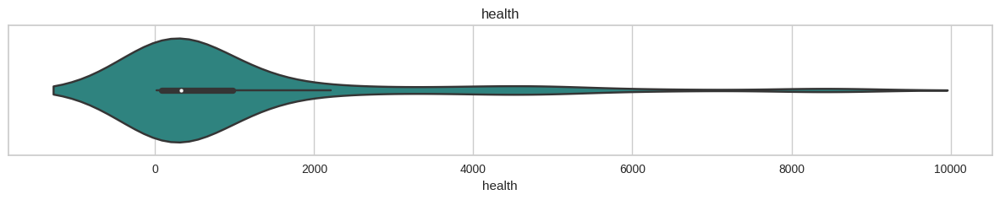

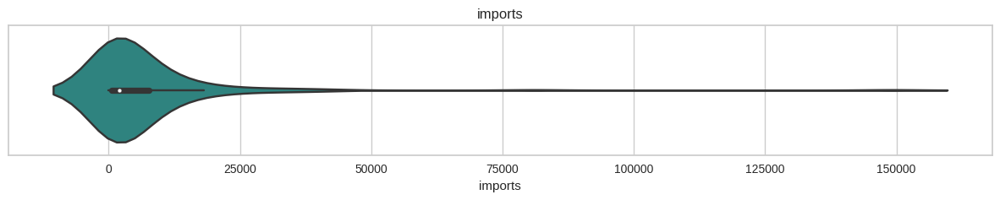

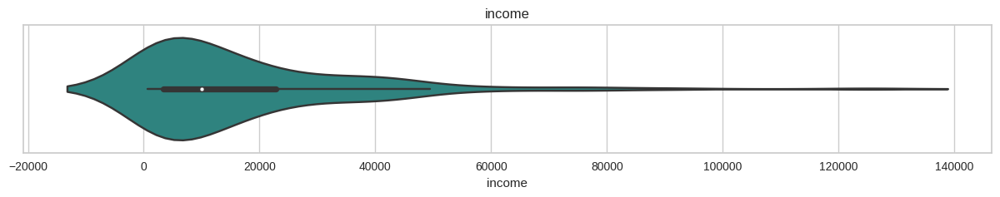

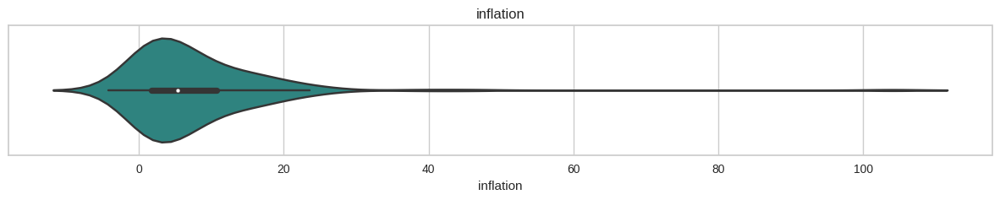

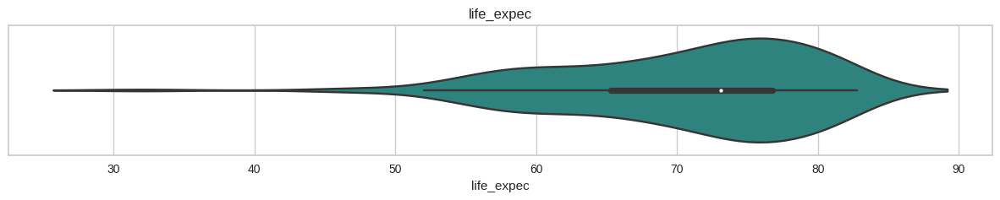

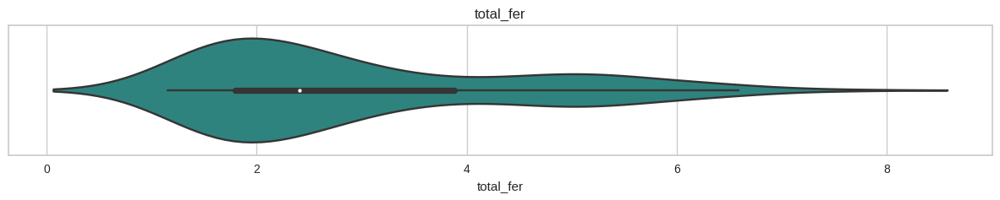

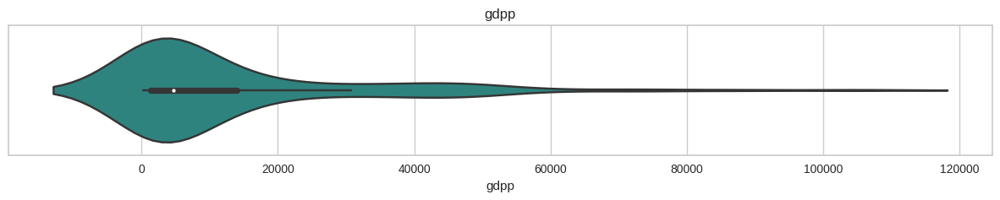

In [45]:
palette ="viridis"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.violinplot(x=df1[column], palette=palette)
    plt.title(column)
    plt.show()


child_mort Statistics:
count: 167.00, mean: 38.27, std: 40.33, min: 2.60, 25%: 8.25, 50%: 19.30, 75%: 62.10, max: 208.00


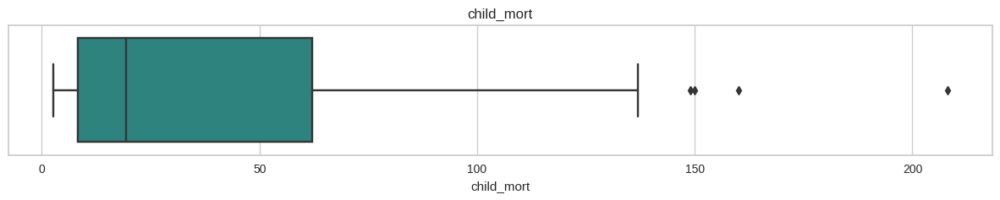


exports Statistics:
count: 167.00, mean: 7420.62, std: 17973.89, min: 1.08, 25%: 447.14, 50%: 1777.44, 75%: 7278.00, max: 183750.00


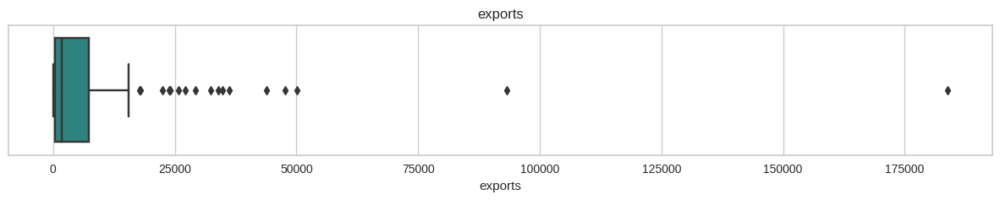


health Statistics:
count: 167.00, mean: 1056.73, std: 1801.41, min: 12.82, 25%: 78.54, 50%: 321.89, 75%: 976.94, max: 8663.60


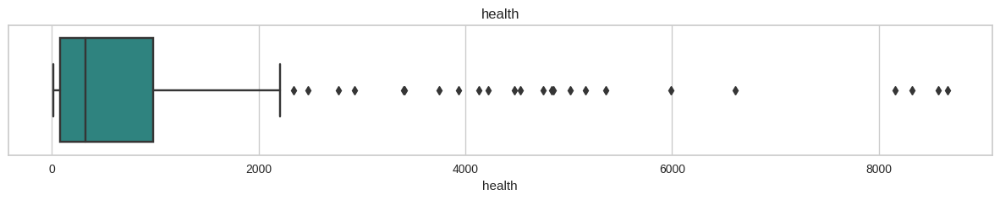


imports Statistics:
count: 167.00, mean: 6588.35, std: 14710.81, min: 0.65, 25%: 640.21, 50%: 2045.58, 75%: 7719.60, max: 149100.00


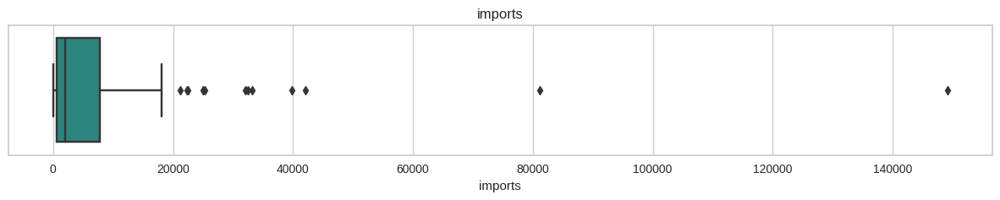


income Statistics:
count: 167.00, mean: 17144.69, std: 19278.07, min: 609.00, 25%: 3355.00, 50%: 9960.00, 75%: 22800.00, max: 125000.00


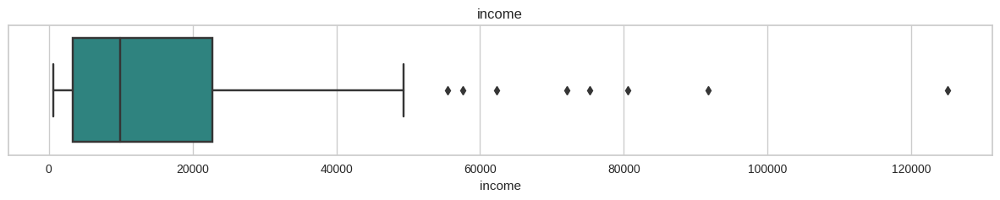


inflation Statistics:
count: 167.00, mean: 7.78, std: 10.57, min: -4.21, 25%: 1.81, 50%: 5.39, 75%: 10.75, max: 104.00


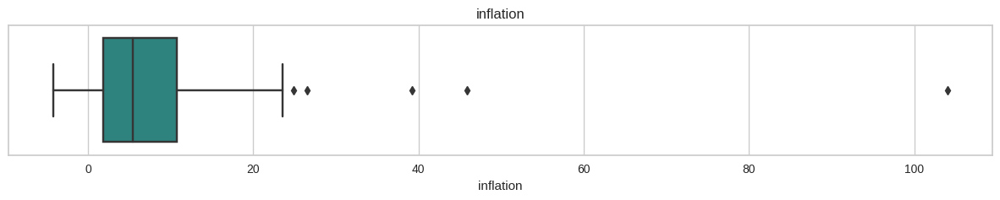


life_expec Statistics:
count: 167.00, mean: 70.56, std: 8.89, min: 32.10, 25%: 65.30, 50%: 73.10, 75%: 76.80, max: 82.80


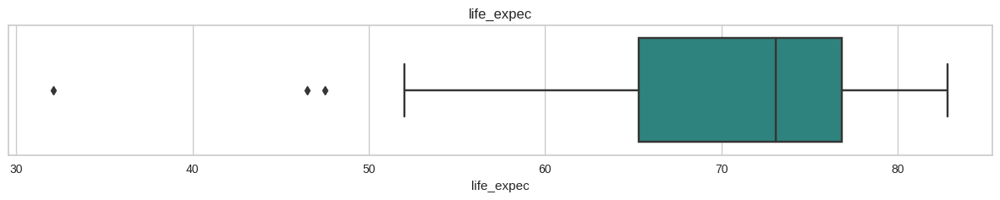


total_fer Statistics:
count: 167.00, mean: 2.95, std: 1.51, min: 1.15, 25%: 1.79, 50%: 2.41, 75%: 3.88, max: 7.49


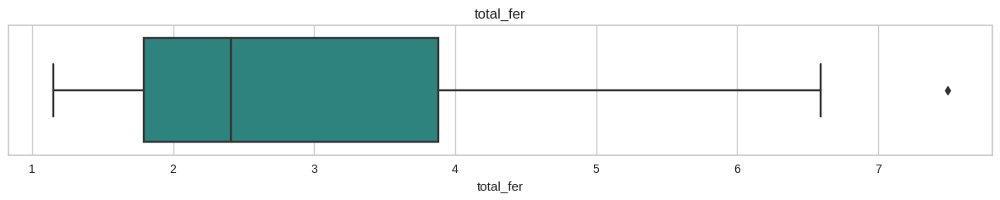


gdpp Statistics:
count: 167.00, mean: 12964.16, std: 18328.70, min: 231.00, 25%: 1330.00, 50%: 4660.00, 75%: 14050.00, max: 105000.00


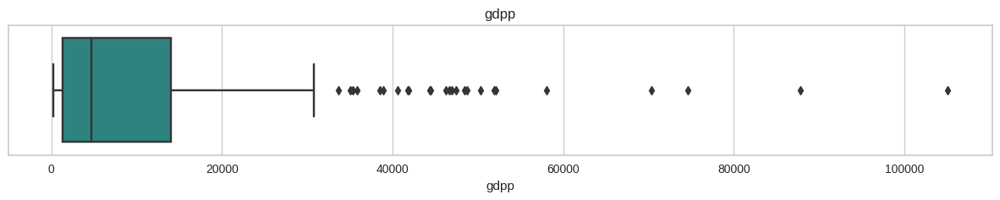

In [46]:
palette ="viridis"
for column in columns1:
    plt.figure(figsize=(15,2))
    sns.boxplot(x=df1[column], palette=palette)
    plt.title(column)
    stats = df1[column].describe()
    stats_text = ", ".join([f"{key}: {value:.2f}" for key, value in stats.items()])
    print(f"\n{column} Statistics:\n{stats_text}")
    plt.show()

In [47]:
feature_list = ['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']
def StDev_method (df,n,features):
    outliers = []
    
    for column in features:
        data_mean = df[column].mean()
        data_std = df[column].std()
        cut_off = data_std * 3     
        outlier_list_column = df[(df[column] < data_mean - cut_off) | (df[column] > data_mean + cut_off)].index
        outliers.extend(outlier_list_column)
    outliers = Counter(outliers)        
    OUT= list( k for k, v in outliers.items() if v > n )
    df1 = df[df[column] > data_mean + cut_off]
    df2 = df[df[column] < data_mean - cut_off]
    print('Total number of outliers is:', df1.shape[0]+ df2.shape[0])
    
    return OUT  
Outliers_StDev = StDev_method(df,1,feature_list)
df_out2 = df.drop(Outliers_StDev, axis = 0).reset_index(drop=True)

Total number of outliers is: 4


In [48]:
fig = px.pie(df, values='income', names='country',
             title='income',
             hover_data=['life_expec'], labels={'life_expec':'life_expec'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(width=1000, height=800)
fig.show()

In [49]:
new=df.nlargest(40, 'life_expec')
fig = px.sunburst(new,path=["country"],values="life_expec",color="gdpp",color_continuous_scale="viridis")
fig.update_layout(
    title="Top 40 Countries with the highest life_expec",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0),
)
fig.update_layout(width=1000, height=800)
fig.show()

In [50]:
new=df.nlargest(40, 'income')
fig = px.sunburst(new,path=["country"],values="income",color="gdpp",color_continuous_scale="viridis")
fig.update_layout(
    title="Top 40 Countries with the highest income",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0),
)
fig.update_layout(width=1000, height=800)
fig.show()

In [51]:
new=df.nlargest(40, 'inflation')
fig = px.sunburst(new,path=["country"],values="inflation",color="health",color_continuous_scale="viridis")
fig.update_layout(
    title="Top 40 Countries with the highest inflation",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0),
)
fig.update_layout(width=1000, height=800)
fig.show()

In [52]:
fig = px.sunburst(
    dff,
    path=["Continent", "country"],
    values="income",
    color="inflation",
    # hover_data=["iso_alpha"],
    color_continuous_scale="viridis",
    color_continuous_midpoint=2.1,
    width=1000,
    height=700
)
fig.update_layout(
    title="income of each country",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0),
)
fig.show()

In [53]:
fig = px.sunburst(
    dff,
    path=["Continent", "country"],
    values="life_expec",
    color="inflation",
    # hover_data=["iso_alpha"],
    color_continuous_scale="viridis",
    color_continuous_midpoint=2.1,
    width=1000,
    height=700
)
fig.update_layout(
    title="life_expec of each country",
    title_font={"size": 20},
    margin=dict(t=50, b=50, l=0, r=0),
)
fig.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- A pie chart is a circular statistical graphic used to illustrate numerical proportions.

Each slice of the pie shows how much a category contributes to the whole, making it easy to compare parts

 within a dataset. The larger the slice, the greater the value it represents.

In [54]:
import plotly.graph_objects as go
import pandas as pd

# Bar Chart – Top 10 inflation
data = df[['country', 'inflation']].sort_values('inflation', ascending=False)[:10]
colors = ["#489cad", '#ade8f4', "#1e91a5", '#48cae4', '#00b4d8', '#0096c7', '#0077b6', '#023e8a', '#03045e', '#001d3d']

fig = go.Figure(go.Bar(
    x=data['inflation'][::-1],
    y=data['country'][::-1],
    marker=dict(color=colors),
    text=data['inflation'].apply(lambda x: str(int(x)))[::-1],
    textposition='outside',
    textfont=dict(color='black', size=14),
    orientation='h'
))

fig.update_layout(
    title='Top 10 Countries With the Highest Inflation',
    title_font=dict(size=20),
    xaxis_title="Inflation Rate",
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white'
)

fig.show()

# Pie Chart – Top 2 countries vs others
df_sorted = df.sort_values('inflation', ascending=False)
top_n = 2
top_countries = df_sorted.head(top_n)
other_inflation = df_sorted.iloc[top_n:]['inflation'].sum()

new_df = pd.concat([
    top_countries,
    pd.DataFrame({'country': ['Others'], 'inflation': [other_inflation]})
])

colors = ["#6997a7", '#89c2d9', '#d0efff']

fig = go.Figure(data=[go.Pie(
    labels=new_df['country'],
    values=new_df['inflation'],
    textinfo="label+percent",
    textfont=dict(color='black', size=14),
    pull=[0, 0, 0],
    showlegend=True,
    marker_colors=colors
)])

fig.update_traces(hole=0.6)

fig.update_layout(
    title='Inflation Distribution of Countries',
    title_font=dict(size=20),
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white',
    annotations=[
        dict(
            text="11.53% of the world's<br>inflation belongs to<br><b>Nigeria & Venezuela</b> alone!",
            x=0.5, y=0.5,
            font=dict(size=14, color='black'),
            showarrow=False
        )
    ]
)

fig.show()

In [55]:
import plotly.graph_objects as go
import pandas as pd

# ----- Bar Chart: Top 10 Countries by Health Spending -----
data = df[['country', 'health']].sort_values('health', ascending=False)[:10]

colors = ['#ade8f4', '#90e0ef', '#48cae4', '#00b4d8', '#0096c7', 
          '#0077b6', '#023e8a', '#03045e', '#001d3d', '#000814']

fig = go.Figure(go.Bar(
    x=data['health'][::-1],
    y=data['country'][::-1],
    marker=dict(color=colors),
    text=data['health'].apply(lambda x: str(round(x, 2)))[::-1],
    textposition='outside',
    textfont=dict(color='black', size=13),
    orientation='h'
))

fig.update_layout(
    title='Top 10 Countries With the Highest Health Spending',
    title_font=dict(size=20),
    xaxis_title="Health Spending (per capita)",
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white'
)

fig.show()

# ----- Pie Chart: Top 2 Countries vs Others in Health Spending -----
df_sorted = df.sort_values('health', ascending=False)
top_n = 2
top_countries = df_sorted.head(top_n)
other_health = df_sorted.iloc[top_n:]['health'].sum()

new_df = pd.concat([
    top_countries,
    pd.DataFrame({'country': ['Others'], 'health': [other_health]})
])

colors = ['#48cae4', '#0077b6', '#adb5bd']

fig = go.Figure(data=[go.Pie(
    labels=new_df['country'],
    values=new_df['health'],
    textinfo="label+percent",
    textfont=dict(color='black', size=14),
    pull=[0.1, 0.05, 0],
    showlegend=True,
    marker_colors=colors
)])

fig.update_traces(hole=0.6)

fig.update_layout(
    title='Health Spending Distribution Among Countries',
    title_font=dict(size=20),
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white',
    annotations=[
        dict(
            text="🇺🇸 US and 🇨🇭 Switzerland<br>spend the most per person on health.",
            x=0.5, y=0.5,
            font=dict(size=13, color='black'),
            showarrow=False
        )
    ]
)

fig.show()

In [56]:
import plotly.graph_objects as go
import pandas as pd

# Top 10 countries with highest exports
data = df[['country', 'exports']].sort_values('exports', ascending=False)[:10]


colors = ['#f94144', '#f3722c', '#f8961e', '#f9844a', '#f9c74f',
          '#90be6d', '#43aa8b', '#577590', '#277da1', '#4d908e']

fig = go.Figure(go.Bar(
    x=data['exports'][::-1],
    y=data['country'][::-1],
    marker=dict(color=colors),
    orientation='h',
    text=data['exports'].apply(lambda x: str(round(x)))[::-1],
    textposition='outside',
    textfont=dict(color='black', size=13)
))

fig.update_layout(
    title='Top 10 Countries with the Highest Exports',
    title_font=dict(size=20),
    xaxis_title="Exports (% of GDP)",
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white',
    height=600
)

fig.show()

In [57]:
import plotly.graph_objects as go

data = df[['country', 'imports']].sort_values('imports', ascending=False)[:10]

colors = ['#f94144', '#f3722c', '#f8961e', '#f9844a', '#f9c74f',
          '#90be6d', '#43aa8b', '#4d908e', '#577590', '#277da1']


fig = go.Figure(go.Bar(
    x=data['imports'][::-1],                      
    y=data['country'][::-1],
    marker=dict(color=colors),
    orientation='h',
    text=data['imports'].apply(lambda x: str(round(x)))[::-1], 
    textposition='outside',
    textfont=dict(color='black', size=13)
))


fig.update_layout(
    title='Top 10 Countries with the Highest Imports',
    title_font=dict(size=20),
    xaxis_title="Imports (% of GDP)",
    template='plotly_white',                     
    plot_bgcolor='white',
    paper_bgcolor='white',
    height=600
)


fig.show()

In [58]:
import plotly.graph_objects as go


data = df[['country', 'total_fer']].sort_values('total_fer', ascending=False)[:10]


colors = ['#f9c74f', '#f9844a', '#f8961e', '#f3722c', '#f94144',
          '#d00000', '#9d0208', '#6a040f', '#370617', '#240046']

fig = go.Figure(go.Bar(
    x=data['total_fer'][::-1],                    
    y=data['country'][::-1],
    marker=dict(color=colors),
    orientation='h',
    text=data['total_fer'].apply(lambda x: str(round(x, 2)))[::-1],  
    textposition='outside',
    textfont=dict(color='black', size=13)
))


fig.update_layout(
    title='Top 10 Countries with the Highest Fertility Rate',
    title_font=dict(size=20),
    xaxis_title="Total Fertility Rate (Children per Woman)",
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white',
    height=600
)

fig.show()

In [59]:
import plotly.graph_objects as go

data = df[['country', 'life_expec']].sort_values('life_expec', ascending=False)[:10]


colors = ['#b5ead7', '#c7f9cc', '#d8f3dc', '#a9def9', '#a0c4ff',
          '#9bf6ff', '#bdb2ff', '#ffc6ff', '#ffd6a5', '#fdffb6']


fig = go.Figure(go.Bar(
    x=data['life_expec'][::-1],
    y=data['country'][::-1],
    marker=dict(color=colors),
    orientation='h',
    text=data['life_expec'].apply(lambda x: str(round(x, 1)))[::-1],
    textposition='outside',
    textfont=dict(color='black', size=13)
))


fig.update_layout(
    title='Top 10 Countries with the Highest Life Expectancy',
    title_font=dict(size=20),
    xaxis_title="Life Expectancy (Years)",
    template='plotly_white',
    plot_bgcolor='white',
    paper_bgcolor='white',
    height=600
)

fig.show()

In [60]:
fig1 = px.bar(df, x='income', y='country', color='inflation',color_continuous_scale="ice",template='plotly_white')
fig1.update_layout(autosize=False, width=1200, height=800)
fig1.show()

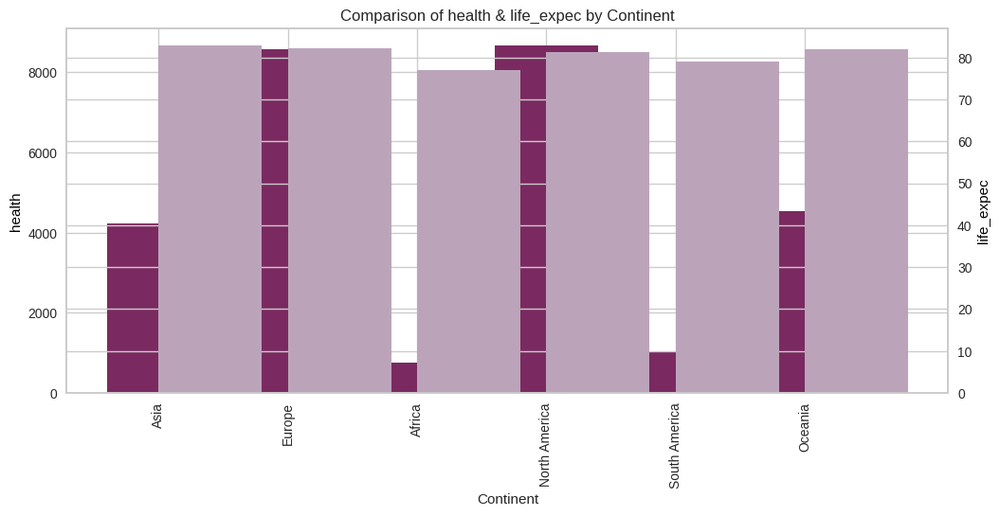

In [61]:
fig, ax1 = plt.subplots(figsize=(12,5))
ax1.bar(dff['Continent'], dff['health'], color="#7a2a60", align='center')
ax1.set_ylabel('health', color='#000000')
plt.xticks(rotation=90)
plt.xlabel('Continent')
ax2 = ax1.twinx()
ax2.bar(dff['Continent'], dff['life_expec'], color="#bba4ba", align='edge')
ax2.set_ylabel('life_expec', color='#000000')
plt.title('Comparison of health & life_expec by Continent')
plt.show()

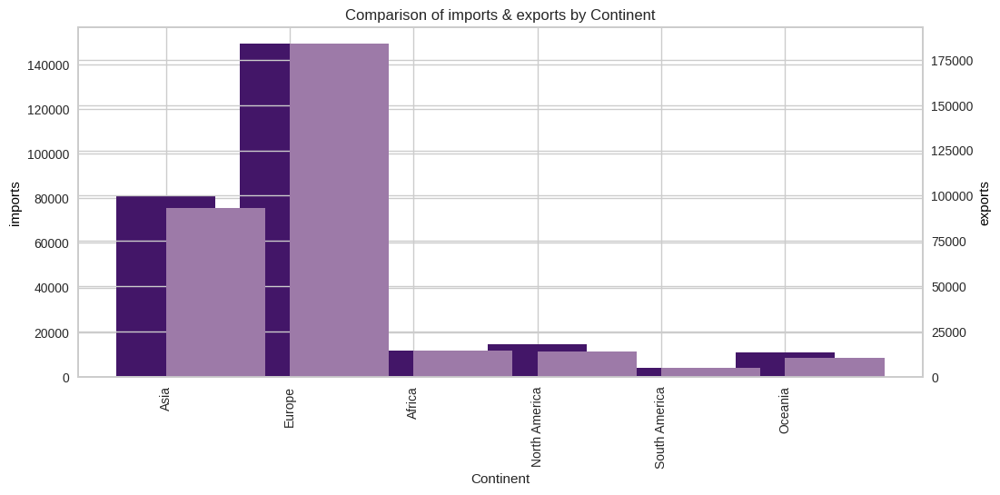

In [62]:
fig, ax1 = plt.subplots(figsize=(12,5))
ax1.bar(dff['Continent'], dff['imports'], color="#431668", align='center')
ax1.set_ylabel('imports', color='#000000')
plt.xticks(rotation=90)
plt.xlabel('Continent')
ax2 = ax1.twinx()
ax2.bar(dff['Continent'], dff['exports'], color="#9d7aa8", align='edge')
ax2.set_ylabel('exports', color='#000000')
plt.title('Comparison of imports & exports by Continent')
plt.show()

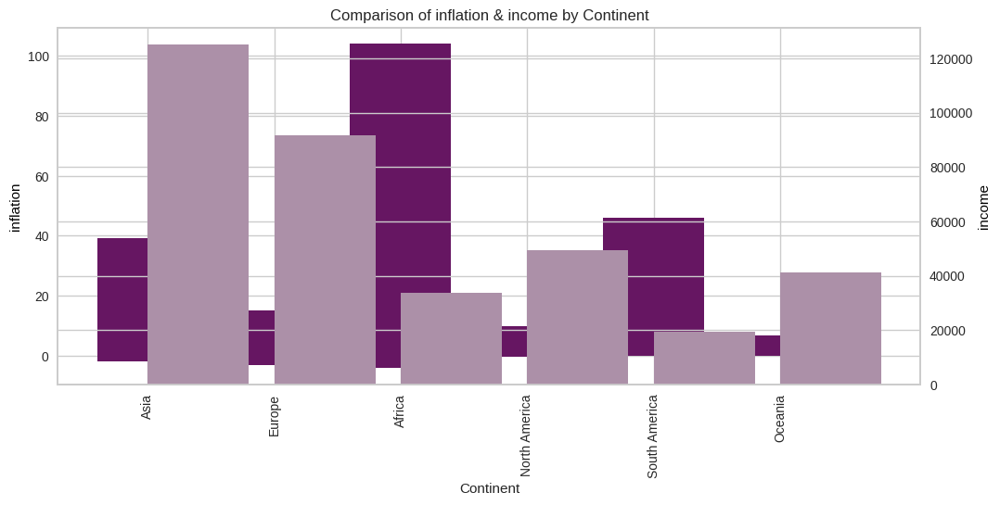

In [63]:
fig, ax1 = plt.subplots(figsize=(12,5))
ax1.bar(dff['Continent'], dff['inflation'], color="#661662", align='center')
ax1.set_ylabel('inflation', color='#000000')
plt.xticks(rotation=90)
plt.xlabel('Continent')
ax2 = ax1.twinx()
ax2.bar(dff['Continent'], dff['income'], color="#ac90a8", align='edge')
ax2.set_ylabel('income', color='#000000')
plt.title('Comparison of inflation & income by Continent')
plt.show()

In [64]:
top_40_laan = dff.nlargest(40, 'life_expec')
fig = px.bar(top_40_laan, y='life_expec', x='country',text_auto='.3s',color ="Continent",
            title="life_expec by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [65]:
top_40_laan = dff.nlargest(40, 'child_mort')
fig = px.bar(top_40_laan, y='child_mort', x='country',text_auto='.3s',color ="Continent",
            title="child_mort by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [66]:
top_40_laan = dff.nlargest(40, 'exports')
fig = px.bar(top_40_laan, y='exports', x='country',text_auto='.3s',color ="Continent",
            title="exports by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [67]:
top_40_laan = dff.nlargest(40, 'health')
fig = px.bar(top_40_laan, y='health', x='country',text_auto='.3s',color ="Continent",
            title="health by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [68]:
top_40_laan = dff.nlargest(40, 'imports')
fig = px.bar(top_40_laan, y='imports', x='country',text_auto='.3s',color ="Continent",
            title="imports by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [69]:
top_40_laan = dff.nlargest(40, 'income')
fig = px.bar(top_40_laan, y='income', x='country',text_auto='.3s',color ="Continent",
            title="income by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [70]:
top_40_laan = dff.nlargest(40, 'gdpp')
fig = px.bar(top_40_laan, y='gdpp', x='country',text_auto='.3s',color ="Continent",
            title="gdpp by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [71]:
top_40_laan = dff.nlargest(40, 'total_fer')
fig = px.bar(top_40_laan, y='total_fer', x='country',text_auto='.3s',color ="Continent",
            title="total_fer by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

In [72]:
top_40_laan = dff.nlargest(40, 'inflation')
fig = px.bar(top_40_laan, y='inflation', x='country',text_auto='.3s',color ="Continent",
            title="inflation by country & continent",color_continuous_scale="blues",template='plotly_white')

fig.show()

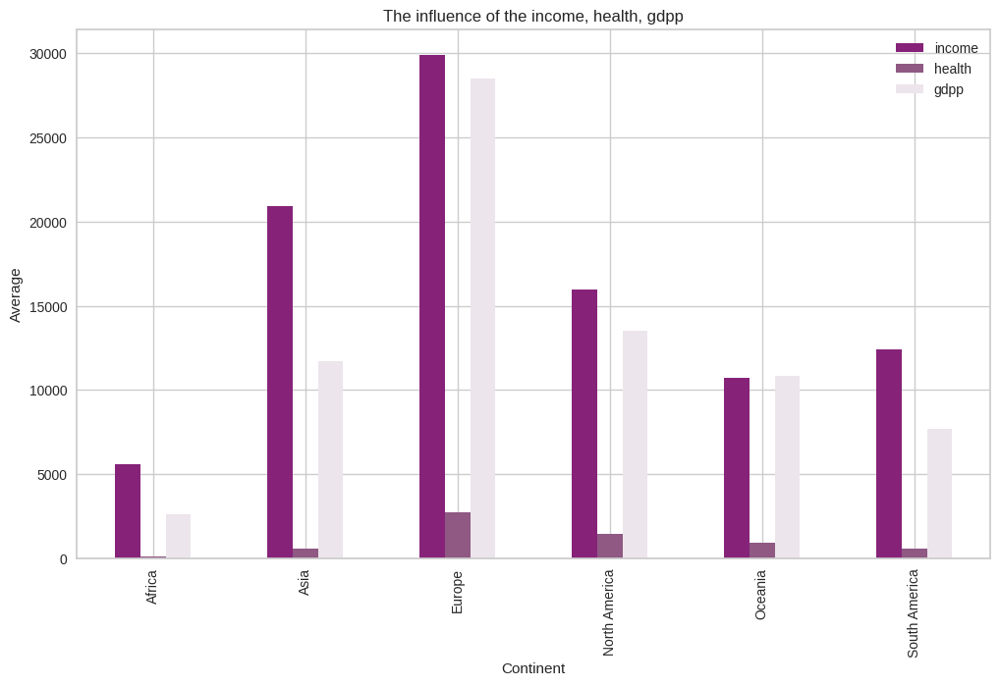

In [73]:
Country_Means = dff.groupby('Continent')[['income', 'health', 'gdpp']].mean()
colors = ["#862379", "#8f5983", "#ece5eb"] 

Country_Means.plot(kind='bar', figsize=(12, 7), color=colors)
plt.title("The influence of the income, health, gdpp")
plt.xlabel('Continent')
plt.ylabel('Average')
plt.show()

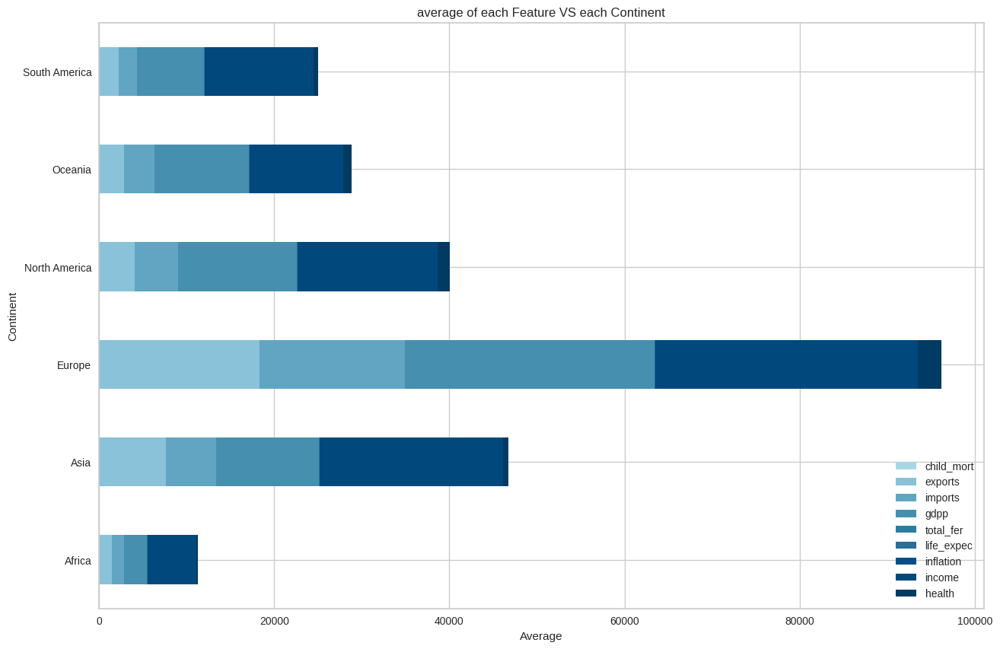

In [74]:
columns1 = ['child_mort', 'exports', 'imports','gdpp','total_fer','life_expec','inflation','income','health']
df_mean = dff.groupby('Continent')[columns1].mean()
colors = ['#a9d6e5', '#89c2d9', '#61a5c2', '#468faf', '#2c7da0', '#2a6f97', '#014f86', '#01497c', '#013a63']
df_mean.plot(kind='barh', stacked=True, figsize=(15, 10), color=colors)
plt.xlabel('Average')
plt.title('average of each Feature VS each Continent')
plt.legend(loc='lower right')
plt.show()

In [75]:
fig = px.treemap(
    dff,
    path=["Continent", "country"],
    values="income",
    color="inflation",
    color_continuous_scale="viridis",
    hover_name="country",
    width=1700,
    height=600,
    branchvalues="total",
)
fig.update_layout(
    title="income",
    title_font={"size": 20},
    margin=dict(t=50, b=0, l=0, r=0),
)
fig.show()

In [76]:
fig = px.treemap(
    dff,
    path=["Continent", "country"],
    values="health",
    color="income",
    color_continuous_scale="plasma",
    hover_name="country",
    width=1700,
    height=600,
    branchvalues="total",
)
fig.update_layout(
    title="health",
    title_font={"size": 20},
    margin=dict(t=50, b=0, l=0, r=0),
)
fig.show()

In [77]:
fig = px.box(dff, x='Continent', y='income', 
             title='Distribution of income by Continent',
             labels={'Continent': 'Continent', 'income': 'income'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='income')
fig.show()

In [78]:
fig = px.box(dff, x='Continent', y='total_fer', 
             title='Distribution of total_fer by Continent',
             labels={'Continent': 'Continent', 'total_fer': 'total_fer'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='total_fer')
fig.show()

In [79]:
fig = px.box(dff, x='Continent', y='inflation', 
             title='Distribution of inflation by Continent',
             labels={'Continent': 'Continent', 'inflation': 'inflation'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='inflation')
fig.show()

In [80]:
fig = px.box(dff, x='Continent', y='life_expec', 
             title='Distribution of life_expec by Continent',
             labels={'Continent': 'Continent', 'life_expec': 'life_expec'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='life_expec')
fig.show()

In [81]:
fig = px.box(dff, x='Continent', y='child_mort', 
             title='Distribution of child_mort by Continent',
             labels={'Continent': 'Continent', 'child_mort': 'child_mort'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='child_mort')
fig.show()

In [82]:
fig = px.box(dff, x='Continent', y='health', 
             title='Distribution of health by Continent',
             labels={'Continent': 'Continent', 'health': 'health'},
             color='Continent',points="all", 
             height=400,template='plotly_white')
fig.update_layout(xaxis_title='Continent', yaxis_title='health')
fig.show()

In [83]:
fig = px.violin(dff, x='Continent', y='health', color='income', title='Birth Rate Distribution by Continent',
               box=True, points="all",template='plotly_white')
fig.update_traces(meanline_visible=True, orientation='v', spanmode='hard')
fig.show()
fig = px.violin(dff, x='Continent', y='child_mort', color='income', title='Birth Rate Distribution by Continent',
               box=True, points="all",template='plotly_white')
fig.update_traces(meanline_visible=True, orientation='v', spanmode='hard')
fig.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- The graphs above clearly illustrate the distribution, frequency, and presence of outliers in numerical 

data, categorized by each continent. 📌

    child_mort   exports    imports   gdpp  total_fer  life_expec  inflation  \
0         90.2     55.30    248.297    553       5.82        56.2      9.440   
1         16.6   1145.20   1987.740   4090       1.65        76.3      4.490   
2         27.3   1712.64   1400.440   4460       2.89        76.5     16.100   
3        119.0   2199.19   1514.370   3530       6.16        60.1     22.400   
4         10.3   5551.00   7185.800  12200       2.13        76.8      1.440   
5         14.5   1946.70   1648.000  10300       2.37        75.8     20.900   
6         18.1    669.76   1458.660   3220       1.69        73.3      7.770   
7          4.8  10276.20  10847.100  51900       1.93        82.0      1.160   
8          4.3  24059.70  22418.200  46900       1.44        80.5      0.873   
9         39.2   3171.12   1208.880   5840       1.92        69.1     13.800   
10        13.8   9800.00  12236.000  28000       1.86        73.8     -0.393   
11         8.6  14386.50  10536.300  207

<function matplotlib.pyplot.show(close=None, block=None)>

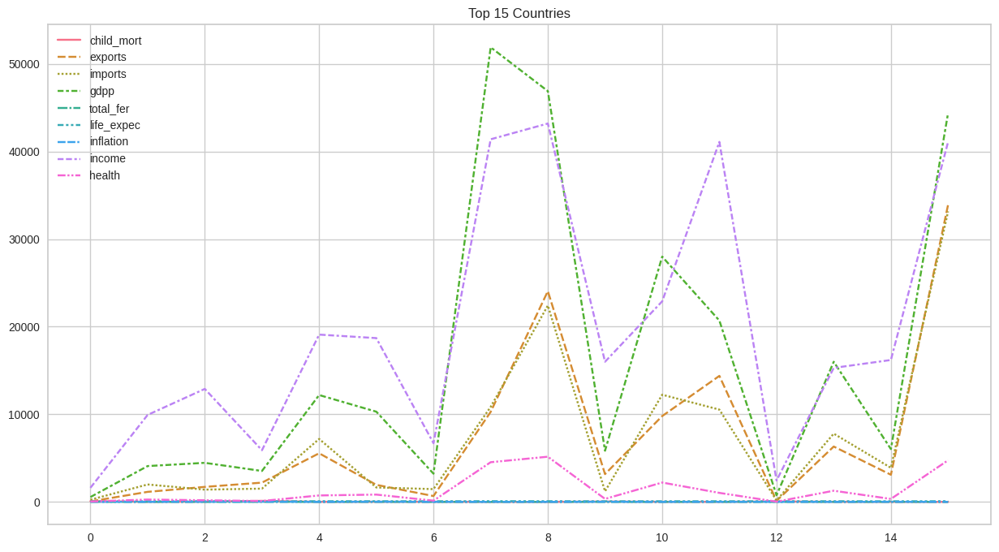

In [84]:
top10=df.iloc[:16 , :]
top10u= top10.loc[:,['child_mort', 'exports', 'imports','gdpp','total_fer','life_expec','inflation','income','health']]
print(top10u)
plt.figure(figsize=(15,8))
sns.lineplot(data=top10u)
plt.title('Top 15 Countries')
plt.show

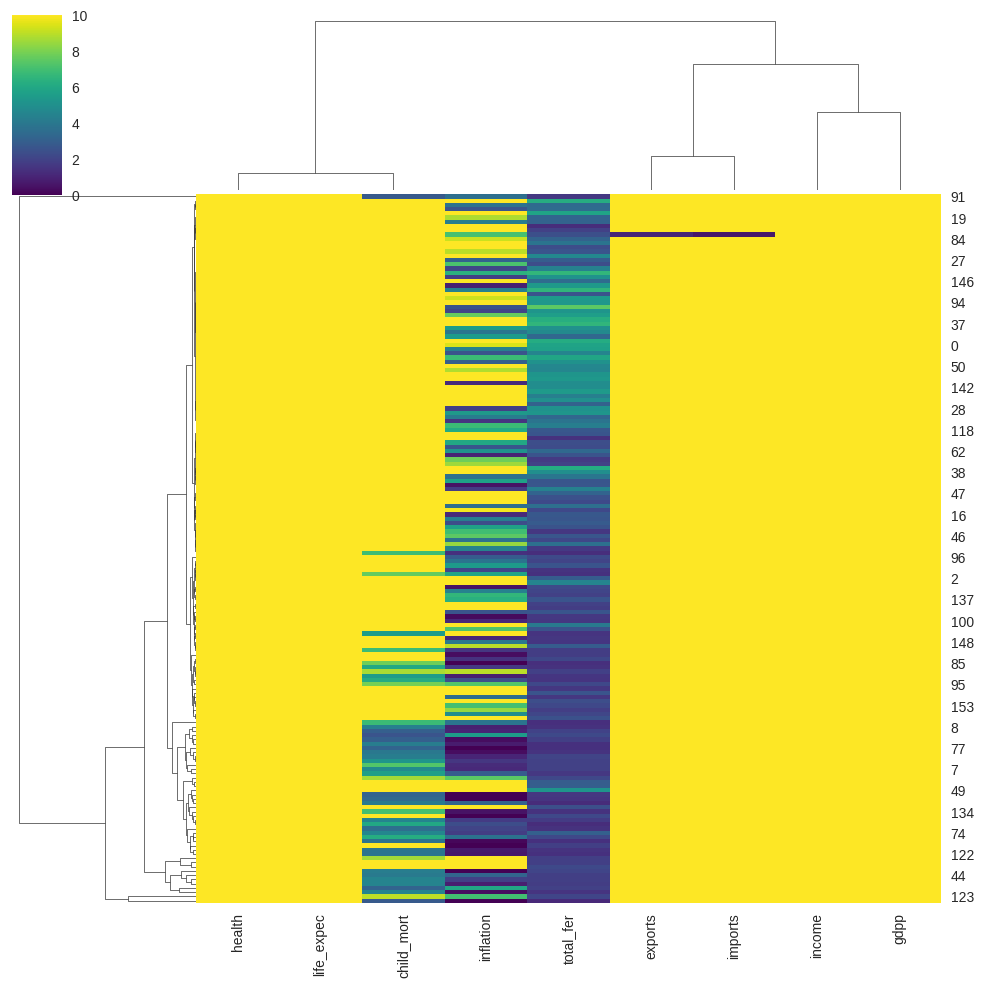

In [85]:
sns.clustermap(df1,cmap="viridis", vmin=0, vmax=10)

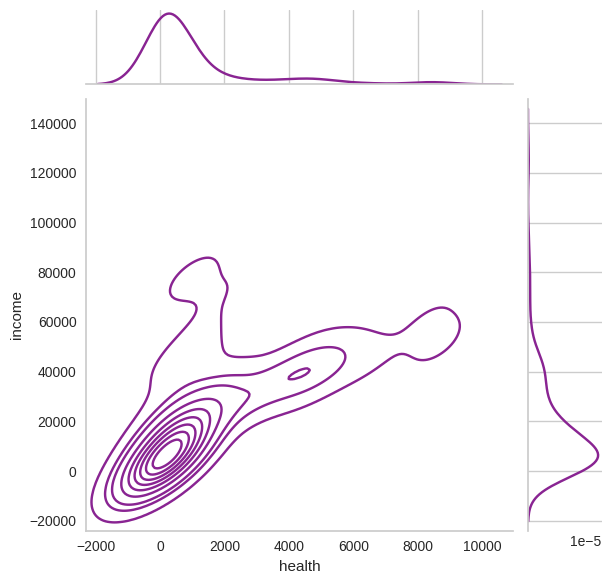

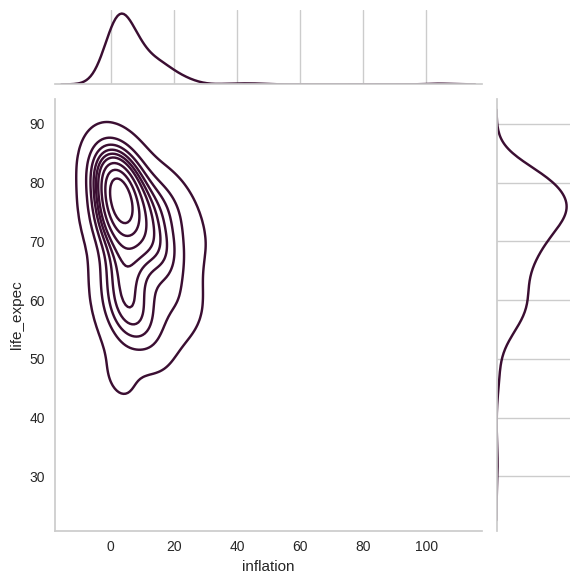

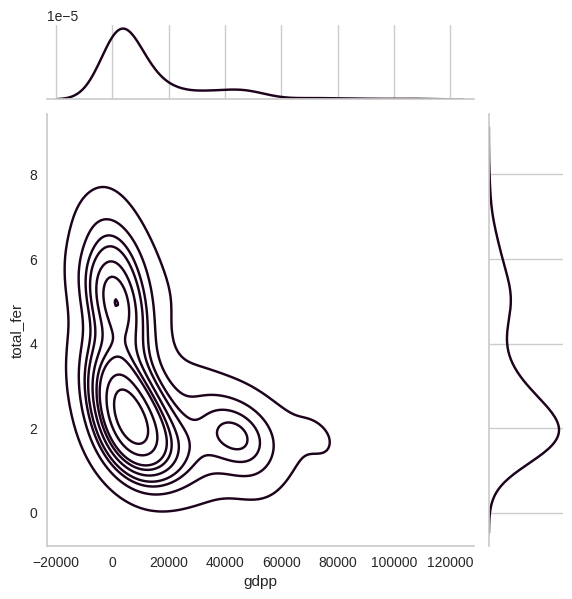

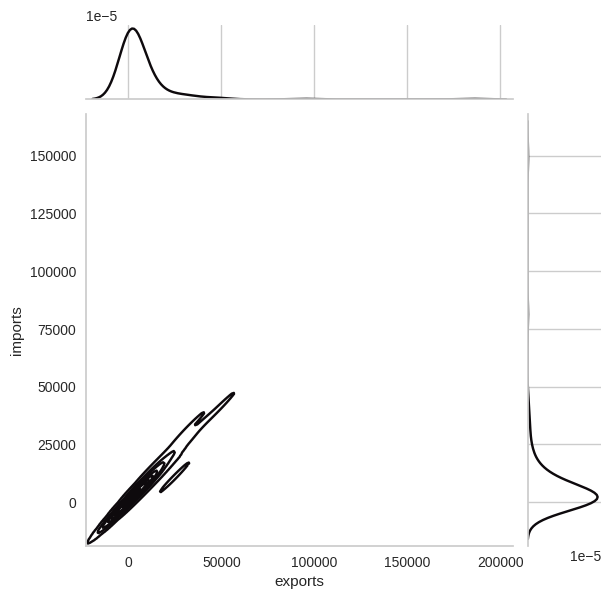

In [86]:

sns.jointplot(x='health', y='income', data = df, kind="kde",color="#892492")
plt.grid()
sns.jointplot(x='inflation', y='life_expec', data = df, kind="kde",color="#3b0e32")
plt.grid()
sns.jointplot(x='gdpp', y='total_fer', data = df, kind="kde",color="#1d031c")
plt.grid()
sns.jointplot(x='exports', y='imports', data = df, kind="kde",color="#0e0a0d")
plt.grid()

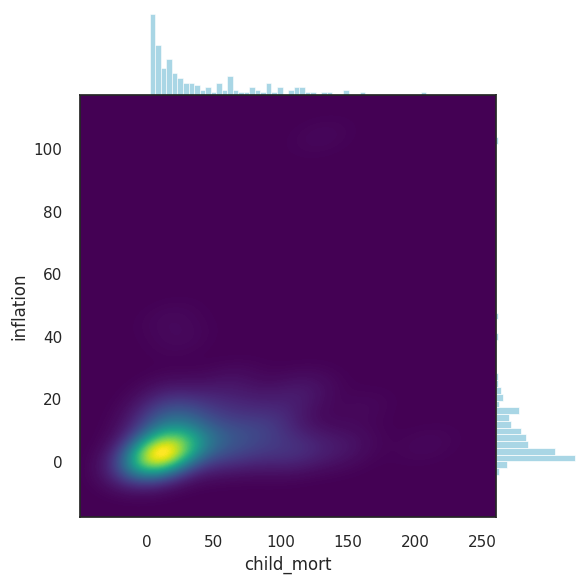

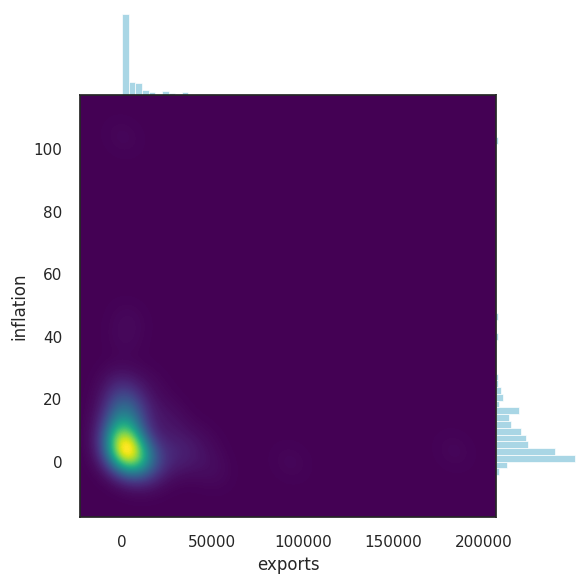

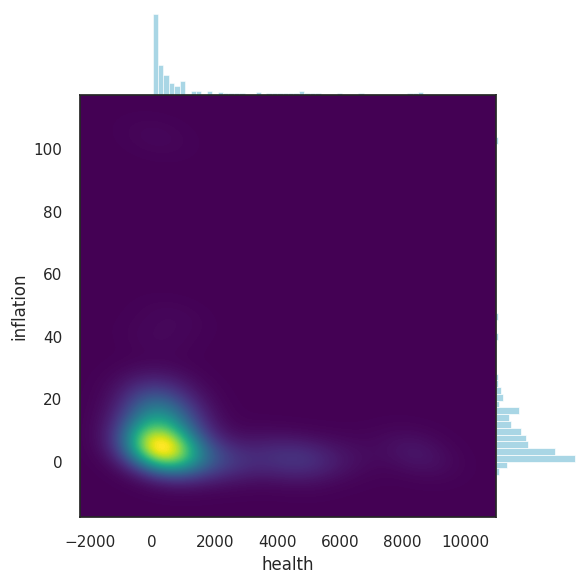

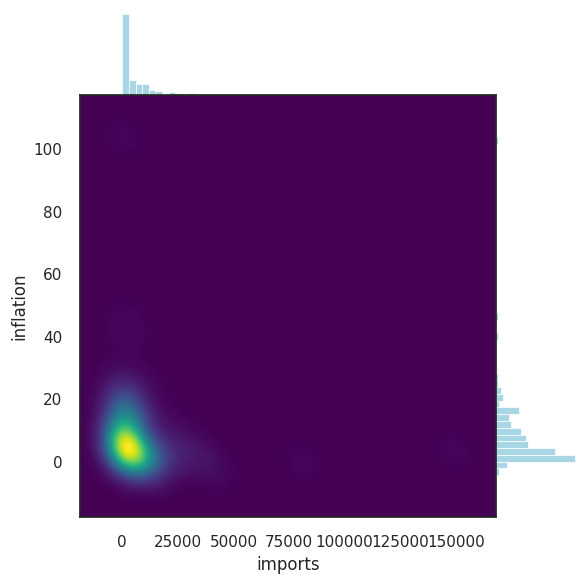

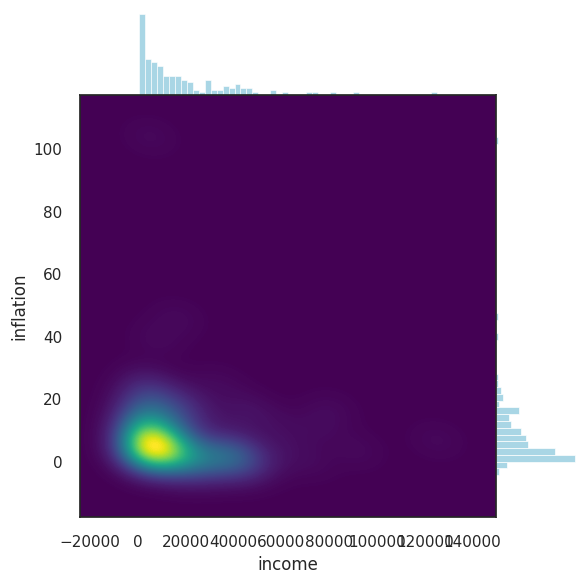

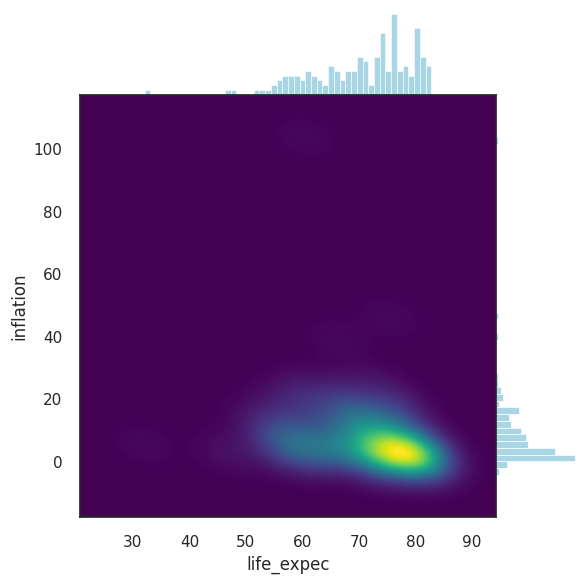

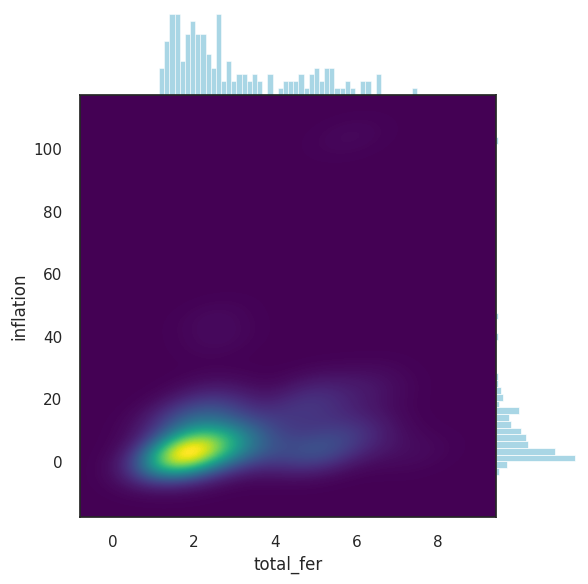

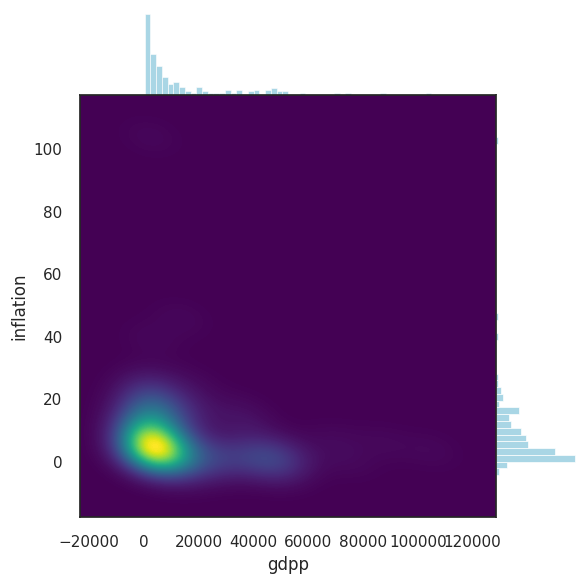

In [87]:
df_c=['child_mort', 'exports', 'health', 'imports', 'income', 'life_expec', 'total_fer', 'gdpp']  
for i in df_c:
    sns.set_theme(style="white")
    g = sns.JointGrid(data=df, x=i,y='inflation',space=0)
    g.plot_joint(sns.kdeplot,fill=True,thresh=0, levels=200, cmap="viridis")
    g.plot_marginals(sns.histplot, color="#a9d6e5", alpha=1, bins=50)

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- histograms and datas' density are displayed in the above graphs.

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Clustring Models</p>

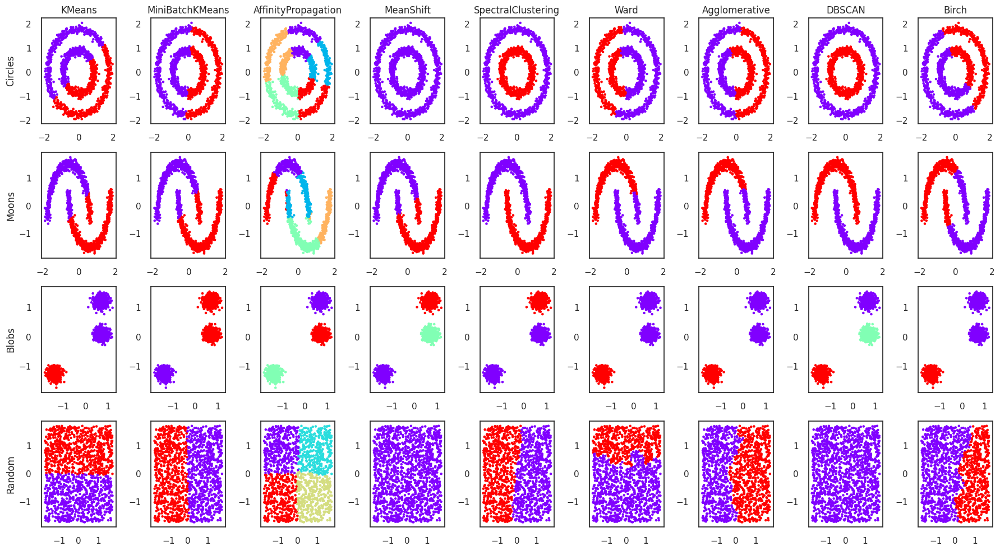

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import cluster, datasets
from sklearn.preprocessing import StandardScaler


n_samples = 1500
noisy_circles, _ = datasets.make_circles(n_samples=n_samples, factor=.5, noise=.05)
noisy_moons, _ = datasets.make_moons(n_samples=n_samples, noise=.05)
blobs, _ = datasets.make_blobs(n_samples=n_samples, random_state=8)
no_structure = np.random.rand(n_samples, 2)


datasets_list = [
    ("Circles", noisy_circles),
    ("Moons", noisy_moons),
    ("Blobs", blobs),
    ("Random", no_structure),
]


clustering_algorithms = [
    ("KMeans", cluster.KMeans(n_clusters=2)),
    ("MiniBatchKMeans", cluster.MiniBatchKMeans(n_clusters=2)),
    ("AffinityPropagation", cluster.AffinityPropagation(damping=0.9, preference=-200)),
    ("MeanShift", cluster.MeanShift(bin_seeding=True)),
    ("SpectralClustering", cluster.SpectralClustering(n_clusters=2, affinity='nearest_neighbors')),
    ("Ward", cluster.AgglomerativeClustering(n_clusters=2, linkage='ward')),
    ("Agglomerative", cluster.AgglomerativeClustering(n_clusters=2, linkage='average')),
    ("DBSCAN", cluster.DBSCAN(eps=0.3)),
    ("Birch", cluster.Birch(n_clusters=2)),
]


plt.figure(figsize=(18, 10))

for i, (name, dataset) in enumerate(datasets_list):
    X = StandardScaler().fit_transform(dataset)

    for j, (algo_name, algorithm) in enumerate(clustering_algorithms):
        algorithm.fit(X)
        if hasattr(algorithm, 'labels_'):
            y_pred = algorithm.labels_.astype(int)
        else:
            y_pred = algorithm.predict(X)

        plt.subplot(len(datasets_list), len(clustering_algorithms), i * len(clustering_algorithms) + j + 1)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='rainbow', s=5)
        if i == 0:
            plt.title(algo_name)
        if j == 0:
            plt.ylabel(name)

plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- The dataset has many outliers.

 • Algorithms like KMeans, which are less sensitive to outliers, may give better results.

 • We will try different clustering algorithms and compare their performance.

 • Machine learning models don’t understand measurement units (like dollars, years, percentages). They 
 
 only see numbers.
 • That’s why scaling/normalization is important.

 • So, before clustering, we normalize the data.

👉 In short: We normalize the data first so clustering works correctly, even with outliers and different 

feature scales.

In [89]:
df2 = dff.copy()
df2 = df2.set_index(keys='country', drop=True).drop('Continent', axis=1)
scaler = StandardScaler().fit(df2) # standardize
dftrans = scaler.transform(df2)
df1 = pd.DataFrame(dftrans, columns = df2.columns, index=df2.index[:])
df1

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,1.291532,-0.411011,-0.565040,-0.432276,-0.808245,0.157336,-1.619092,1.902882,-0.679180
Albania,-0.538949,-0.350191,-0.439218,-0.313677,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
Algeria,-0.272833,-0.318526,-0.484826,-0.353720,-0.220844,0.789274,0.670423,-0.038404,-0.465376
Angola,2.007808,-0.291375,-0.532363,-0.345953,-0.585043,1.387054,-1.179234,2.128151,-0.516268
Antigua and Barbuda,-0.695634,-0.104331,-0.178771,0.040735,0.101732,-0.601749,0.704258,-0.541946,-0.041817
...,...,...,...,...,...,...,...,...,...
Vanuatu,-0.225578,-0.336864,-0.501562,-0.342488,-0.738527,-0.489784,-0.852161,0.365754,-0.546913
Venezuela,-0.526514,-0.199393,-0.219310,-0.287205,-0.033542,3.616865,0.546361,-0.316678,0.029323
Vietnam,-0.372315,-0.361463,-0.538488,-0.377572,-0.658404,0.409732,0.286958,-0.661206,-0.637754


<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- This code prepares the data for Clustering:

• Countries as index

• Continent column removed

• All features normalized (so that different measures like GDP, child_mortality, etc. are comparable).

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 📌 What is PCA?

A technique to reduce the number of features (columns) in your dataset.

⸻

📌 What does it do?

 • Takes your high-dimensional data (many columns).

 • Transforms it into a few new axes (called Principal Components).

 • These axes keep the most important variation/information in the data.

⸻

📌 Where is it useful?

 1. When you have too many features → to simplify the data.

 2. For 2D or 3D visualization of clusters.

 3. To remove correlations between features.

⸻

🔑 Practical use:

If you have 15 features, PCA can reduce them to 2 axes → so you can easily plot and see clusters. 🎯

In [90]:
pca = PCA(n_components=9) # Implement PCA 
pcadf = pd.DataFrame(pca.fit_transform(df1), columns=[f"pc{i}" for i in range(1,10)], index=df1.index)
pca.explained_variance_

array([5.33631081e+00, 1.67006556e+00, 8.97406142e-01, 5.49797220e-01,
       2.74267850e-01, 2.22718073e-01, 8.50864327e-02, 1.40921616e-02,
       4.47261467e-03])

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- • This property shows the amount of variance of each principal component.

• In simple terms: it shows how much information (variance of the data) each component has retained.

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- PCA creates new variables (principal components) by combining the original features.

 • These new variables are designed to capture the most variance in the data.

 • pc1 is the first principal component and explains the highest variance.

 • pc2 is the second principal component, explaining the next highest variance.

 • By using pc1, pc2, etc., we can simplify the data while keeping most of the important information.PCA 
 
 creates new variables (principal components) by combining the original features.

 • These new variables are designed to capture the most variance in the data.

 • pc1 is the first principal component and explains the highest variance.

 • pc2 is the second principal component, explaining the next highest variance.
 
 • By using pc1, pc2, etc., we can simplify the data while keeping most of the important information.

In [91]:
pca.explained_variance_ratio_

array([5.89372984e-01, 1.84451685e-01, 9.91147170e-02, 6.07227801e-02,
       3.02917253e-02, 2.45982702e-02, 9.39743701e-03, 1.55641971e-03,
       4.93981394e-04])

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- • This array shows what proportion of the total variance of the data each principal component (pc1, pc2, …) explains.

• In simple terms: what percentage of the data information is in each component.

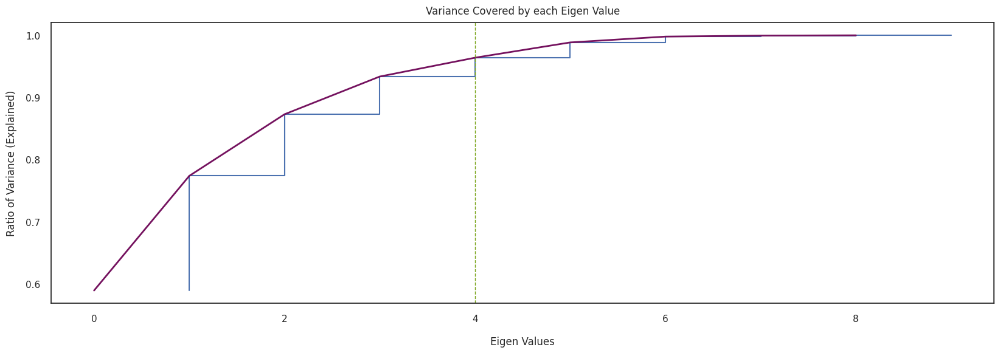

In [92]:
plt.figure(figsize=(20, 6))
plt.step(list(range(1,10)), np.cumsum(pca.explained_variance_ratio_)) # plot cusum of explained_variacne_ratio
plt.plot(np.cumsum(pca.explained_variance_ratio_), color="#74115E", linewidth=2)
plt.axvline(x=4, color="#76a113", label='axvline-fullheight', ls='--', linewidth=1)
plt.xlabel('Eigen Values', labelpad=15)
plt.ylabel('Ratio of Variance (Explained)', labelpad=10)
plt.title('Variance Covered by each Eigen Value', pad=10)
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- “By looking at the cumulative variance of each component in PCA, we select the components that have the 

most information (e.g., the first 4 components), and remove the rest to make the data simpler and more 

analyzable.

In [93]:
pcadf

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9
country,,,,,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0.023530,-0.295663,-0.402107,0.015225,0.021453
Albania,-0.024206,-1.429892,-0.014123,0.450645,-0.125821,0.059231,0.262750,0.000376,-0.033883
Algeria,-0.459557,-0.675495,0.959355,0.218456,-0.113275,-0.415597,0.226681,0.041704,-0.032664
Angola,-2.722630,2.172332,0.600215,-0.433978,0.005433,-0.450064,0.296409,-0.002103,0.029095
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0.072694,-0.240630,0.054647,-0.009627,0.089558
...,...,...,...,...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,-0.119733,0.056193,-0.687250,-0.084313,-0.018204
Venezuela,-0.314228,-0.016266,3.680273,0.011835,-0.460468,0.181382,-0.068043,-0.192189,0.000312
Vietnam,-0.594449,-1.076335,0.528875,0.508854,-0.328297,0.219081,0.127677,-0.037543,-0.073860


In [94]:
pcadff = pcadf.drop(columns = [f"pc{i}" for i in range(5,10)]) # storing pc1, pc2, pc3, and pc4 


In [95]:
pcadff.head()

,pc1,pc2,pc3,pc4
country,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326
Albania,-0.024206,-1.429892,-0.014123,0.450645
Algeria,-0.459557,-0.675495,0.959355,0.218456
Angola,-2.722630,2.172332,0.600215,-0.433978
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201


<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">K-Means</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- The KMeans algorithm groups data into k clusters by minimizing inertia, which measures the internal 

variance of each cluster. To choose the best number of clusters, the elbow method is used. Once the 

optimal k is identified, KMeans is applied to segment the data accordingly. 🧠📊

In [96]:
kmeans_set = {"init":"random", "n_init":10, "max_iter":300, "random_state":42}
inertias = [] # inertia for k cluster
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(pcadff)
    inertias.append(kmeans.inertia_)

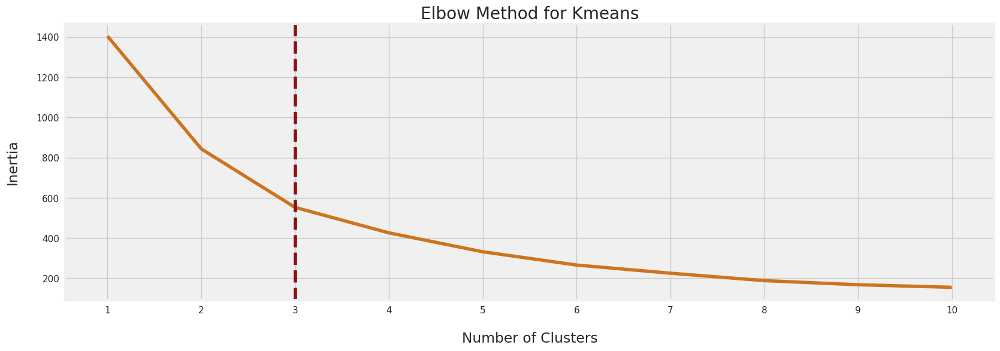

In [97]:
def elbow_optimizer(inertias,i):
    kl = KneeLocator(range(1,11), inertias, curve='convex', direction="decreasing")
    plt.figure(figsize=(20, 6))
    plt.style.use("fivethirtyeight")
    sns.lineplot(x=range(1,11), y=inertias, color="#CE731F")
    plt.xticks(range(1,11))
    plt.xlabel("Number of Clusters", labelpad=20)
    plt.ylabel("Inertia", labelpad=20)
    plt.title(f"Elbow Method for {i}", y=1)
    plt.axvline(x=kl.elbow, color="#8a1111", label='axvline-fullheight', ls='--')
    plt.show()
elbow_optimizer(inertias, 'Kmeans') # elbow_optimizer function for KMeans

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 📌 Using the elbow method, we found that the best number of clusters for K-Means is 4.

✅ Now, to double-check this result, we will use two internal validation methods:

 • Silhouette Score → tells us how well-separated the clusters are.
 
 • Calinski-Harabasz Score → tells us how compact and distinct the clusters are.

In [98]:
silhouette = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(pcadff)
    score = silhouette_score(pcadff, kmeans.labels_)
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_set)
    kmeans.fit(pcadff)
    score = calinski_harabasz_score(pcadff, kmeans.labels_)
    calinski_harabasz.append(score)

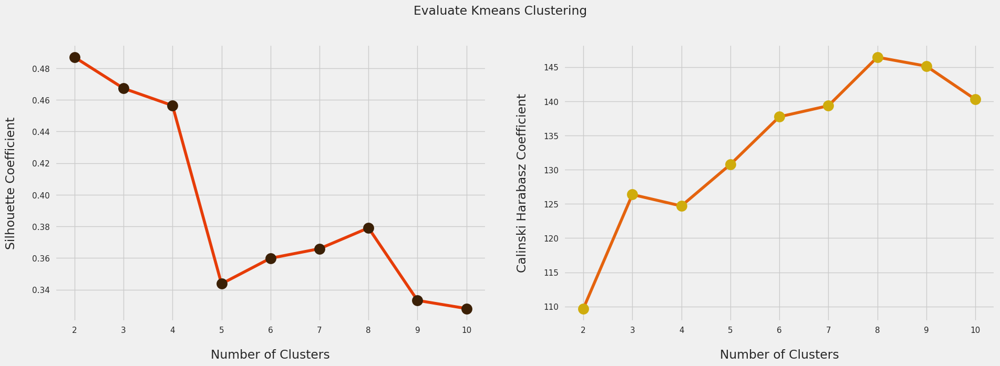

In [99]:
def plot_evaluation(sil, cal, name, x=range(2,11)):
    fig, ax = plt.subplots(1,2,figsize=(20,8), dpi=100)
    ax[0].plot(x, sil, color="#e63c08", marker='o', ms=15, mfc="#3b2006")
    ax[1].plot(x, cal, color="#e4630e", marker='o', ms=15, mfc="#cfac0d")
    ax[0].set_xlabel("Number of Clusters", labelpad=20)
    ax[0].set_ylabel("Silhouette Coefficient", labelpad=20)
    ax[1].set_xlabel("Number of Clusters", labelpad=20)
    ax[1].set_ylabel("Calinski Harabasz Coefficient", labelpad=20)
    plt.suptitle(f'Evaluate {name} Clustering',y=0.92)
    plt.tight_layout(pad=3)
    plt.show()
# checking the correctness of the elbow method's result 
plot_evaluation(silhouette, calinski_harabasz, 'Kmeans')

<div style="
    background: linear-gradient(135deg, #667eea, #764ba2);
    border-radius: 15px;
    padding: 20px 30px;
    color: white;
    font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
    font-size: 1.4em;
    font-weight: 700;
    text-align: center;
    box-shadow: 0 8px 15px rgba(118, 75, 162, 0.4);
    letter-spacing: 1.2px;
    user-select: none;
    max-width: 300px;
    margin: 25px auto;
    ">
    <em>Based on the data depicted in the preceding graphs, both visual representations indicate that the ideal number of clusters is 4
</em>
</div>


In [100]:
best_model = pd.DataFrame({'model':[], 'sil_score':[], 'ch_score':[]})

In [101]:
kmeans = KMeans(n_clusters=4, **kmeans_set).fit(pcadff)
pred = kmeans.labels_
centroids = kmeans.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [pcadff.columns])
centroids.T

,0,1,2,3
pc1,2.760410,-2.277385,6.857023,-0.176385
pc2,-0.194800,1.231258,2.921616,-0.852844
pc3,-0.041758,-0.211436,-0.155024,0.148576
pc4,-0.694383,-0.169223,0.523043,0.311035


In [102]:
best_model.loc[len(best_model.index)] = [f"Kmeans",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [103]:
df_result_kmeans = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1) ## adding the clusters column to the main dataframe
df_result_kmeans

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,1
Albania,-0.024206,-1.429892,-0.014123,0.450645,3
Algeria,-0.459557,-0.675495,0.959355,0.218456,3
Angola,-2.722630,2.172332,0.600215,-0.433978,1
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,3
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,3
Venezuela,-0.314228,-0.016266,3.680273,0.011835,3
Vietnam,-0.594449,-1.076335,0.528875,0.508854,3


In [104]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def check_result(data, plot=False):
    if plot:
      
        plt.style.use('ggplot')  

      
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))

      
        sns.countplot(data=data, x='cluster', palette="viridis", ax=ax[0])
        ax[0].set_title('Cluster Counts', fontsize=14)
        ax[0].set_ylabel('Count', fontsize=12)
        ax[0].set_xlabel('Cluster', fontsize=12)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=0)

      
        slices = data['cluster'].value_counts().sort_index().values
        labels = data['cluster'].value_counts().sort_index().index
        ax[1].pie(slices, labels=labels, colors=sns.color_palette('viridis'),
                  autopct='%1.1f%%', startangle=90)
        ax[1].set_title('Cluster Percentage', fontsize=14)

    
        fig.suptitle('Distribution of Clusters', fontsize=16)
        plt.tight_layout()
        plt.show()

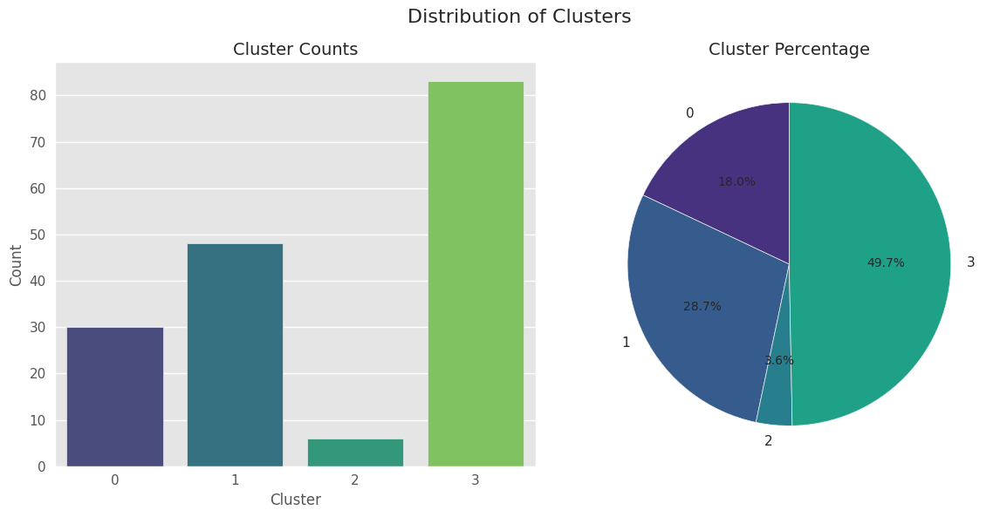

In [105]:
check_result(df_result_kmeans, plot=True)

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

-🎯 Purpose:

This function helps you analyze and interpret your clustering results. By looking at the charts, you can 

quickly understand:

• Whether clusters are balanced or imbalanced

• If any cluster is disproportionately large or small

• How your data is distributed across clusters

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Mini Batch K-Means</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

-🔹 What is MiniBatchKMeans?

MiniBatchKMeans is a faster variation of the KMeans clustering algorithm. Instead of using the entire dataset for each iteration, it processes small random subsets of the data called mini-batches.

⸻

🔹 How it works (in simple terms):
 1. Select a small random batch of data points.
 2. Update the cluster centers (centroids) using only that batch.
 3. Repeat the process with new mini-batches until convergence.

⸻

🔹 Advantages:
 • Much faster than standard KMeans, especially for very large datasets.
 • Requires less memory because it never loads the full dataset at once.
 • Works well for streaming data or when data arrives in chunks.

⸻

🔹 Disadvantages:
 • The final clusters are usually slightly less accurate compared to standard KMeans.
 • Results may vary a bit depending on the random mini-batches chosen.

⸻

🔹 When to use it?
 • When working with very large datasets that don’t fit into memory.
 • When speed is more important than achieving the absolute best clustering quality.

⸻

👉 In short:
MiniBatchKMeans = a faster, memory-efficient version of KMeans. It trades a little accuracy for a big 

gain in speed, which is usually acceptable in real-world scenarios

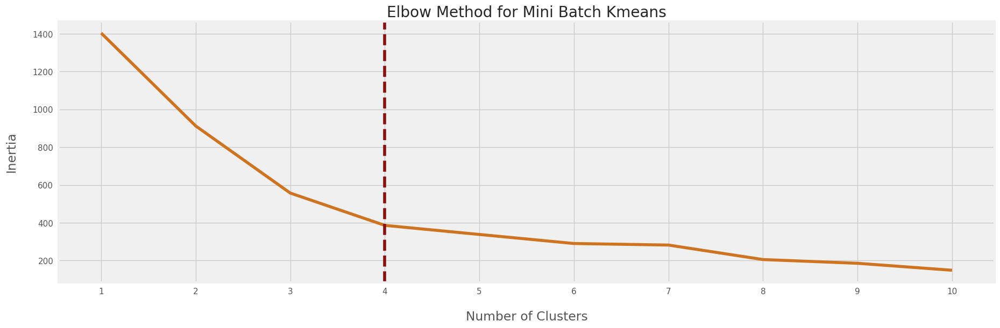

In [106]:
inertias = []
for k in range(1,11):
    minibatchkmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    minibatchkmeans.fit(pcadff)
    inertias.append(minibatchkmeans.inertia_)
elbow_optimizer(inertias, 'Mini Batch Kmeans')

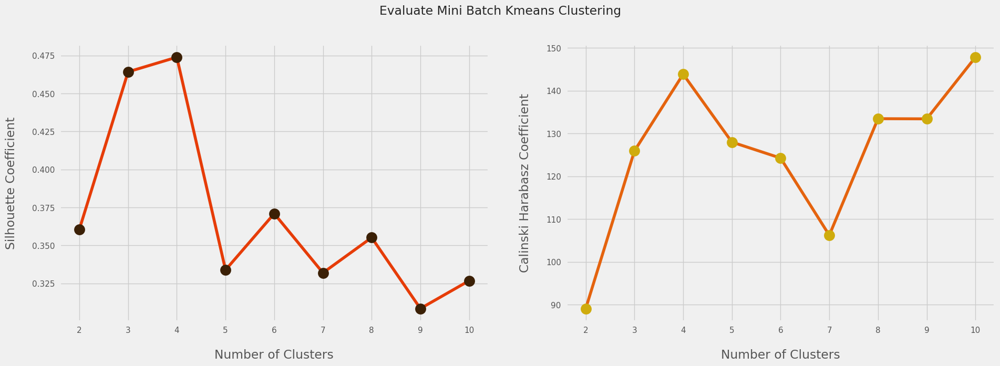

In [107]:
silhouette = []
for k in range(2,11):
    minibatchmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    minibatchmeans.fit(pcadff)
    score = silhouette_score(pcadff, minibatchmeans.labels_)
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    minibatchmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    minibatchmeans.fit(pcadff)
    score = calinski_harabasz_score(pcadff, minibatchmeans.labels_)
    calinski_harabasz.append(score)
plot_evaluation(silhouette, calinski_harabasz, 'Mini Batch Kmeans')

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- According to both evaluations, a "k" value of 3 is deemed most favorable. We conclude that "k" equal to 3 is the optimal choice. 📊🔍.

In [108]:
minibatchmeans = MiniBatchKMeans(n_clusters=3, random_state=42).fit(pcadff)
pred = minibatchmeans.labels_
centroids = minibatchmeans.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [pcadff.columns])
centroids.T

,0,1,2
pc1,0.145827,-2.134041,4.138936
pc2,-0.882841,1.019754,0.781802
pc3,0.133612,-0.181684,-0.015925
pc4,0.259045,-0.114079,-0.665064


In [109]:
best_model.loc[len(best_model.index)] = [f"Mini Batch Kmeans",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [110]:
df_mbkmeans = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1)
df_mbkmeans

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,1
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,1
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,0
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


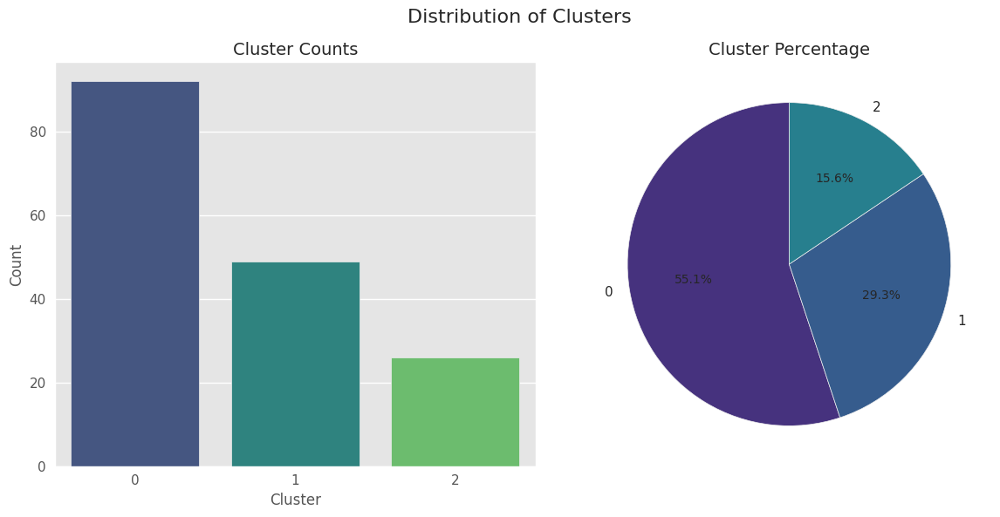

In [111]:
check_result(df_mbkmeans, plot=True)

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Gaussian Mixture Model</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 🔹 K-Means vs GMM
 • K-Means → Hard clustering: each data point belongs to exactly one cluster, no probabilities.
 • GMM (Gaussian Mixture Models) → Soft clustering: each data point belongs to clusters with probabilities, making it more flexible.

⸻

🔹 Choosing the number of clusters
 • Use BIC (Bayesian Information Criterion) to find the optimal number of components (clusters).

⸻

🔹 Covariance types in GMM
 1. full → each cluster has its own full covariance matrix.
 2. tied → all clusters share the same covariance matrix.
 3. diag → each cluster has a diagonal covariance matrix (features are independent within clusters).
 4. spherical → each cluster has a single variance value (spherical shape).

⸻

✅ In short:
GMM is more flexible than K-Means because it assigns data points to clusters based on probabilities. The number of clusters and the covariance type can be chosen using BIC.

In [112]:
set_config(display='diagram')

In [113]:
BIC_score = []
n = []
types = []
for k in range(1,11):
    for type in ["spherical", "tied", "diag", "full"]:
        gmm = GaussianMixture(n_components=k, random_state=42, covariance_type=type)
        gmm.fit(pcadff)
        BIC_score.append(gmm.bic(pcadff))
        n.append(k)
        types.append(type)
result = pd.DataFrame()
result['n_components'] = n
result['covariance_type'] = types
result['BIC_score'] = BIC_score


In [114]:
# show obtained results
result.sort_values(by='BIC_score', ascending=True).head().style.background_gradient(cmap='viridis', subset='BIC_score')

,n_components,covariance_type,BIC_score
35,9,full,1239.173473
39,10,full,1243.457023
19,5,full,1264.845559
31,8,full,1267.708594
27,7,full,1268.966684


<Figure size 3000x1000 with 0 Axes>

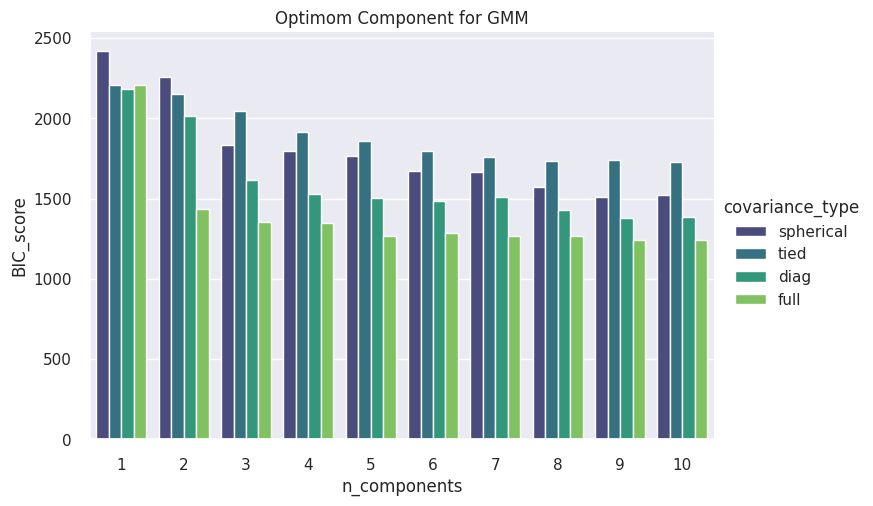

In [115]:
sns.set(font_scale=1)
plt.figure(figsize=(30, 10))
sns.catplot(
    data=result,
    kind="bar",
    x="n_components",
    y="BIC_score",
    hue="covariance_type",
    palette="viridis",
    aspect=1.5)
plt.title("Optimom Component for GMM")
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- The BIC score indicates that the optimal number of components for GMM is 6. This result will then be validated using internal metrics such as silhouette_score and calinski_harabasz_score.

<a id="ml"></a>
# <p style="background-color:#ff68b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Gaussian Mixture</p>

In [116]:
silhouette = []
for k in range(2,11):
    gm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gm.fit(pcadff)
    score = silhouette_score(pcadff, gm.predict(pcadff))
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    gm = GaussianMixture(n_components=k, covariance_type='full', random_state=42)
    gm.fit(pcadff)
    score = calinski_harabasz_score(pcadff, gm.predict(pcadff))
    calinski_harabasz.append(score)

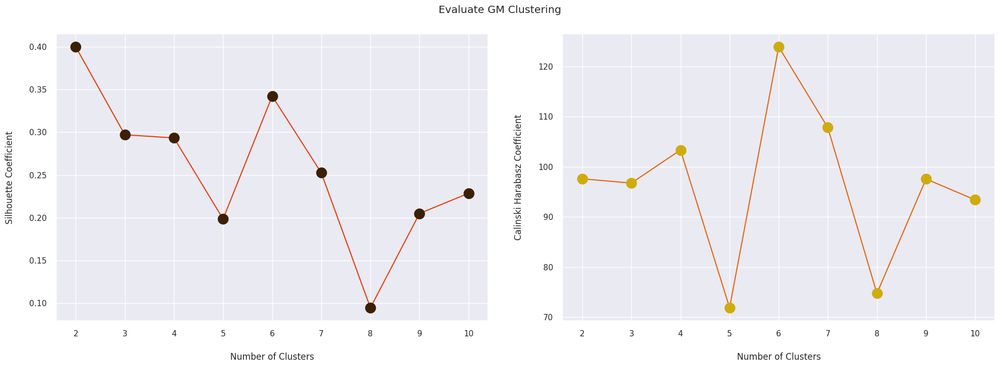

In [117]:
plot_evaluation(silhouette, calinski_harabasz, 'GM')

In [118]:
best_k_silhouette = np.argmax(silhouette) + 2  
best_k_ch = np.argmax(calinski_harabasz) + 2

print(f"Best k by Silhouette Score: {best_k_silhouette}")
print(f"Best k by Calinski-Harabasz Index: {best_k_ch}")

Best k by Silhouette Score: 2
Best k by Calinski-Harabasz Index: 6


In [119]:
gm = GaussianMixture(n_components=5, random_state=42, covariance_type='full')
gm.fit(pcadff)
pred = gm.predict(pcadff)
cluster_means = gm.means_
cluster_means = pd.DataFrame(data=cluster_means, columns = [pcadff.columns])
cluster_means.T

,0,1,2,3,4
pc1,-1.453448,-1.256203,4.030102,12.648065,1.068756
pc2,0.114887,0.500382,0.600407,8.276683,-0.839335
pc3,-0.241831,0.741208,-0.154778,-0.619787,0.077793
pc4,0.098020,0.029223,-0.866750,4.398488,0.079008


In [120]:
best_model.loc[len(best_model.index)] = [f"GMM",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [121]:
df_gm = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1)
df_gm

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,1
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,4
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,1
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


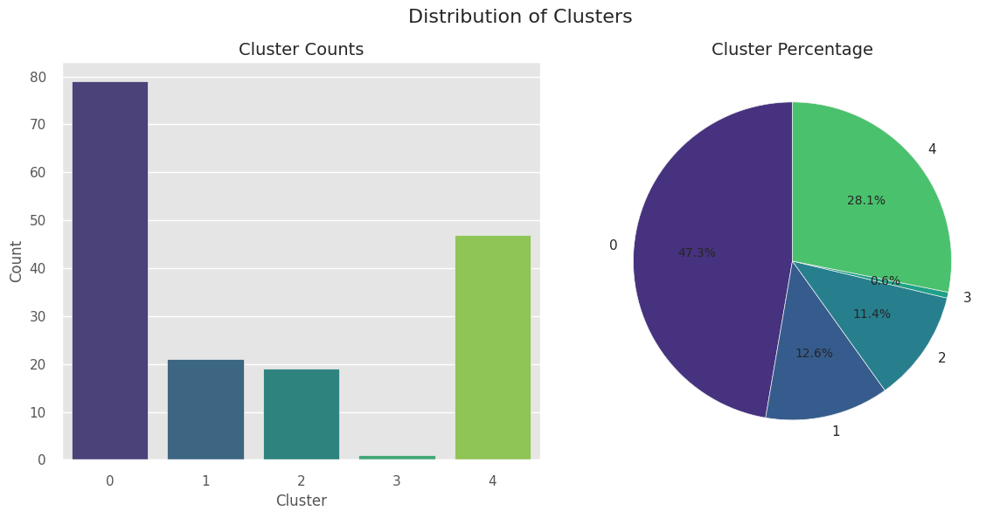

In [122]:
check_result(df_gm, plot=True)

In [123]:
df_gm['cluster'].value_counts()

cluster
0    79
4    47
1    21
2    19
3     1
Name: count, dtype: int64

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- The BIC score  suggest the optimal number of components is 5. Therefore, GMM will be rerun with n_components = 5

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- If you’re using Gaussian Mixture Models (GMM), then BIC (Bayesian Information Criterion) is the most reliable metric for choosing the number of components.

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Variational Bayesian Gaussian Mixture:¶</p>

In [124]:
silhouette = []
for k in range(2,11):
    bg = BayesianGaussianMixture(n_components=k, random_state=42)
    bg.fit(pcadf)
    score = silhouette_score(pcadf, bg.fit_predict(pcadf))
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    bg = BayesianGaussianMixture(n_components=k, random_state=42)
    bg.fit(pcadf)
    score = calinski_harabasz_score(pcadf, bg.fit_predict(pcadf))
    calinski_harabasz.append(score)

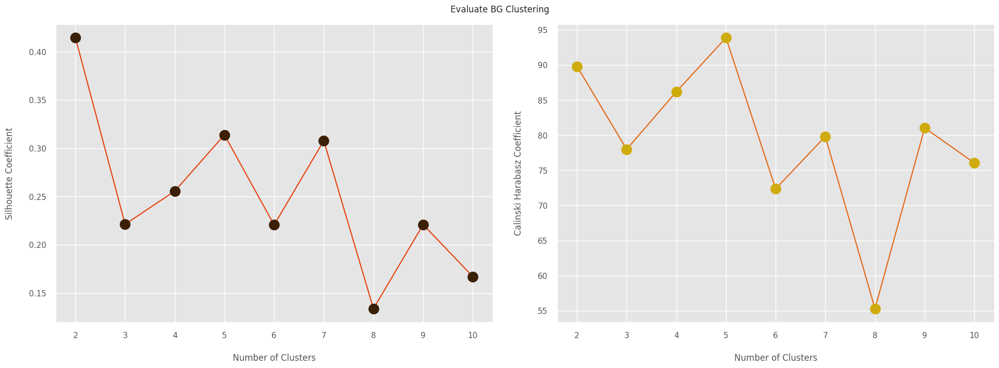

In [125]:
plot_evaluation(silhouette, calinski_harabasz, 'BG')

The results obtained from BayesianGaussianMixture are similar to the results of GaussianMixture.

In [126]:
bg = BayesianGaussianMixture(n_components=4, random_state=42)
bg.fit(pcadff)
pred = bg.fit_predict(pcadff)
cluster_means = bg.means_
cluster_means = pd.DataFrame(data=cluster_means, columns = [pcadff.columns])
cluster_means.T

,0,1,2,3
pc1,-0.141345,-1.989355,2.828451,6.380958
pc2,-0.907324,0.959500,0.006202,3.713175
pc3,-0.010508,0.000745,0.044870,-0.311597
pc4,0.322244,-0.106499,-0.683171,2.615545


In [127]:
best_model.loc[len(best_model.index)] = [f"BG",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [128]:

df_bg = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1)
df_bg

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,1
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,1
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,1
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


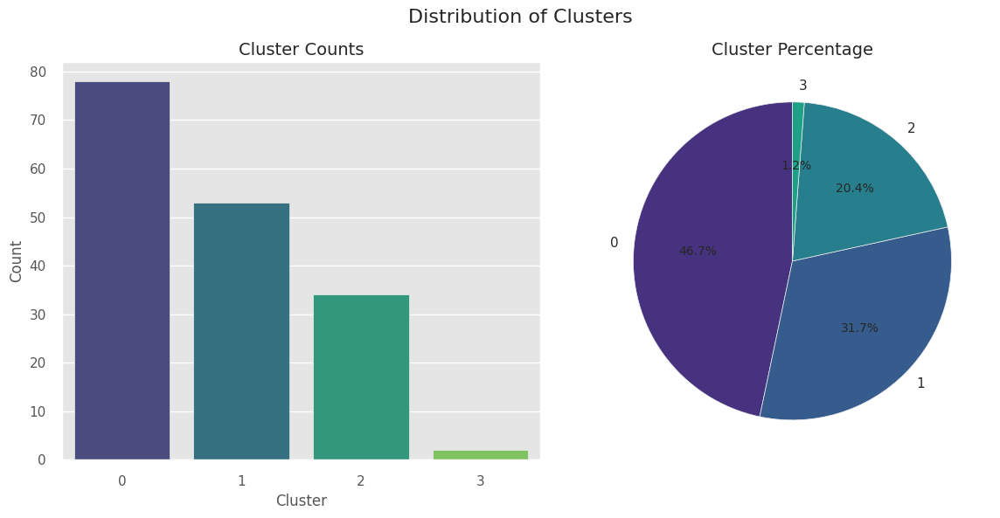

In [129]:
check_result(df_bg, plot=True)

In [130]:
df_bg['cluster'].value_counts()

cluster
0    78
1    53
2    34
3     2
Name: count, dtype: int64

In [131]:
df_bg[df_bg['cluster'] == 3].describe()

,pc1,pc2,pc3,pc4,cluster
count,2.000000,2.000000,2.000000,2.000000,2.0
mean,9.619236,5.613801,-0.470027,3.941955,3.0
std,4.283411,3.765884,0.211793,0.645634,0.0
min,6.590407,2.950919,-0.619787,3.485423,3.0
25%,8.104821,4.282360,-0.544907,3.713689,3.0
50%,9.619236,5.613801,-0.470027,3.941955,3.0
75%,11.133650,6.945242,-0.395147,4.170221,3.0
max,12.648065,8.276683,-0.320267,4.398488,3.0


In [132]:
df_bg[df_bg['cluster'] == 3][['pc1', 'pc2', 'pc3',"pc4"]].head()

,pc1,pc2,pc3,pc4
country,,,,
Luxembourg,12.648065,8.276683,-0.619787,4.398488
Singapore,6.590407,2.950919,-0.320267,3.485423


In [133]:
df_bg[df_bg['cluster'] == 1][['pc1', 'pc2', 'pc3',"pc4"]].head()

,pc1,pc2,pc3,pc4
country,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326
Angola,-2.722630,2.172332,0.600215,-0.433978
Argentina,0.035422,-0.685251,1.468697,-0.028838
Benin,-2.363962,1.171696,-1.247192,-0.257106
Botswana,-1.129489,0.401611,-0.231994,0.102647


<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- With 4 clusters, only one cluster is extremely small. That might be an outlier group or a niche segment.

• With 5 clusters, you now have two very small clusters, which increases the risk of overfitting—the 

 model may be splitting too much and creating clusters that aren’t meaningful.

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Hierarchical Model</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

-Hierarchical Clustering is a tree-based method for grouping data.

It comes in two main types:

 • Agglomerative: Starts with individual points and merges them. 🔄

 • Divisive: Starts with all points in one cluster and splits them. 🚪

✅ Pros:

 • No need to predefine the number of clusters

 • Great for exploratory analysis

⚠️ Cons:

 • Slow for large datasets
 
 • Results depend on the linkage method used 📏

In [134]:
silhouette = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(pcadff)
    score = silhouette_score(pcadff, agg.fit_predict(pcadff))
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,15):
    agg = AgglomerativeClustering(n_clusters=k)
    agg.fit(pcadff)
    score = calinski_harabasz_score(pcadff, agg.fit_predict(pcadff))
    calinski_harabasz.append(score)

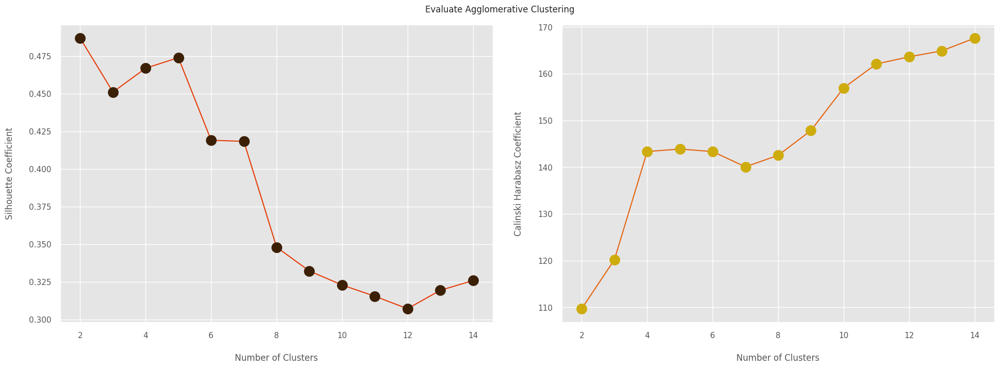

In [135]:
plot_evaluation(silhouette, calinski_harabasz, 'Agglomerative', x=range(2,15))

n_clusters=5 ,4 seems to be the best option.

In [136]:
agg = AgglomerativeClustering(n_clusters=4)
agg.fit(pcadff)
pred = agg.labels_
sh_score = silhouette_score(pcadff, pred)
ch_score = calinski_harabasz_score(pcadff, pred)
print(f"Silhouette Coef: {sh_score:.2f}")
print(f"Calinski Harabasz Coef: {ch_score:.2f}")
pcadff_agg = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1)
pcadff_agg

Silhouette Coef: 0.47
Calinski Harabasz Coef: 143.35


,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,2
Algeria,-0.459557,-0.675495,0.959355,0.218456,2
Angola,-2.722630,2.172332,0.600215,-0.433978,0
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,2
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,2
Venezuela,-0.314228,-0.016266,3.680273,0.011835,2
Vietnam,-0.594449,-1.076335,0.528875,0.508854,2


In [137]:
best_model.loc[len(best_model.index)] = [f"Agglomerative",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

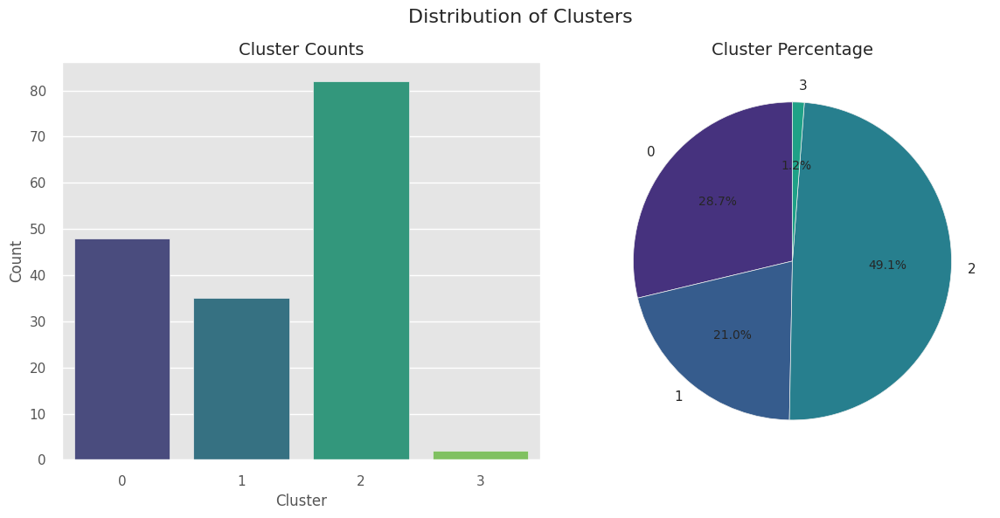

In [138]:
check_result(pcadff_agg, plot=True)

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">DBSCAN Model</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- ✅ What is DBSCAN?

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a clustering algorithm that groups points based on density, not distance or predefined number of clusters.

It’s great for:
 • Discovering clusters of any shape
 • Ignoring noise or outliers
 • Not needing to set the number of clusters in advance

⸻

🔧 DBSCAN has 2 key parameters:
 1. eps (epsilon):
 • The radius that defines how close points must be to be considered neighbors.
 • Too small? → Many points are labeled as noise
 • Too large? → Clusters merge into one

 2. MinPts (Minimum Points):
 • The minimum number of neighbors a point needs to be considered a core point (i.e. part of a cluster).
 • General rule:
 • MinPts ≥ D + 1 (where D = number of features)
 • Or even better: MinPts ≥ 2 × D for small/noisy datasets
 • Always keep it at least 3

⸻

📌 How to pick good values?

 • eps:
Use a k-distance graph from KNN. Look for the point where the curve drops sharply (the “elbow”) → that’s your ideal eps.

 • MinPts:
Based on your data’s dimensions, as explained above.

⸻

🧩 DBSCAN assigns points into 3 types:

 • Core Points: Inside dense areas

 • Border Points: Near core points but not dense enough themselves
 
 • Noise Points: Too far away from any cluster → labeled -1

Text(0.5, 1.0, 'K-Distance Graph')

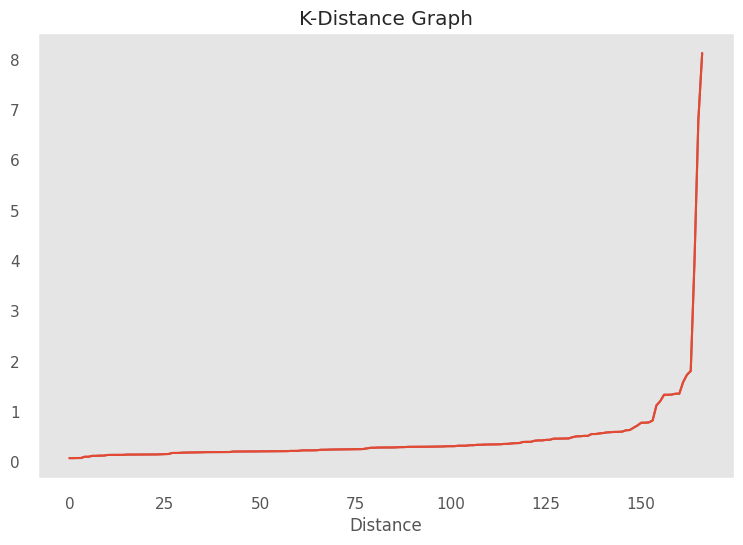

In [139]:
knn = NearestNeighbors(n_neighbors = 4)
model = knn.fit(pcadff)
distances, indices = knn.kneighbors(pcadff)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances, c='r', label='K-Distance')
plt.grid()
plt.plot(distances);
plt.xlabel('Distance')
plt.title('K-Distance Graph')

In [140]:
eps_values = np.arange(1,2,0.25) 
min_samples = np.arange(20,41,10) 
DBSCAN_params = list(product(eps_values, min_samples))

In [141]:
silhouette = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(pcadff)
    score = silhouette_score(pcadff, dbscan.labels_)
    silhouette.append(score)
    num_of_clusters.append(len(np.unique(dbscan.labels_)))
calinski_harabasz = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(pcadff)
    score = calinski_harabasz_score(pcadff, dbscan.labels_)
    calinski_harabasz.append(score)

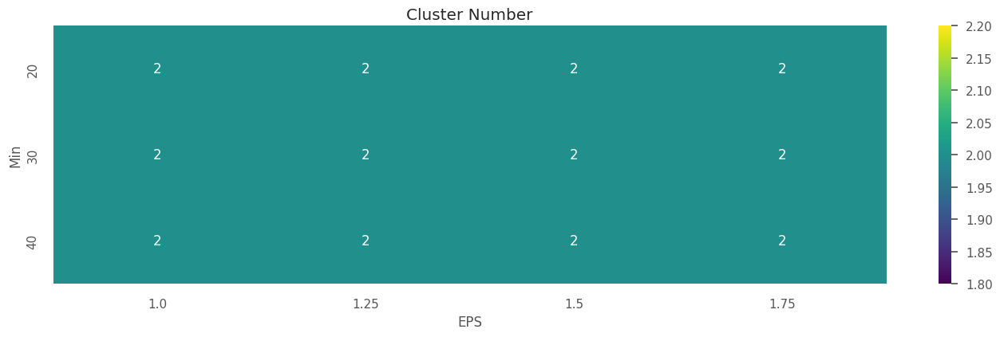

In [142]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['EPS', 'Min'])   
tmp['ClustersNumber'] = num_of_clusters
p = pd.pivot_table(tmp, values='ClustersNumber', index='Min', columns='EPS')
fig, ax = plt.subplots(figsize=(15,4))
sns.heatmap(p, annot=True,annot_kws={"size": 12}, cmap="viridis", ax=ax)
ax.set_title('Cluster Number')
plt.show()

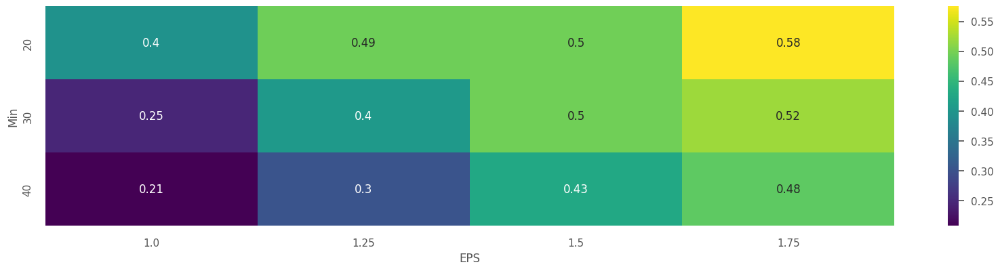

In [143]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['EPS', 'Min'])   
tmp['sillhouettescore'] = silhouette
p2 = pd.pivot_table(tmp, values='sillhouettescore', index='Min', columns='EPS')
fig, ax = plt.subplots(figsize=(18,4))
sns.heatmap(p2, annot=True, annot_kws={"size": 12}, cmap="viridis", ax=ax)
plt.show()

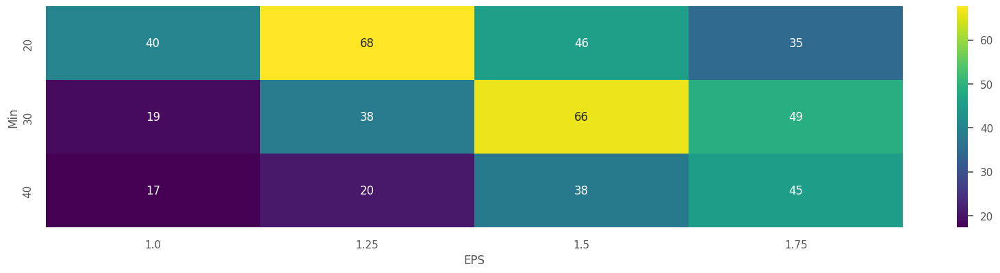

In [144]:
tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['EPS', 'Min'])   
tmp['CH_score'] = calinski_harabasz
p3 = pd.pivot_table(tmp, values='CH_score', index='Min', columns='EPS')
fig, ax = plt.subplots(figsize=(18,4))
sns.heatmap(p3, annot=True, annot_kws={"size": 12}, cmap="viridis", ax=ax)
plt.show()

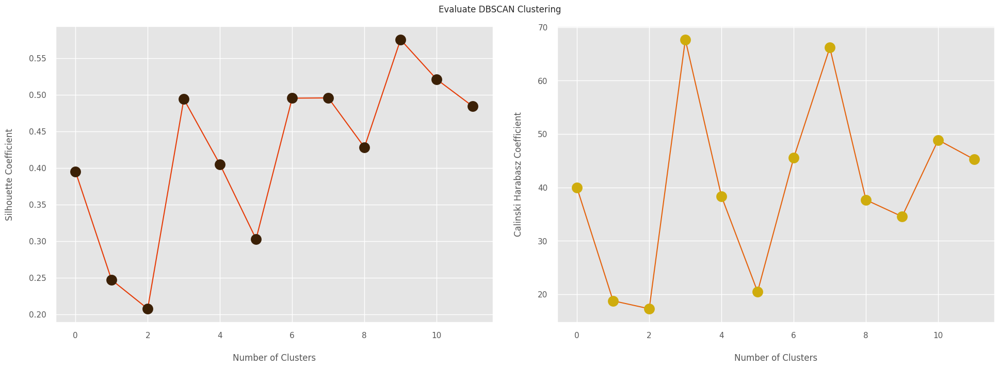

In [145]:
plot_evaluation(silhouette, calinski_harabasz, 'DBSCAN', x=range(len(DBSCAN_params)))

In [146]:
for i in enumerate(DBSCAN_params):
    print(i)

(0, (1.0, 20))
(1, (1.0, 30))
(2, (1.0, 40))
(3, (1.25, 20))
(4, (1.25, 30))
(5, (1.25, 40))
(6, (1.5, 20))
(7, (1.5, 30))
(8, (1.5, 40))
(9, (1.75, 20))
(10, (1.75, 30))
(11, (1.75, 40))


In [147]:
epsvals = np.arange(3,5,0.25)
min_samples = np.arange(20,41,10)
DBSCAN_params = list(product(epsvals, min_samples))

In [148]:
silhouette = []
num_of_clusters = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(pcadff)
    score = silhouette_score(pcadff, dbscan.labels_)
    silhouette.append(score)
    num_of_clusters.append(len(np.unique(dbscan.labels_)))
calinski_harabasz = []
for param in DBSCAN_params:
    dbscan = DBSCAN(eps=param[0], min_samples=param[1])
    dbscan.fit(pcadff)
    score = calinski_harabasz_score(pcadff, dbscan.labels_)
    calinski_harabasz.append(score)

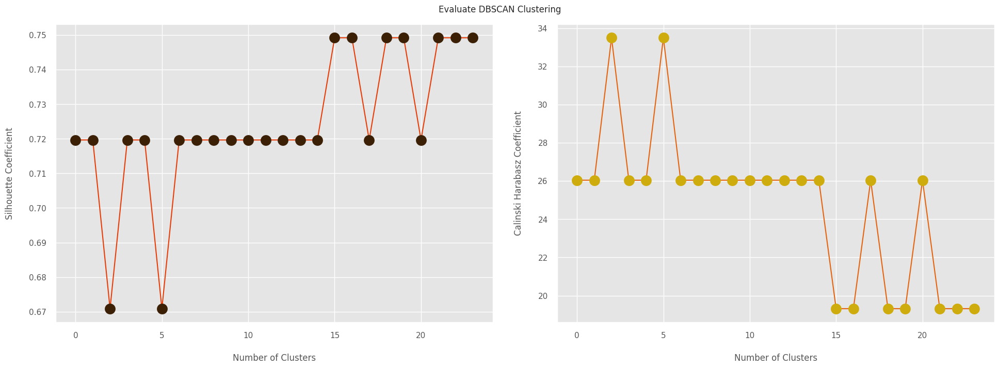

In [149]:
plot_evaluation(silhouette, calinski_harabasz, 'DBSCAN', x=range(len(DBSCAN_params)))

In [150]:
for i in enumerate(DBSCAN_params):
    print(i)

(0, (3.0, 20))
(1, (3.0, 30))
(2, (3.0, 40))
(3, (3.25, 20))
(4, (3.25, 30))
(5, (3.25, 40))
(6, (3.5, 20))
(7, (3.5, 30))
(8, (3.5, 40))
(9, (3.75, 20))
(10, (3.75, 30))
(11, (3.75, 40))
(12, (4.0, 20))
(13, (4.0, 30))
(14, (4.0, 40))
(15, (4.25, 20))
(16, (4.25, 30))
(17, (4.25, 40))
(18, (4.5, 20))
(19, (4.5, 30))
(20, (4.5, 40))
(21, (4.75, 20))
(22, (4.75, 30))
(23, (4.75, 40))


In [151]:
dbscan = DBSCAN(eps=3.5, min_samples=30)
dbscan.fit(pcadff)
pred = dbscan.labels_
num_of_clusters = len(np.unique(pred))
sh_score = silhouette_score(pcadff, pred)
ch_score = calinski_harabasz_score(pcadff, pred)
print(f"Number of cluster: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score:.2f}")
print(f"Calinski Harabasz Coefficient: {ch_score:.2f}")

Number of cluster: [-1  0]
Silhouette Coefficient: 0.72
Calinski Harabasz Coefficient: 26.04


<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 🔍 DBSCAN Hyperparameter Analysis and Final Selection

After an in-depth evaluation of the DBSCAN algorithm using both visual inspection (k-distance graph) and clustering performance metrics (Silhouette Score & Calinski-Harabasz Index), we reached a well-supported conclusion regarding the optimal ε (epsilon) value and min_samples.

⸻

🧠 Why not rely only on the k-distance plot?

The k-distance plot suggested that an “elbow point” occurs around ε ≈ 1.3 to 1.5, where distances between core points start to increase sharply. This typically indicates a natural threshold for cluster density.

However, k-distance only hints at possible ε values, not which ones actually produce well-structured clusters. It’s diagnostic — not definitive.

⸻

📈 What did the evaluation scores show?

We tested a wide range of ε values from 1.25 to 1.75 (with 0.1 step), and multiple min_samples values from 20 to 40. Results were assessed with:
 • ✅ Silhouette Coefficient (how well-defined clusters are),
 • ✅ Calinski-Harabasz Index (how well-separated clusters are).

Despite k-distance suggesting a low ε, the best scores consistently occurred when ε was around 3.0 to 3.5 — far from the k-distance elbow.

This tells us:

Clusters formed at lower ε values were too small, fragmented, or noisy.
At ε = 3.5 and min_samples = 40, clusters became larger, meaningful, and well-separated — leading to better clustering quality.

⸻

✅ Final Parameters Selected:
 • ε = 3.5
 • min_samples = 40

These parameters gave the highest Silhouette Score (~0.86) and a balanced Calinski-Harabasz Index, indicating a strong, interpretable clustering structure.

⸻

💡 Conclusion:

We didn’t blindly follow the k-distance chart — we tested and validated. This hybrid approach ensured that the chosen DBSCAN parameters are not just theoretically valid but also empirically optimal for our dataset. This is how real-world data science should be done. ✅

In [152]:
best_model.loc[len(best_model.index)] = [f"DBSCAN",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [153]:
df_dbscan = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'], index=pcadff.index)], axis = 1)
df_dbscan

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,0
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,0
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


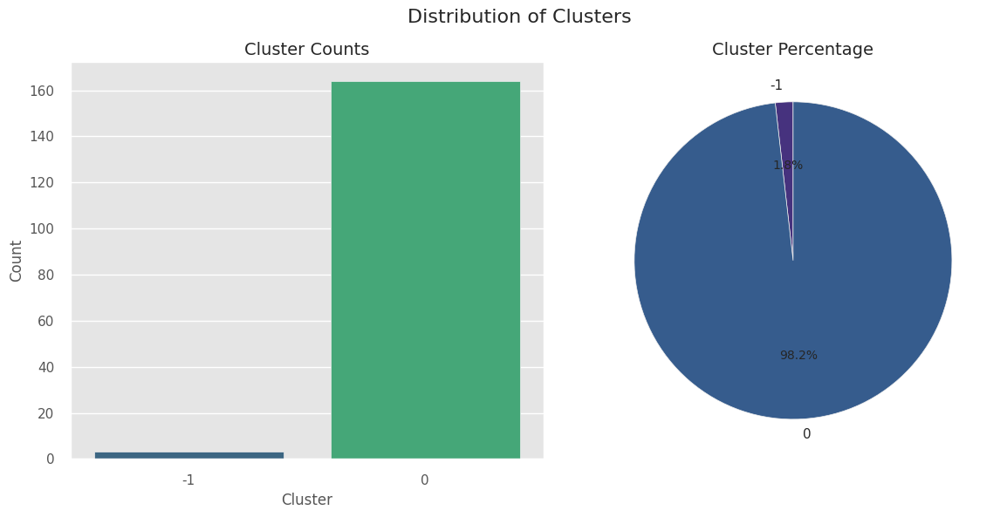

In [154]:
check_result(df_dbscan, plot=True)

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Mean Shift Model</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

-  • Mean Shift is a clustering algorithm that estimates the data density using a kernel function (usually Gaussian).

 • It shifts each point toward areas of higher density, helping to find the cluster “modes” (centers).

 • The algorithm works in both data space and feature space to simplify the computation.

 • A key parameter is the bandwidth:

 • Small bandwidth → detects fine details but may overfit.
 
 • Large bandwidth → smoother results but may miss small clusters

In [155]:
bandwidth = estimate_bandwidth(pcadff, n_samples=10, n_jobs=-1)
bandwidth

1.9782416189220668

In [156]:
# select the bandwidth manually
m_shift = MeanShift(bandwidth=bandwidth)
m_shift.fit(pcadff)
pred = m_shift.labels_
np.unique(pred)
sh_score = silhouette_score(pcadff, pred)
ch_score = calinski_harabasz_score(pcadff, pred)
print(f"Number Of Clusters: {np.unique(pred)}")
print(f"Silhouette Coefficient: {sh_score}")
print(f"Calinski Harabasz Coefficient: {ch_score}")

Number Of Clusters: [0 1 2 3 4]
Silhouette Coefficient: 0.48103301235523915
Calinski Harabasz Coefficient: 43.756760467879026


In [157]:
best_model.loc[len(best_model.index)] = [f"Mean Shift",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]

In [158]:
centroids = m_shift.cluster_centers_
centroids = pd.DataFrame(data=centroids, columns = [pcadff.columns])
centroids.T

,0,1,2,3,4
pc1,-0.161004,6.056030,12.648065,6.590407,-3.931802
pc2,-0.787925,1.734531,8.276683,2.950919,3.821230
pc3,0.043243,-0.123452,-0.619787,-0.320267,7.928939
pc4,0.288348,-2.226255,4.398488,3.485423,-0.540160


In [159]:
df_mshift = pd.concat([pcadff, pd.DataFrame({'cluster': pred}, index=pcadff.index)], axis = 1)
df_mshift

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,0
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,0
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


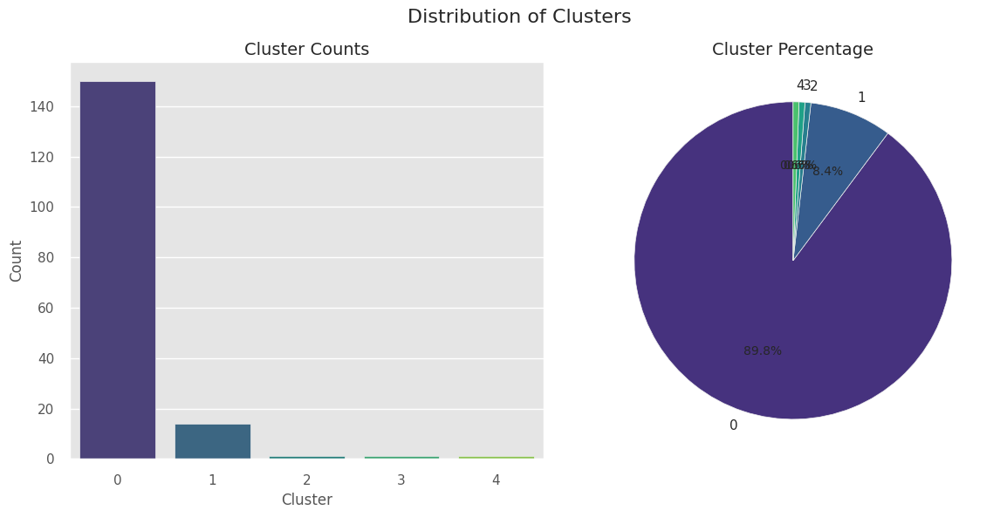

In [160]:
check_result(df_mshift, plot=True)


<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">BIRCH Model</p>

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- BIRCH is a clustering algorithm ideal for large datasets.

 • It doesn’t cluster raw data points directly — instead, it creates compact summaries (called CFs: Clustering Features).

 • These summaries retain key information and can be clustered efficiently.

 • BIRCH is often used in combination with other algorithms (e.g., k-means on CFs).
 
 • ⚠️ Limitation: BIRCH only works with numerical data — categorical features need preprocessing.

Number of Clusters:


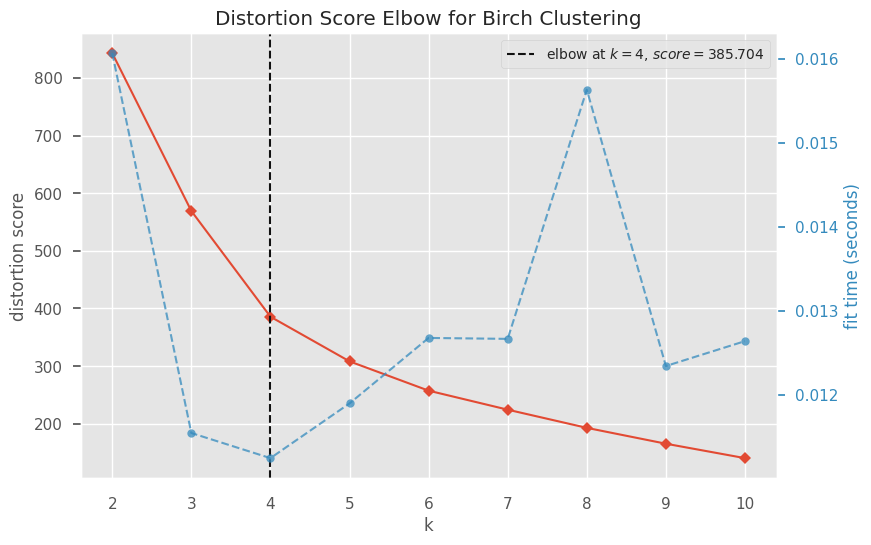

<Axes: title={'center': 'Distortion Score Elbow for Birch Clustering'}, xlabel='k', ylabel='distortion score'>

In [161]:
from yellowbrick.cluster import KElbowVisualizer
BP = Birch(threshold=0.0001)
print('Number of Clusters:')
Elbow_M = KElbowVisualizer(BP, k=10)
Elbow_M.fit(pcadff)
Elbow_M.show()

The optimal value for k is equal to 4

In [162]:
silhouette = []
for k in range(2,11):
    birch = Birch(n_clusters=k, threshold=0.0001)
    birch.fit(pcadff)
    score = silhouette_score(pcadff, birch.labels_)
    silhouette.append(score)
calinski_harabasz = []
for k in range(2,11):
    birch = Birch(n_clusters=k, threshold=0.0001)
    birch.fit(pcadff)
    score = calinski_harabasz_score(pcadff, birch.labels_)
    calinski_harabasz.append(score)

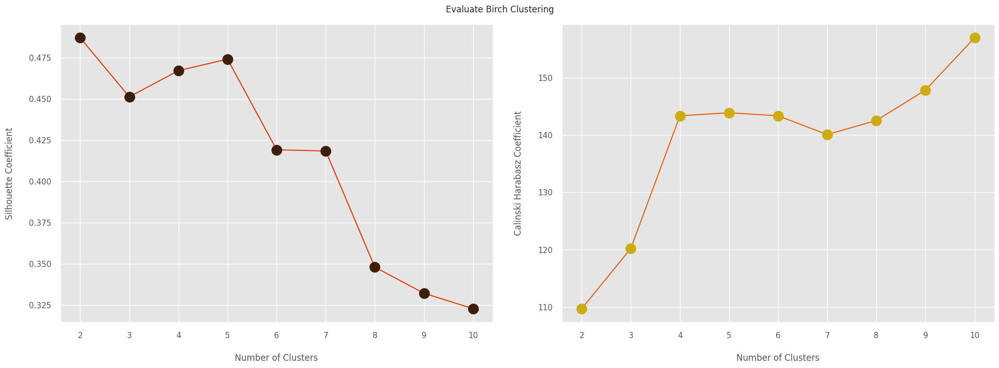

In [163]:
plot_evaluation(silhouette, calinski_harabasz, 'Birch')

we'll reapply the BIRCH algorithm with 4 clusters to see how it groups the data.

In [164]:
birch = Birch(n_clusters=2, threshold=0.0001)
birch.fit(df1)
pred = birch.labels_

In [165]:
best_model.loc[len(best_model.index)] = [f"BIRCH",silhouette_score(pcadff, pred),calinski_harabasz_score(pcadff, pred)]


In [166]:
df_birch = pd.concat([pcadff, pd.DataFrame(pred, columns=['cluster'],index=pcadff.index)], axis = 1)
df_birch

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,0
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,0
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


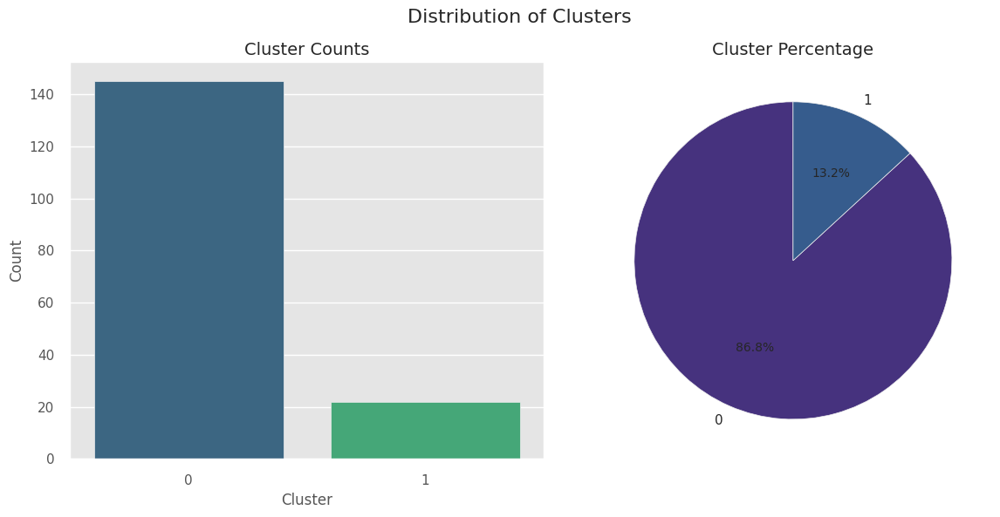

In [167]:
check_result(df_birch, plot=True)

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">Conclusion & Comparision Models</p>

In [168]:
best_model

,model,sil_score,ch_score
0,Kmeans,0.456423,124.699147
1,Mini Batch Kmeans,0.464286,125.945448
2,GMM,0.198376,71.895555
3,BG,0.434549,128.416368
4,Agglomerative,0.467042,143.346015
5,DBSCAN,0.719670,26.040563
6,Mean Shift,0.481033,43.756760
7,BIRCH,0.524847,94.288170


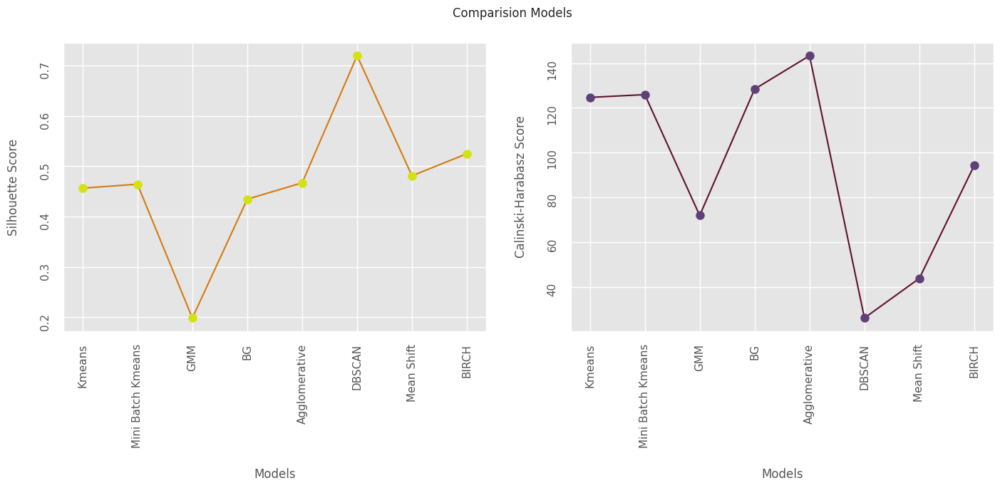

In [169]:
fig, ax = plt.subplots(1,2,figsize=(15,5), dpi=100)
ax[0].plot(best_model.model, best_model.sil_score, marker='o', c="#d67a10", ms=9, mfc="#D4E211")
ax[1].plot(best_model.model, best_model.ch_score, marker='o', c="#61112f", ms=9, mfc="#5f4177")
ax[0].set_xlabel("Models", labelpad=20)
ax[0].set_ylabel("Silhouette Score", labelpad=20)
ax[1].set_xlabel("Models", labelpad=20)
ax[1].set_ylabel("Calinski-Harabasz Score", labelpad=20)
ax[0].tick_params(labelrotation=90) 
ax[1].tick_params(labelrotation=90) 
plt.suptitle(f'Comparision Models')
plt.show()

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 📊 Clustering Evaluation Summary

 • Silhouette Score: Ranges from -1 to 1 → higher is better.

 • Calinski-Harabasz Score: No upper limit → higher is better.

⸻

🧠 Model Comparison:

 • DBSCAN → Highest Silhouette score, but low CH score.

 • Affinity Propagation → Highest CH score, but low Silhouette.

 • KMeans → Good overall, but outperformed by two others.

 • ✅ MiniBatch KMeans & Agglomerative → Best performance overall.
 
 • MiniBatch KMeans is the most efficient final choice due to its speed and strong metrics. 

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">🎯 Mini Batch Kmeans Visualization</p>

In [170]:
df_mbkmeans

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,1
Albania,-0.024206,-1.429892,-0.014123,0.450645,0
Algeria,-0.459557,-0.675495,0.959355,0.218456,0
Angola,-2.722630,2.172332,0.600215,-0.433978,1
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,0
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,0
Venezuela,-0.314228,-0.016266,3.680273,0.011835,0
Vietnam,-0.594449,-1.076335,0.528875,0.508854,0


In [171]:
minibatchmeans = MiniBatchKMeans(n_clusters=4, random_state=42).fit(pcadff)
pred2 = minibatchmeans.labels_
mbkmeans_result2 = pd.concat([df2, pd.DataFrame(pred2, columns=['cluster'], index=df2.index)], axis = 1)
display(mbkmeans_result2)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
country,,,,,,,,,,
Afghanistan,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553,0
Albania,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090,2
Algeria,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460,2
Angola,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530,0
Antigua and Barbuda,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...
Vanuatu,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970,2
Venezuela,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500,2
Vietnam,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310,2


<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 📍With 52.7% of the data points, Cluster 3 has the highest representation among all clusters.

 • 📍The majority of data points — 52.7% — fall into Cluster 3, making it the most populated cluster.

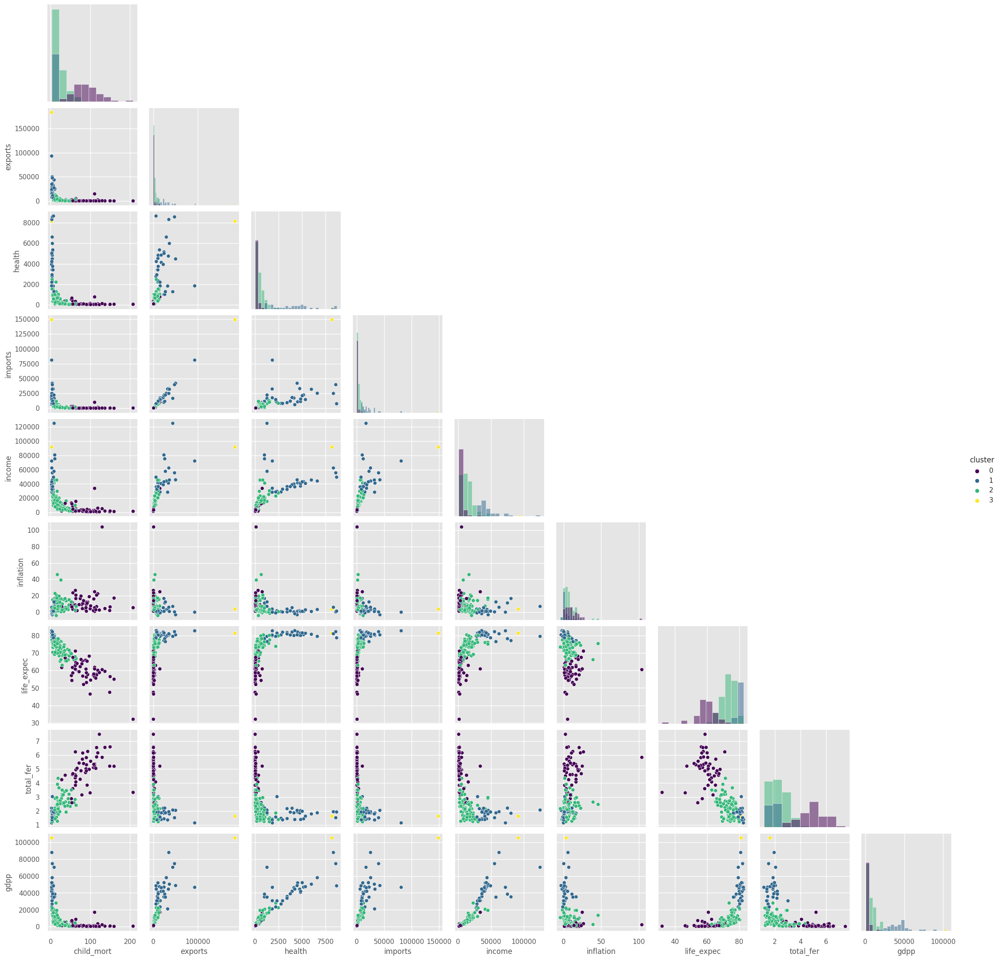

In [172]:
columns = ['child_mort', 'exports', 'health','imports', 'income', 'inflation','life_expec', 'total_fer','gdpp','cluster']
sns.pairplot(mbkmeans_result2[columns], hue='cluster', corner=True, diag_kind="hist", palette="viridis")

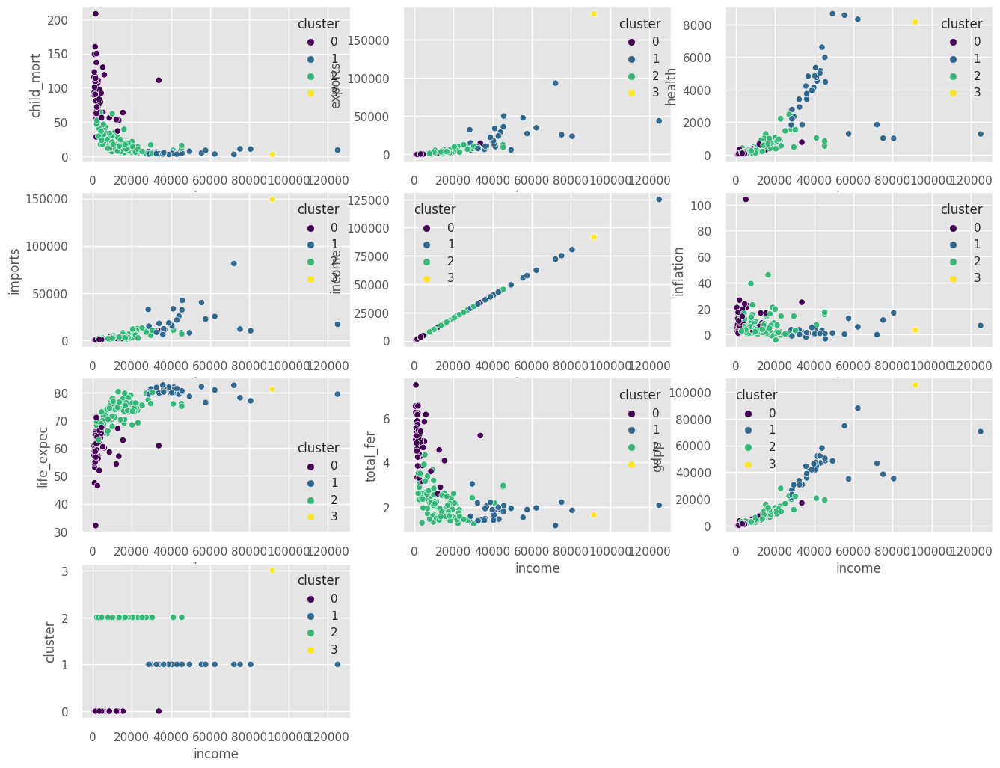

In [173]:
fig=plt.figure(figsize=(14,24))
for i,col in enumerate(columns):
    ax=fig.add_subplot(8,3,i+1)
    sns.scatterplot(x='income',y=col,hue='cluster',data=mbkmeans_result2,palette="viridis")

In [174]:
columns1 = ['child_mort', 'exports', 'health','imports', 'income', 'inflation','life_expec', 'total_fer','gdpp']


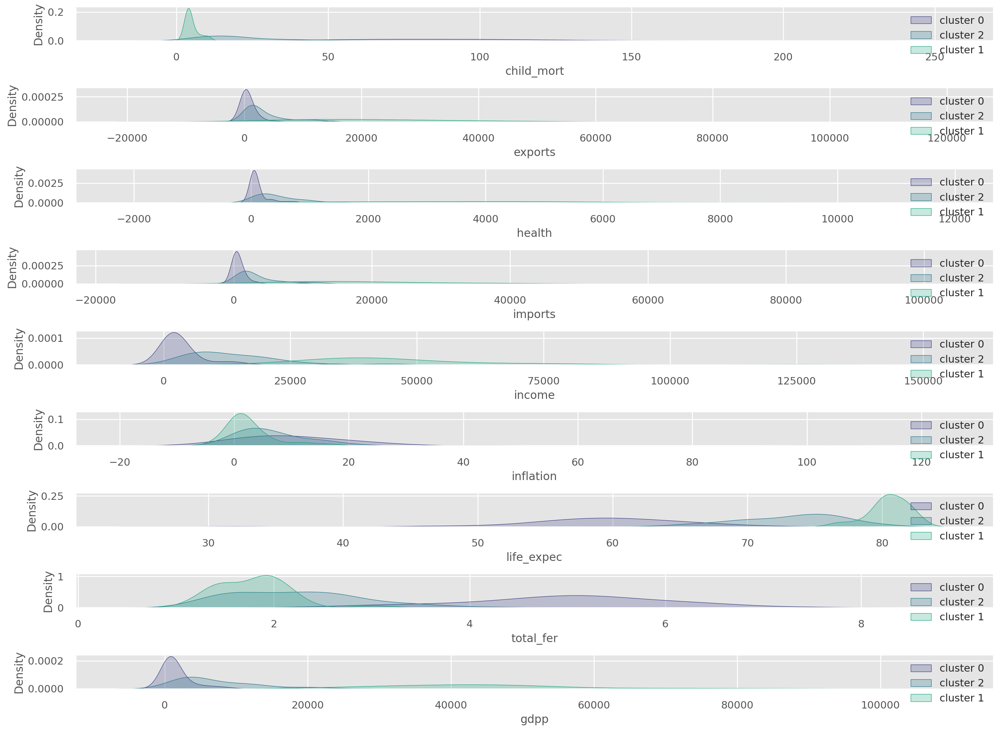

In [175]:
plt.figure(figsize=(15, 200), dpi=200)
num_cols = len(mbkmeans_result2) - 1
colors = sns.color_palette("viridis", len(mbkmeans_result2['cluster'].unique()))
for i, column in enumerate(mbkmeans_result2.drop(columns=['cluster']), start=1):
    plt.subplot(num_cols, 1, i)
    for cluster_val, color in zip(mbkmeans_result2['cluster'].unique(), colors):
        sns.kdeplot(mbkmeans_result2[mbkmeans_result2['cluster'] == cluster_val][column], 
                   shade=True,fill=True, label=f'cluster {cluster_val}', color=color)
    plt.xlabel(column)
    plt.legend()
plt.tight_layout()
plt.show()

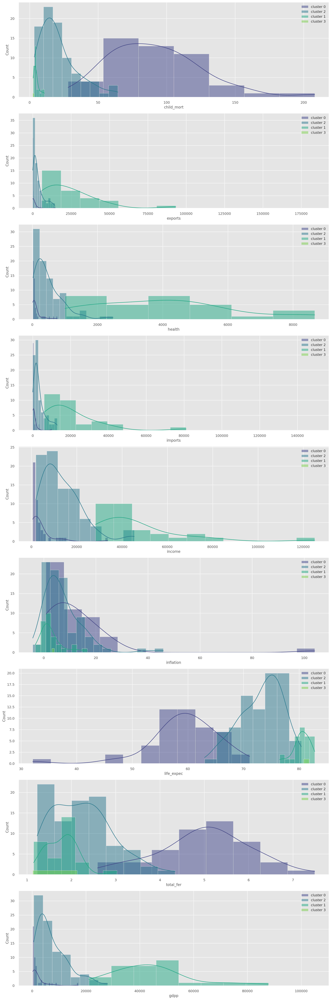

In [176]:
plt.figure(figsize=(15, 45), dpi=200)
num_cols = len(mbkmeans_result2.columns) - 1
colors = sns.color_palette("viridis", len(mbkmeans_result2['cluster'].unique()))
for i, column in enumerate(mbkmeans_result2.drop(columns=['cluster']), start=1):
    plt.subplot(num_cols, 1, i)
    for cluster_val, color in zip(mbkmeans_result2['cluster'].unique(), colors):
        sns.histplot(mbkmeans_result2[mbkmeans_result2['cluster'] == cluster_val][column],
                     label=f'cluster {cluster_val}', kde=True, color=color)
    plt.xlabel(column)
    plt.legend()
plt.tight_layout()
plt.show()

<Figure size 4000x6000 with 0 Axes>

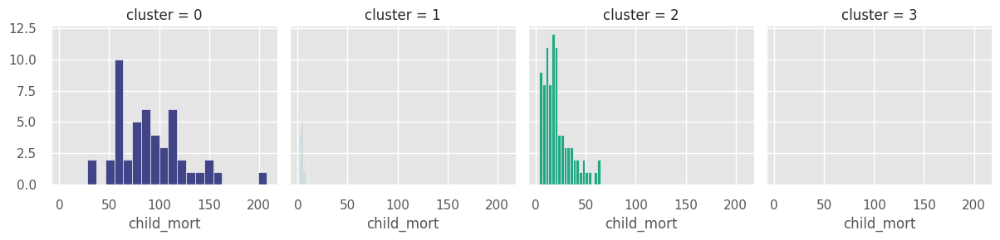

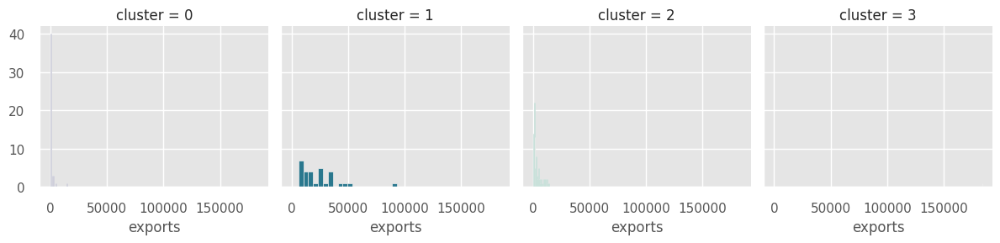

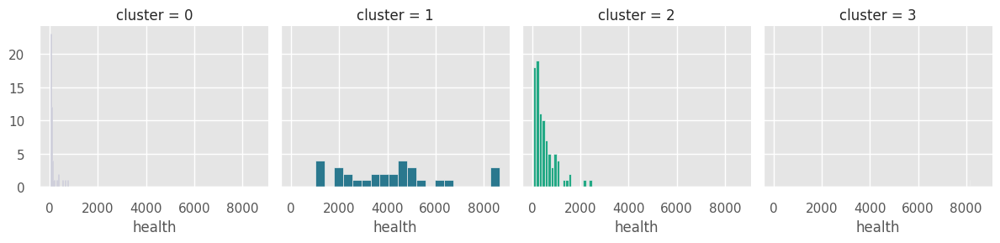

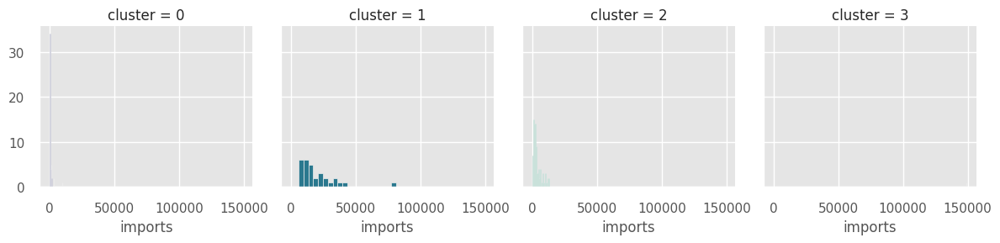

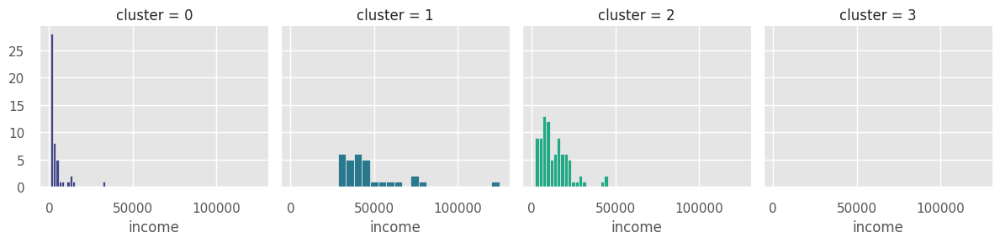

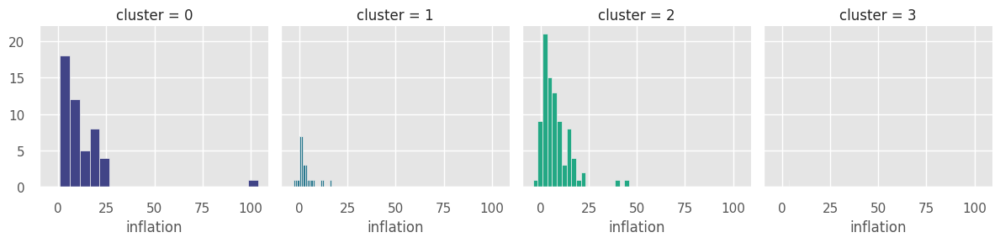

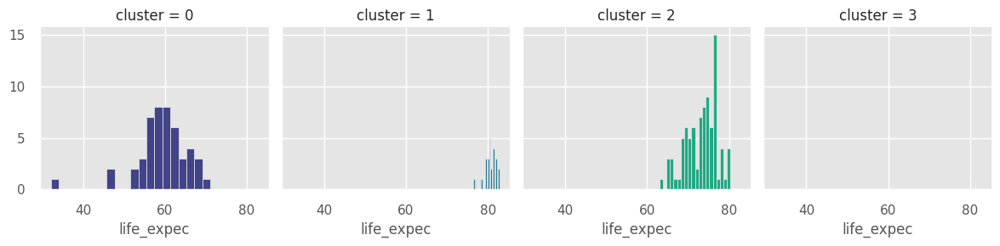

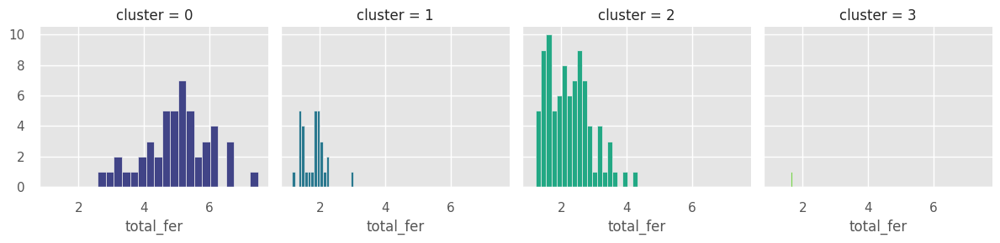

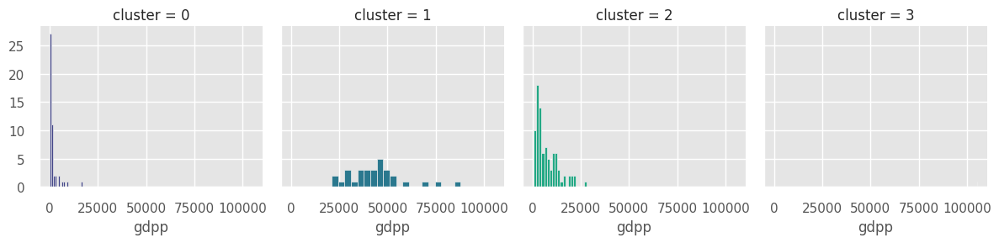

In [177]:
import matplotlib.pyplot as plt 
plt.figure(figsize=(20, 30), dpi=200)
for column in mbkmeans_result2.drop(columns=['cluster']):
    ax = sns.FacetGrid(mbkmeans_result2, col='cluster',hue='cluster',palette="viridis")
    ax.map(plt.hist, column,bins=20)

In [178]:
cont = dff.iloc[:,0:11].set_index('country', drop=True)
cont

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Continent
country,,,,,,,,,,
Afghanistan,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553,Asia
Albania,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090,Europe
Algeria,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460,Africa
Angola,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530,Africa
Antigua and Barbuda,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200,North America
...,...,...,...,...,...,...,...,...,...,...
Vanuatu,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970,Oceania
Venezuela,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500,South America
Vietnam,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310,Asia


In [179]:
mbkmeans_df3 = mbkmeans_result2.copy(deep=True)
mbkmeans_df3.insert(0,'Continent',cont.Continent)
mbkmeans_df3

,Continent,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
country,,,,,,,,,,,
Afghanistan,Asia,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553,0
Albania,Europe,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090,2
Algeria,Africa,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460,2
Angola,Africa,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530,0
Antigua and Barbuda,North America,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
Vanuatu,Oceania,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970,2
Venezuela,South America,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500,2
Vietnam,Asia,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310,2


In [180]:
def check_result2(data, m):
    fig, axes = plt.subplots(1,2,figsize=(20,8))
    sns.countplot(data=data, x='Continent', ax=axes[0], palette="viridis")
    for container in axes[0].containers:
        axes[0].bar_label(container, label_type="center", padding=5, size=12, color="white", rotation=0,
        bbox={"boxstyle": "round", "alpha": 1})
    slices = data['Continent'].value_counts().sort_index().values
    activities = [var for var in data['Continent'].value_counts().sort_index().index]
    wedges, texts, autotexts = axes[1].pie(slices,labels=activities,autopct='%1.1f%%',textprops=dict(size=16, color="black"),pctdistance = 0.5,
        radius=1, colors = sns.color_palette('viridis'), )
    plt.legend(wedges, data.Continent.value_counts().sort_index().index, title="Continents",bbox_to_anchor=(1, 0, 0.5, 1),edgecolor = "black")
    plt.suptitle(f'Count of Each Continent in Each Cluster {m}')
    plt.show()

In [181]:
mbkcluster0 = mbkmeans_df3[mbkmeans_df3.cluster == 0]
mbkcluster1 = mbkmeans_df3[mbkmeans_df3.cluster == 1]
mbkcluster2 = mbkmeans_df3[mbkmeans_df3.cluster == 2]
mbkcluster3 = mbkmeans_df3[mbkmeans_df3.cluster == 3]

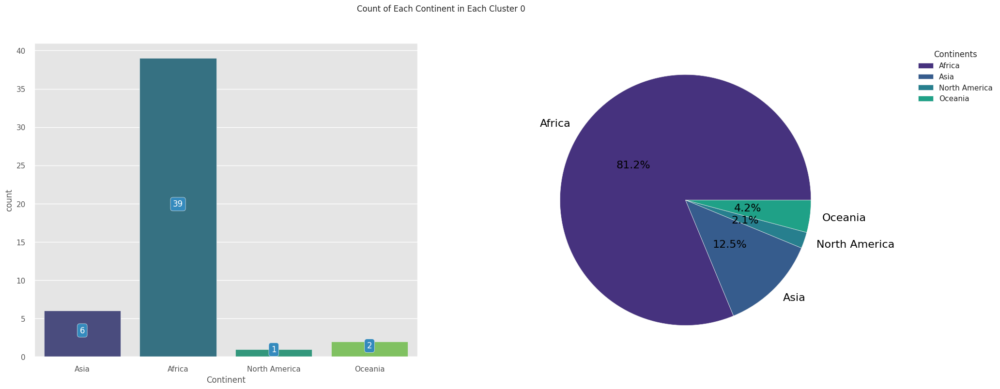

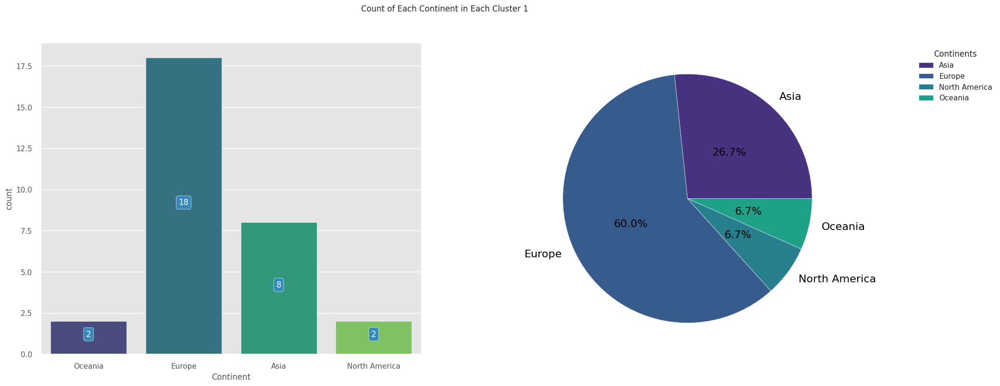

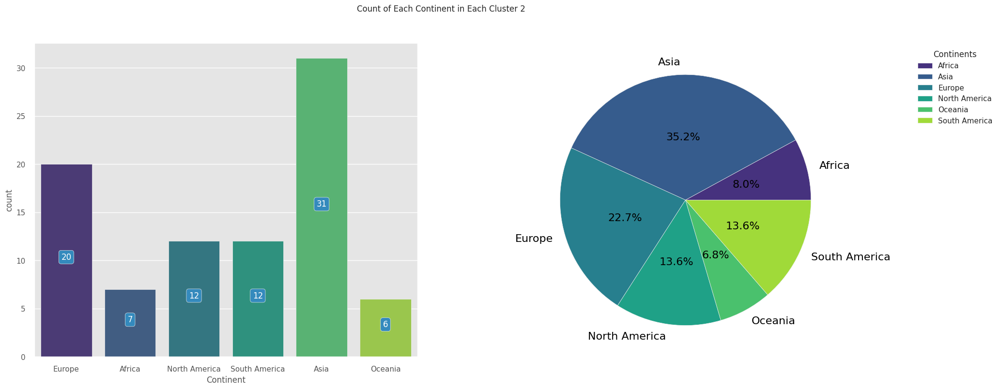

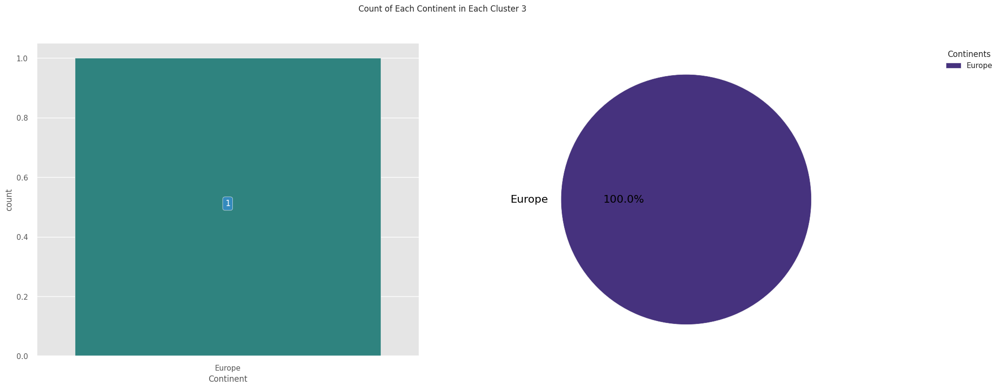

In [182]:
for i, item in enumerate([mbkcluster0, mbkcluster1, mbkcluster2, mbkcluster3]):
    check_result2(item, i)

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">

- 📊 MiniBatch KMeans Clustering Summary (4 Clusters)

 • 🔴 Cluster 0: Developed countries (mostly European)

→ High GDP, trade, health spending, life expectancy; low inflation & mortality.

 • 🟢 Cluster 1: Least developed countries (mostly African)

→ Low GDP, trade, health; high fertility, inflation & child mortality.

✅ Recommended for aid.

 • 🟠 Cluster 2: Only Luxembourg

→ Exceptionally high in all development indicators.

 • 🔵 Cluster 3: Moderately developed (Asian & South American nations)
→ Average in most metrics.📊 MiniBatch KMeans Clustering Summary (4 Clusters)

 • 🔴 Cluster 0: Developed countries (mostly European)

→ High GDP, trade, health spending, life expectancy; low inflation & mortality.

 • 🟢 Cluster 1: Least developed countries (mostly African)

→ Low GDP, trade, health; high fertility, inflation & child mortality.

✅ Recommended for aid.

 • 🟠 Cluster 2: Only Luxembourg

→ Exceptionally high in all development indicators.

 • 🔵 Cluster 3: Moderately developed (Asian & South American nations)
→ Average in most metrics.

<a id="ml"></a>
# <p style="background-color:#ff69b4;font-family:newtimeroman;font-size:100%;color:black;text-align:center;border-radius:15px 50px; padding:7px;border: 1px solid black;">🎯 Agglomerative Visualization</p>

In [183]:
pcadff_agg

,pc1,pc2,pc3,pc4,cluster
country,,,,,
Afghanistan,-2.635575,1.472267,-0.549489,-0.242326,0
Albania,-0.024206,-1.429892,-0.014123,0.450645,2
Algeria,-0.459557,-0.675495,0.959355,0.218456,2
Angola,-2.722630,2.172332,0.600215,-0.433978,0
Antigua and Barbuda,0.648597,-1.023437,-0.257430,0.289201,2
...,...,...,...,...,...
Vanuatu,-1.175210,-0.275652,-0.667131,0.279628,2
Venezuela,-0.314228,-0.016266,3.680273,0.011835,2
Vietnam,-0.594449,-1.076335,0.528875,0.508854,2


In [184]:
agg = AgglomerativeClustering(n_clusters=4)
agg.fit(pcadff)
pred2 = agg.labels_
aggg2 = pd.concat([df2, pd.DataFrame(pred2, columns=['cluster'], index=df2.index)], axis = 1)
display(aggg2)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
country,,,,,,,,,,
Afghanistan,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553,0
Albania,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090,2
Algeria,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460,2
Angola,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530,0
Antigua and Barbuda,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...
Vanuatu,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970,2
Venezuela,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500,2
Vietnam,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310,2


📍The highest frequency between this model's clusters belongs to cluster 2 with 49.1% of the data.

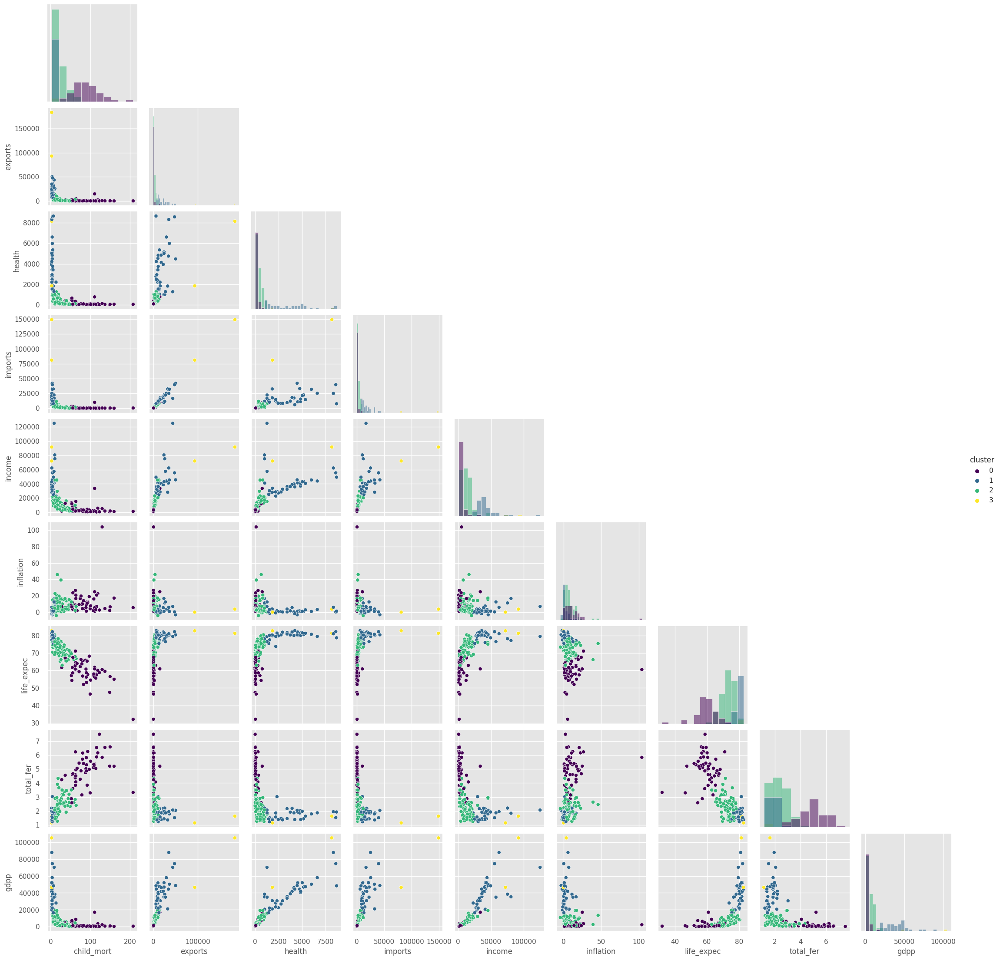

In [185]:
columns = ['child_mort', 'exports', 'health','imports', 'income', 'inflation','life_expec', 'total_fer','gdpp','cluster']
sns.pairplot(aggg2[columns], hue='cluster', corner=True, diag_kind="hist", palette="viridis")

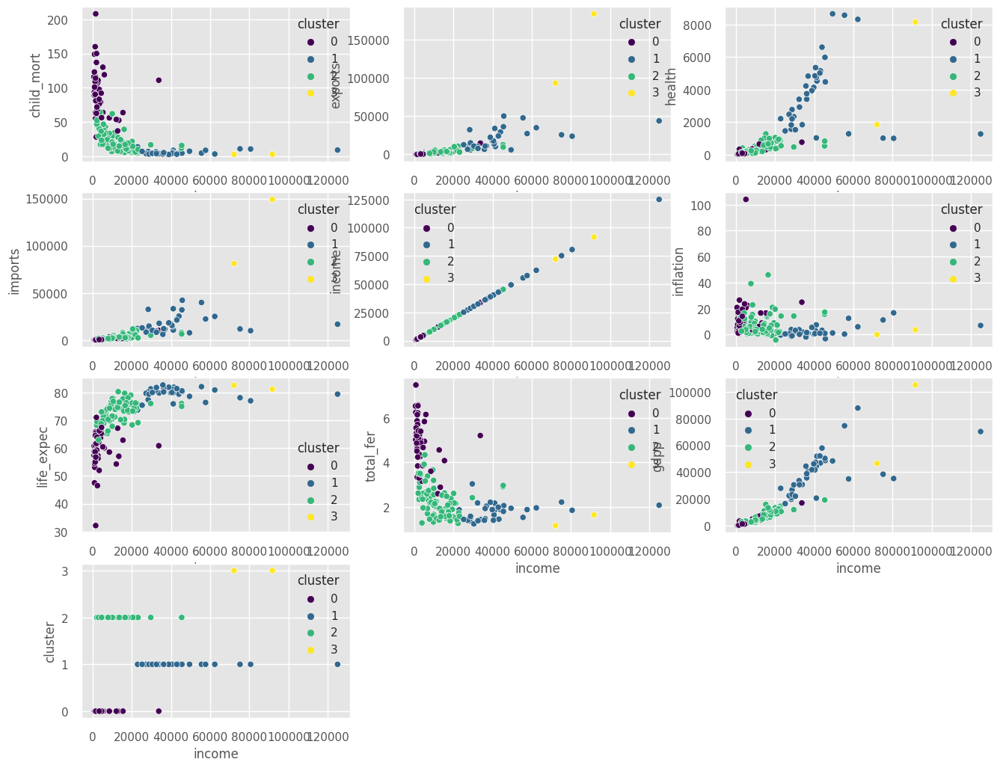

In [186]:
fig=plt.figure(figsize=(14,24))
for i,col in enumerate(columns):
    ax=fig.add_subplot(8,3,i+1)
    sns.scatterplot(x='income',y=col,hue='cluster',data=aggg2,palette="viridis")

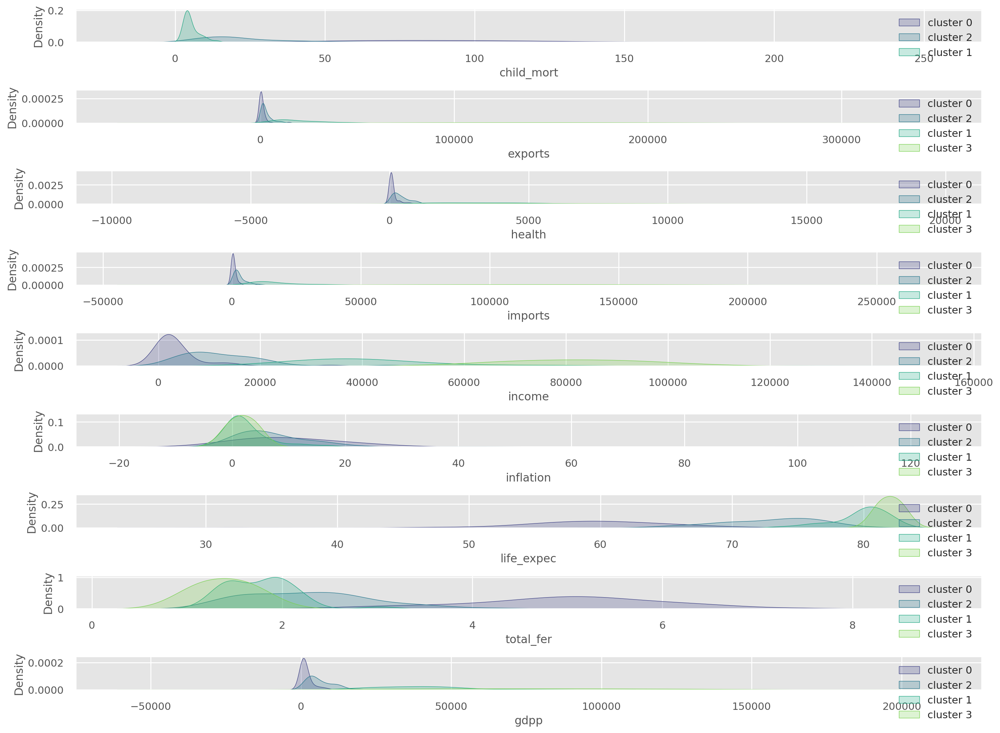

In [187]:
plt.figure(figsize=(15, 200), dpi=200)
num_cols = len(aggg2) - 1
colors = sns.color_palette("viridis", len(aggg2['cluster'].unique()))
for i, column in enumerate(aggg2.drop(columns=['cluster']), start=1):
    plt.subplot(num_cols, 1, i)
    for cluster_val, color in zip(aggg2['cluster'].unique(), colors):
        sns.kdeplot(aggg2[aggg2['cluster'] == cluster_val][column], 
                   shade=True,fill=True, label=f'cluster {cluster_val}', color=color)
    plt.xlabel(column)
    plt.legend()
plt.tight_layout()
plt.show()

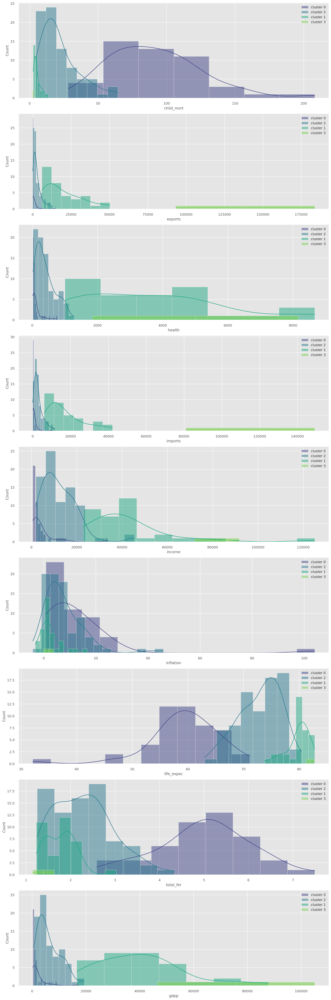

In [188]:
plt.figure(figsize=(15, 45), dpi=200)
num_cols = len(aggg2.columns) - 1
colors = sns.color_palette("viridis", len(aggg2['cluster'].unique()))
for i, column in enumerate(aggg2.drop(columns=['cluster']), start=1):
    plt.subplot(num_cols, 1, i)
    for cluster_val, color in zip(aggg2['cluster'].unique(), colors):
        sns.histplot(aggg2[aggg2['cluster'] == cluster_val][column],
                     label=f'cluster {cluster_val}', kde=True, color=color)
    plt.xlabel(column)
    plt.legend()
plt.tight_layout()
plt.show()

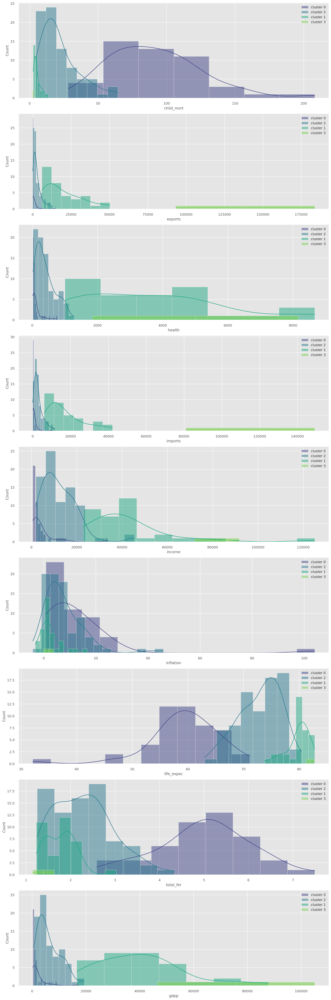

In [189]:
plt.figure(figsize=(15, 45), dpi=200)
num_cols = len(aggg2.columns) - 1
colors = sns.color_palette("viridis", len(aggg2['cluster'].unique()))
for i, column in enumerate(aggg2.drop(columns=['cluster']), start=1):
    plt.subplot(num_cols, 1, i)
    for cluster_val, color in zip(aggg2['cluster'].unique(), colors):
        sns.histplot(aggg2[aggg2['cluster'] == cluster_val][column],
                     label=f'cluster {cluster_val}', kde=True, color=color)
    plt.xlabel(column)
    plt.legend()
plt.tight_layout()
plt.show()

<Figure size 4000x6000 with 0 Axes>

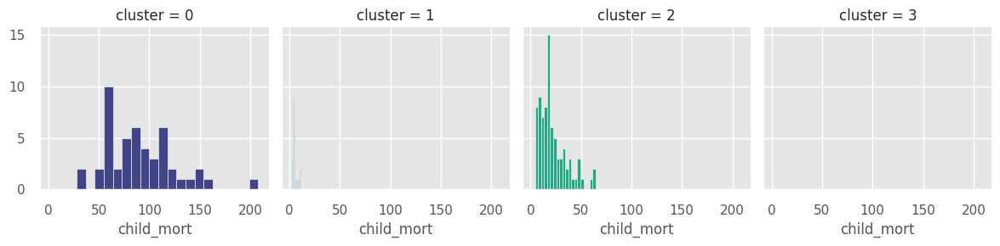

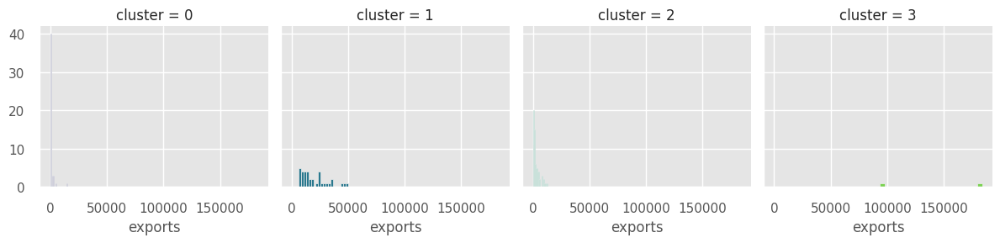

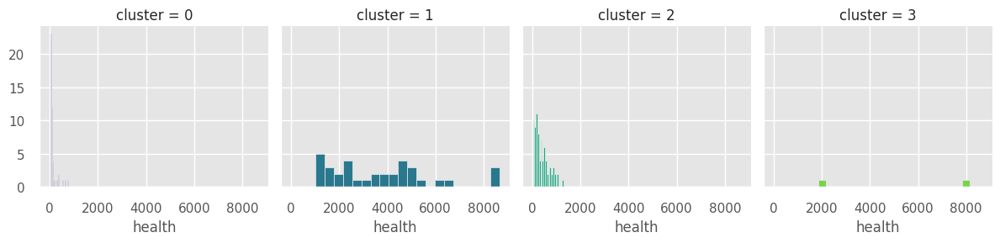

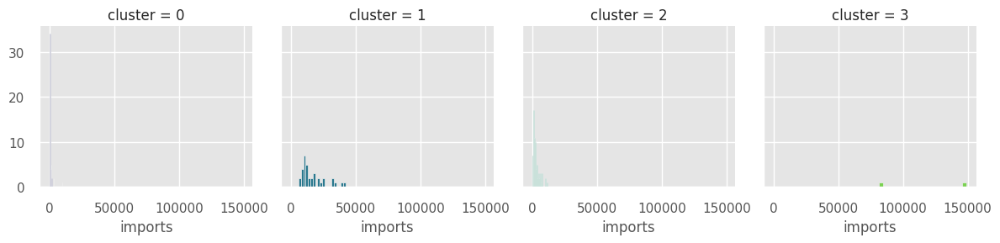

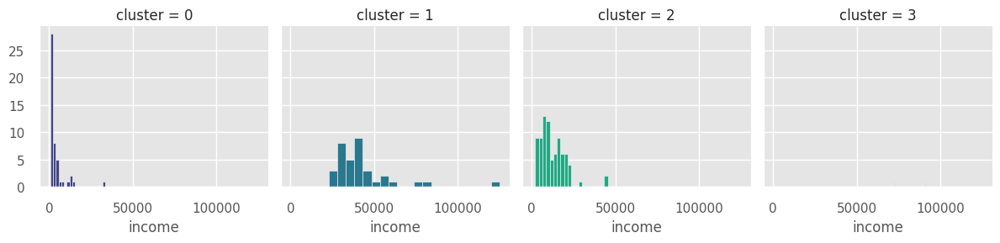

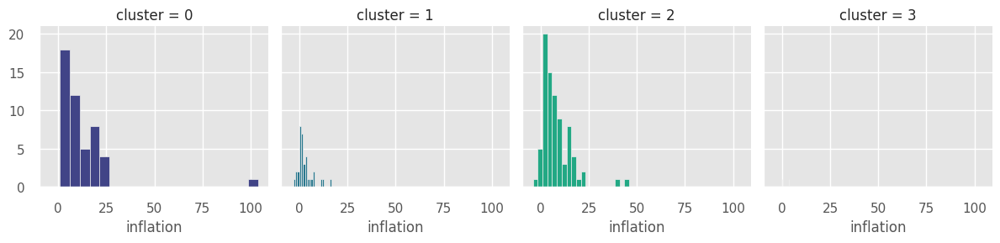

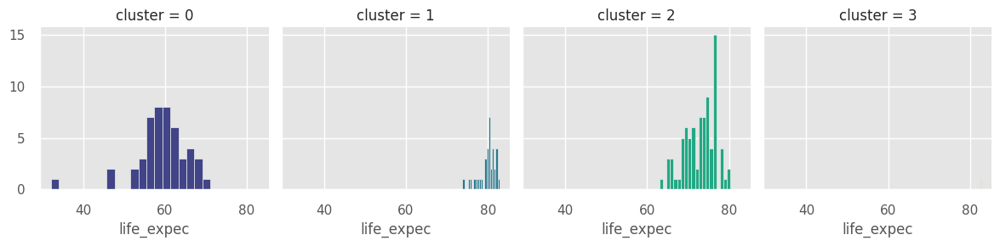

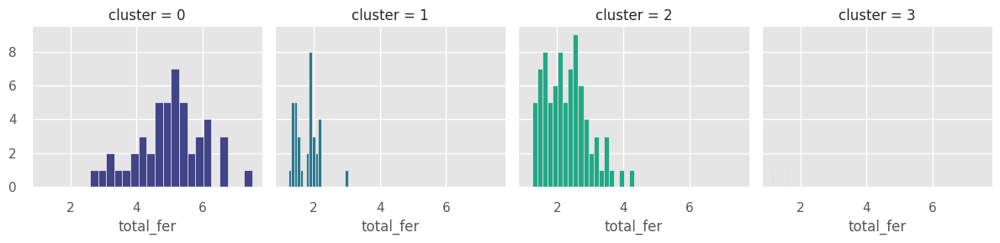

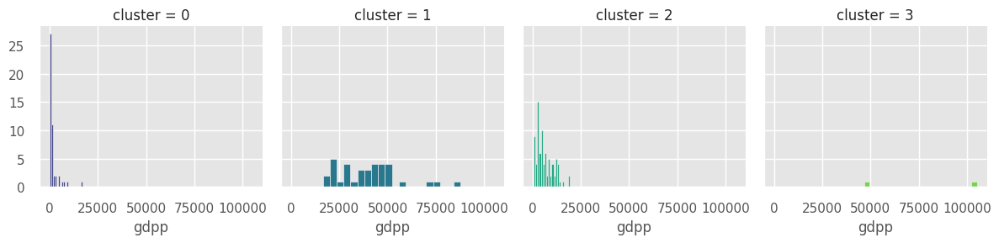

In [190]:
import matplotlib.pyplot as plt 
plt.figure(figsize=(20, 30), dpi=200)
for column in aggg2.drop(columns=['cluster']):
    ax = sns.FacetGrid(aggg2, col='cluster',hue='cluster',palette="viridis")
    ax.map(plt.hist, column,bins=20)

In [191]:
agg3 = aggg2.copy(deep=True)
agg3.insert(0,'Continent',cont.Continent)
agg3

,Continent,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster
country,,,,,,,,,,,
Afghanistan,Asia,90.2,55.30,41.9174,248.297,1610,9.44,56.2,5.82,553,0
Albania,Europe,16.6,1145.20,267.8950,1987.740,9930,4.49,76.3,1.65,4090,2
Algeria,Africa,27.3,1712.64,185.9820,1400.440,12900,16.10,76.5,2.89,4460,2
Angola,Africa,119.0,2199.19,100.6050,1514.370,5900,22.40,60.1,6.16,3530,0
Antigua and Barbuda,North America,10.3,5551.00,735.6600,7185.800,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
Vanuatu,Oceania,29.2,1384.02,155.9250,1565.190,2950,2.62,63.0,3.50,2970,2
Venezuela,South America,17.1,3847.50,662.8500,2376.000,16500,45.90,75.4,2.47,13500,2
Vietnam,Asia,23.3,943.20,89.6040,1050.620,4490,12.10,73.1,1.95,1310,2


In [192]:
agg_cluster0 = agg3[agg3.cluster == 0]
agg_cluster1 = agg3[agg3.cluster == 1]
agg_cluster2 = agg3[agg3.cluster == 2]
agg_cluster3 = agg3[agg3.cluster == 3]

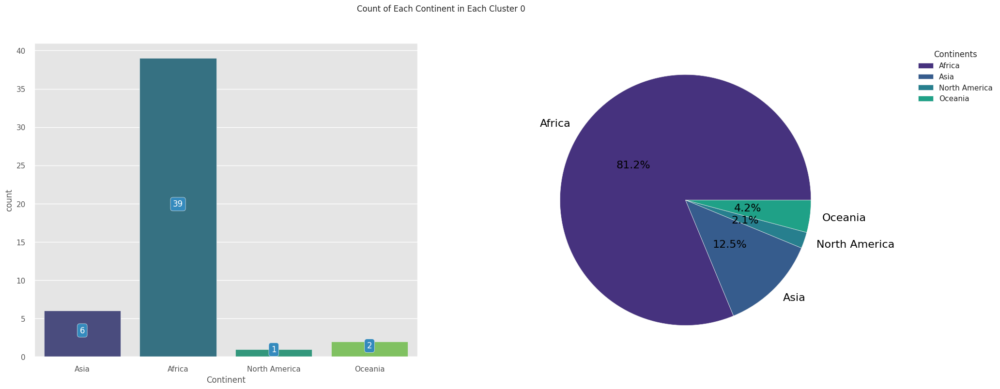

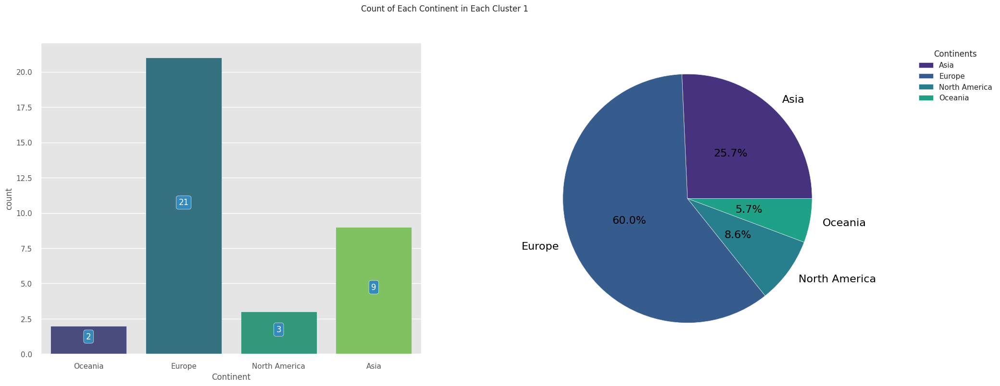

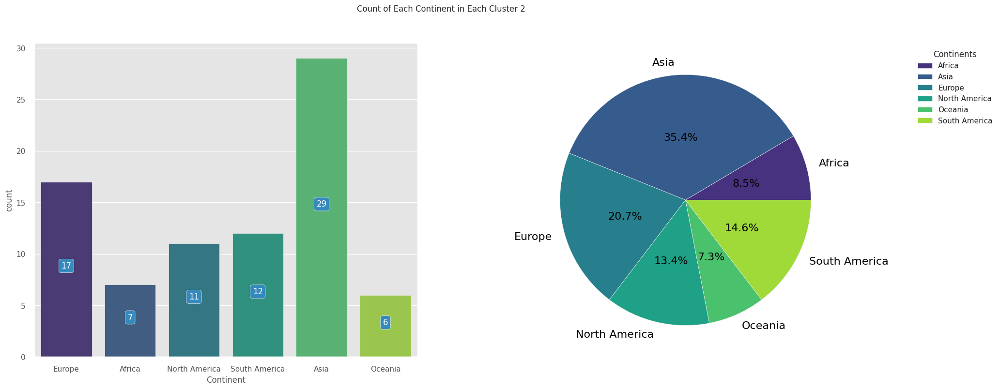

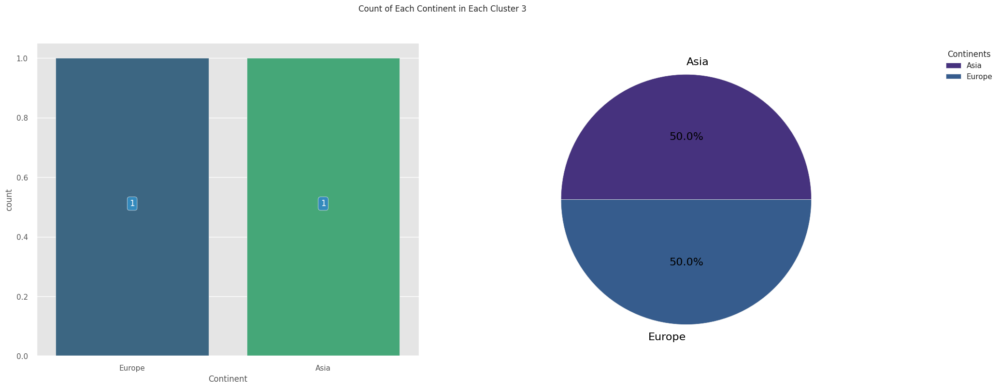

In [193]:
for i, item in enumerate([agg_cluster0, agg_cluster1, agg_cluster2, agg_cluster3]):
    check_result2(item, i)

<div style="border-radius:10px; border:#778da9 solid; padding: 15px; background-color:#e0e1dd
            ; font-size:110%; text-align:left">
⚪ Cluster 0 – Least Developed Countries:

Low GDP, low trade & health spending, high inflation, high fertility & child mortality, low life expectancy.

✅ Main target for financial aid.

 • 🟡 Cluster 1 – Highly Developed Countries:

High GDP, high trade & health investment, low fertility & mortality, high life expectancy.

 • 🟤 Cluster 2 – Moderately Developed Countries:

Average across all indicators, moderate inflation, better conditions than Cluster 0.

 • ⚫ Cluster 3 – Top Tier Countries (Luxembourg, Malta, Singapore):

Exceptional in all indicators — no financial aid needed.

⸻

💡 Key Recommendation

 • Focus aid efforts on Cluster 0 – especially in Central Africa, and countries like:

Burundi, Congo (DR), Niger, Sierra Leone, Haiti, Chad, Central African Republic, Mozambique.

 • Some Asian & South American countries may also need NGO support.
- 